<a href="https://colab.research.google.com/github/francesco-pastori/effects-of-data-preparation-on-algorithms/blob/main/notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and definition of utilities

##Import libraries and connection to Drive folder

In [ ]:
import pandas as pd

import numpy as np

from sklearn.datasets import make_regression, make_classification, make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LogisticRegression, BayesianRidge, Ridge
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, OPTICS, Birch
from sklearn import metrics
from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.utils import shuffle

import time as time

import matplotlib.pyplot as plt

In [ ]:
# Fixing the seed
SEED = 2023
np.random.seed(SEED)

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/DQ Plots

Mounted at /gdrive
/gdrive/My Drive/DQ Plots


## Utilities from SCRIPTS
In this section we report the useful codes for our assignemns from the files `projects.A_data_collection`, `projects.D_data_analysis` and `projects.E_plot_results`.

### Data collection

In [ ]:
def make_dataset_for_classification(n_samples, n_features, n_informative, n_redundant, n_repeated, n_classes, n_clusters_per_class, weights, flip_y, class_sep, hypercube, seed):
    X, y = make_classification(n_samples=n_samples, n_features=n_features, n_informative=n_informative, n_redundant=n_redundant,
                               n_repeated=n_repeated, n_classes=n_classes, n_clusters_per_class=n_clusters_per_class,
                               weights=weights, flip_y=flip_y, class_sep=class_sep, hypercube=hypercube, random_state=seed)
    return X, y

### Data analysis

In [ ]:
#CLASSIFICATION ALGORITHM

@ignore_warnings(category=ConvergenceWarning)
def classification(X, y, classifier, seed):
    X = StandardScaler().fit_transform(X)
    X = np.nan_to_num(X)
    clf = DecisionTreeClassifier()

    if classifier == "DecisionTree":
        clf = DecisionTreeClassifier()
    elif classifier == "LogisticRegression":
        clf = LogisticRegression()
    elif classifier == "KNN":
        clf = KNeighborsClassifier()
    elif classifier == "RandomForest":
        clf = RandomForestClassifier()
    elif classifier == "AdaBoost":
        clf = AdaBoostClassifier()
    elif classifier == "MLP":
        clf = MLPClassifier()

    #print("Training for "+classifier+"...")

    start = time.time()

    model_fit = clf.fit(X, y)

    cv = ShuffleSplit(n_splits=8, test_size=0.3, random_state=seed)

    model_scores = cross_val_score(model_fit, X, y, cv=cv, scoring="f1_weighted")

    stop = time.time()
    speed = stop - start

    f1_mean = model_scores.mean()

    return {"mean_perf": f1_mean,
            "distance": distance_measurement(X, y, classifier, False, seed),
            "speed": speed}

In [ ]:
def distance_measurement(X, y, method, regression, seed):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import f1_score, mean_squared_error

    X = StandardScaler().fit_transform(X)
    X = np.nan_to_num(X)

    N = 8
    distances_train_test = np.zeros(N)
    for i in range(0, N):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=seed + i)

        model = DecisionTreeClassifier()

        if method == "DecisionTree":
            model = DecisionTreeClassifier()
        elif method == "LogisticRegression":
            model = LogisticRegression()
        elif method == "KNN":
            model = KNeighborsClassifier()
        elif method == "RandomForest":
            model = RandomForestClassifier()
        elif method == "AdaBoost":
            model = AdaBoostClassifier()
        elif method == "MLP":
            model = MLPClassifier()
        elif method == "LinearRegressor":
            model = Ridge()
        elif method == "BayesianRidge":
            model = BayesianRidge()
        elif method == "GPRegressor":
            model = GaussianProcessRegressor()
        elif method == "SVMRegressor":
            model = LinearSVR()
        elif method == "KNNRegressor":
            model = KNeighborsRegressor()
        elif method == "MLPRegressor":
            model = MLPRegressor()

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_fit = model.predict(X_train)

        if regression:
            mse_pred = abs(mean_squared_error(y_test, y_pred, squared=False))
            mse_fit = abs(mean_squared_error(y_train, y_fit, squared=False))

            distances_train_test[i] = mse_pred - mse_fit
        else:
            weighted_f1_pred = f1_score(y_test, y_pred, average='weighted')
            weighted_f1_fit = f1_score(y_train, y_fit, average='weighted')

            distances_train_test[i] = weighted_f1_fit - weighted_f1_pred

    return distances_train_test.mean()

### Plot results

In [ ]:
from google.colab import files
your_path = "/gdrive/My Drive/DQ Plots/"

In [ ]:
#PLOT RESULT

def mean(results_all):
    list_mean = []
    for res in results_all:
        list_mean.append(res["mean_perf"])
    return list_mean

def distance(results_all):
    list_over = []
    for res in results_all:
        list_over.append(res["distance"])
    return list_over

def speed(results_all):
    list_speed = []
    for res in results_all:
        list_speed.append(res["speed"])
    return list_speed

def generateFigurePerformance(x_axis, xlabel, results_all, title, legend, score):

    plt.title(title)
    tot_mean_perf = []
    for i in range(0,len(results_all)):

        mean_perf = mean(results_all[i])

        plt.plot(x_axis, mean_perf, marker='o', label=legend[i], markersize=3)
        tot_mean_perf.append(mean_perf)
        #print(tot_mean_perf)

    df = pd.DataFrame(tot_mean_perf, index=legend, columns=x_axis)
    df.to_csv(title+'.csv', mode='a',index=True)
    #table = plt.table(cellText=df.values, colLabels=df.columns,rowLabels=df.index, loc='bottom',bbox=[0, -0.3, 4, 0.2])
    #table.auto_set_font_size(False)
    #table.set_fontsize(10)
    display(df)


    plt.xlabel(xlabel)
    plt.ylabel(score)
    plt.legend()
    #plt.ylim(0.1, 2)  # if you want to fix a limit for the y_axis
    plt.savefig(your_path + title + ".png", bbox_inches='tight') # if you want to save the figure
    plt.show()

def generateFigureDistance(x_axis, xlabel, results_all, title, legend, score):

    plt.title(title)
    tot_dist_perf = []

    for i in range(0,len(results_all)):

        distance_perf = distance(results_all[i])

        plt.plot(x_axis, distance_perf, marker='o', label=legend[i], markersize=3)
        tot_dist_perf.append(distance_perf)

    df = pd.DataFrame(tot_dist_perf, index=legend, columns=x_axis)
    df.to_csv(title+'.csv', mode='a',index=True)
    #table = plt.table(cellText=df.values, colLabels=df.columns,rowLabels=df.index, loc='bottom',bbox=[0, -0.3, 4, 0.2])
    #table.auto_set_font_size(False)
    #table.set_fontsize(10)
    display(df)

    plt.xlabel(xlabel)
    plt.ylabel(score)
    plt.legend()
    #plt.ylim(0.1, 2) # if you want to fix a limit for the y_axis
    plt.savefig(your_path + title + ".png", bbox_inches='tight') # if you want to save the figure
    plt.show()

def generateFigureSpeed(x_axis, xlabel, results_all, title, legend, score):

    plt.title(title)
    tot_speed_perf = []

    for i in range(0,len(results_all)):

        speed_perf = speed(results_all[i])

        plt.plot(x_axis, speed_perf, marker='o', label=legend[i], markersize=3)
        tot_speed_perf.append(speed_perf)

    df = pd.DataFrame(tot_speed_perf, index=legend, columns=x_axis)
    df.to_csv(title+'.csv', mode='a',index=True)
    #table = plt.table(cellText=df.values, colLabels=df.columns,rowLabels=df.index, loc='bottom',bbox=[0, -0.3, 4, 0.2])
    #table.auto_set_font_size(False)
    #table.set_fontsize(10)
    display(df)

    plt.xlabel(xlabel)
    plt.ylabel(score)
    plt.legend()
    #plt.ylim(0.1, 2)  # if you want to fix a limit for the y_axis
    plt.savefig(your_path + title + ".png", bbox_inches='tight') # if you want to save the figure
    plt.show()

def plot(x_axis_values, x_label, results, title, algorithms, plot_type):

    title = str(title)

    if plot_type == "performance":
        if algorithms[0] == "DecisionTree":
            generateFigurePerformance(x_axis_values, x_label, results, title, algorithms, "f1 weighted")
        elif algorithms[0] == "LinearRegressor":
            generateFigurePerformance(x_axis_values, x_label, results, title, algorithms, "RMSE")
        else:
            generateFigurePerformance(x_axis_values, x_label, results, title, algorithms, "silhouette")

    elif plot_type == "distance train-test": # only for classification & regression
        if algorithms[0] == "DecisionTree":
            generateFigureDistance(x_axis_values, x_label, results, title, algorithms, "f1_train - f1_test")
        else:
            generateFigureDistance(x_axis_values, x_label, results, title, algorithms, "RMSE_test - RMSE_train")

    else:
        generateFigureSpeed(x_axis_values, x_label, results, title, algorithms, "speed")


# Main project
Our project addresses **duplication** and **dimensionality** problems, coupled with various **classification** algorithms.

## DQ1: Duplication


### Data collection
In this section, we create the "main" dataset. It will be polluted in the following steps, according to different percentages of duplicates and similarities. The parameters of the dataset are the default ones indicated in the guidelines.

In [ ]:
X, y = make_dataset_for_classification(n_samples=1000,
                                       n_features=5,
                                       n_informative=5,
                                       n_redundant=0,
                                       n_repeated=0,
                                       n_classes=2,
                                       n_clusters_per_class=2,
                                       weights=None,
                                       flip_y=0.01,
                                       class_sep=1.0,
                                       hypercube=True,
                                       seed=SEED)

#### Exploration
The creation is followed by a brief exploration phase, just to visualize the shape that the previous called function generates.

In [ ]:
# Turning the dataset into a dataframe to do exploration
df = pd.DataFrame(X, columns=[f"Feature{i}" for i in range(X.shape[1])])
df['Label'] = y.tolist()

In [ ]:
df.head()

,Feature0,Feature1,Feature2,Feature3,Feature4,Label
0,-3.044852,0.401225,1.876653,1.566605,-2.132950,1
1,1.445783,1.330753,1.140285,0.706253,2.422165,1
2,2.404213,1.620161,-0.710273,-3.793487,1.183956,1
3,1.573431,-0.558834,0.359672,0.777892,2.637753,0
4,-0.849001,2.114740,3.329424,-1.255837,-1.173801,1


In [ ]:
df.describe()

,Feature0,Feature1,Feature2,Feature3,Feature4,Label
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,-0.412924,0.553137,-0.011211,-0.558847,-0.113063,0.499000
std,1.645251,1.632377,1.561119,1.418718,1.900478,0.500249
min,-4.547693,-5.177543,-4.606016,-4.486288,-6.269763,0.000000
25%,-1.492642,-0.518644,-1.157154,-1.514788,-1.410745,0.000000
50%,-0.502763,0.655087,0.166307,-0.688277,0.077678,0.000000
75%,0.708740,1.615910,1.134561,0.343309,1.286961,1.000000
max,4.750400,5.291507,4.161042,3.534872,5.326312,1.000000


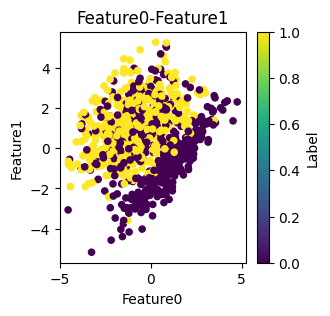

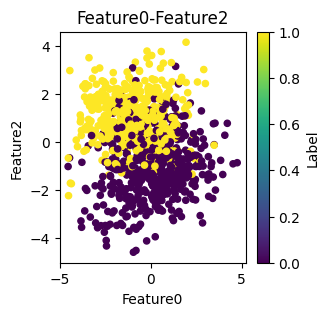

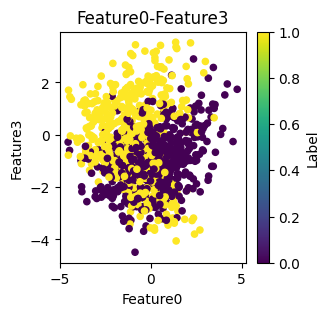

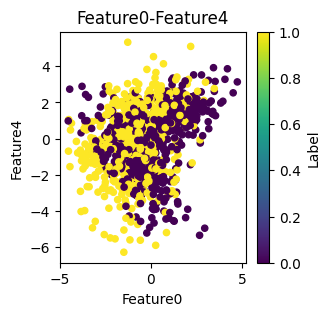

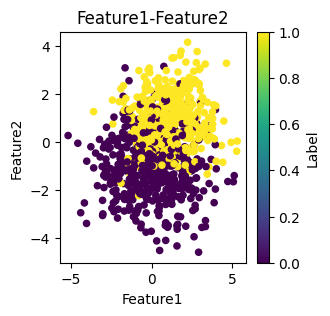

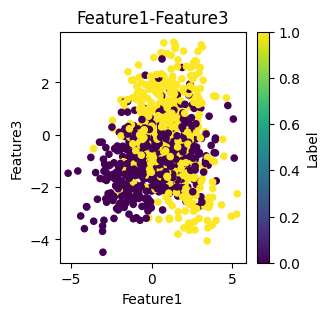

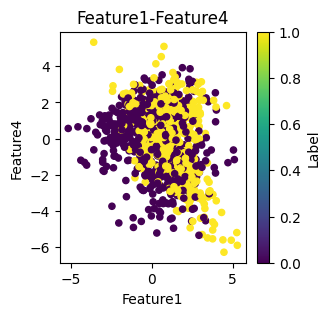

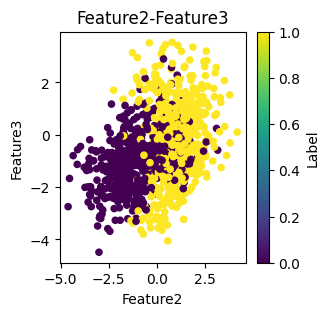

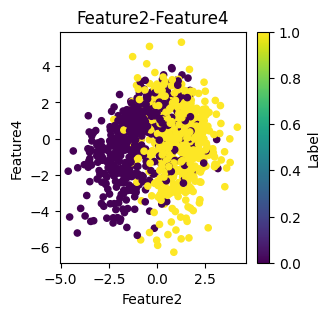

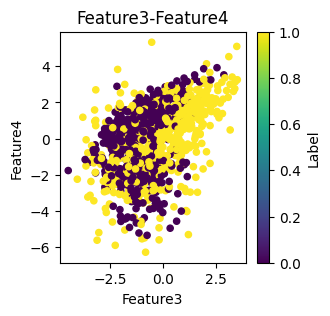

In [ ]:
# Creation of scatter plots
visited_cols = []
for col1 in df.columns:
  for col2 in df.columns:
    if col1 != col2 and col1 != 'Label' and col2 != 'Label' and col2 not in visited_cols:
      df.plot.scatter(x=col1,y=col2,c='Label',colormap='viridis',figsize=(3,3),title=str(col1)+"-"+str(col2))
  visited_cols.append(col1)

### Data pollution

#### Utility functions to generate duplicates
In this section are reported the two functions that are responsible for creating the duplicates. By duplicates we mean points that are **near** points from the original dataset drawn at random.

Given the percentage of duplicates that we want from the original dataset, we compute a smaller percentage of candidate rows that will be duplicated. Then, from this subset of rows, we sample with replacement, so that a row will be duplicated more than once.

In [ ]:
def extract_random_rows(data,labels,perc):

  # Append label array as column
  data['Label'] = y.tolist()

  # Compute how many rows are to be replicated
  to_dup = int(len(data.index) * perc)

  # We will extract just a subset of indexes
  sub_dup = int(to_dup * 0.05)

  # Extract random rows to duplicate
  indexes_to_dup = np.random.randint(0, len(data.index), size=sub_dup)
  #print(indexes_to_dup.shape, indexes_to_dup)

  # Then we will re-sample the extracted array
  # True replacement: samples can be extracted more than once
  rows_to_dup = np.random.choice(indexes_to_dup, size=to_dup, replace=True)
  #print(rows_to_dup.shape, rows_to_dup)

  # Dataframe of duplicates
  duplicates = data.iloc[rows_to_dup].reset_index(drop=True)
  duplicates_labels = duplicates.pop('Label').to_numpy()
  #print(duplicates.shape)

  return duplicates, duplicates_labels

The similar point is calculated based on the similarity percentage `perc_s`. The percentage of similarity is based on the mean distance between two points in the dataset.

So, the new duplicate point will be a translation of the original point in a random direction at *distance = (1-similarity) mean distance*.

In [ ]:
from scipy.spatial.distance import pdist, squareform

# Generates the similar rows given the similarity percentage perc_s
# and the percentage of rows to be duplicated perc_r

@ignore_warnings()
def generate_similar_rows(X, y, perc_s, perc_r):

    # Check on the parameters
    assert 0 <= perc_s <= 1
    assert 0 <= perc_r <=1

    # Generate dataframe from numpy array
    dataset = pd.DataFrame(X, columns=[f"Feature{i}" for i in range(X.shape[1])])

    # Compute the euclidean distance matrix of the vectors
    distances = pdist(dataset, metric='euclidean')
    dist_matrix = squareform(distances)

    # Find the mean distance between dataset points
    # Distances between points and themselves are excluded
    mean_distance = np.mean(dist_matrix[dist_matrix != 0])

    # The distance of the duplicates is determined based on this max_distance
    delta_distance = mean_distance * (1 - perc_s)

    # Extract the candidate duplicates
    duplicates, duplicates_labels = extract_random_rows(dataset,y,perc_r)
    #print(len(duplicates))

    # Create a new dataframe to store the new vectors
    new_duplicates = pd.DataFrame(columns=duplicates.columns)

    # IDEA: the duplicates are a point at delta_distance from the original
    for i in range(len(duplicates)):

      original_vector = np.array(duplicates.iloc[i])

      # The random vector gives the direction of the traslation
      random_vector = np.random.randn(*original_vector.shape)
      normalized_vector = random_vector / np.linalg.norm(random_vector)

      distant_vector = original_vector + delta_distance * normalized_vector
      distance = np.linalg.norm(original_vector - distant_vector)
      #print(normalized_vector,distance,type(distance))

      # append the new vector as a new row to the new dataframe
      new_duplicates = new_duplicates.append(pd.DataFrame(distant_vector.reshape(1,-1), columns=list(new_duplicates)), ignore_index=True)

    # Add duplicates to the original dataset
    #print(new_duplicates.shape[0],duplicates.shape[0])
    #print(new_duplicates)
    new_duplicates['Label'] = duplicates_labels.tolist()
    dataset_with_duplicates = pd.concat([dataset, new_duplicates], ignore_index=True)
    #print(dataset_with_duplicates)

    # Final conversion back to numpy arrays
    labels = dataset_with_duplicates.pop('Label').to_numpy()
    dataset_with_duplicates = dataset_with_duplicates.to_numpy()

    return dataset_with_duplicates, labels

#### Pollution of the main datasets
In this section, we pollute the initial datasets.

*   Inside each experiment, the dataset will be polluted with an increasing number of duplicates.
*   For the 10 experiments, we fix a similarity for the duplicated rows.



In [ ]:
# Creating two dictionaries that will contain the datasets and the labels
data_points_dictionary = {}
data_labels_dictionary = {}

In [ ]:
# Creating a list that will contain the different percentages of similarity tested
similarities = []
duplicates = []

In [ ]:
# Generate the lists of similarities and duplicates
for similarity in range(80,100,2):
  similarities.append(similarity)
for dup in range(10):
  duplicates.append((dup+1)*10)

In [ ]:
# Iteration over different % of similarity
for similarity in similarities:

  # First iteration to create the datasets with different % of duplicates
  for dup in duplicates:

    # Determining the similarity and the percentage of duplicated rows
    s = similarity / 100
    r = dup / 100

    # The key that we will use in the dictionaries
    key = "D_S"+str(similarity)+"_R"+str(dup)

    new_X, new_y = generate_similar_rows(X, y, perc_s = s, perc_r = r)

    print("==> Generated dataset "+key+" with shape "+str(new_X.shape)+" "+str(new_y.shape))

    data_points_dictionary[key] = new_X
    data_labels_dictionary[key] = new_y

==> Generated dataset D_S80_R10 with shape (1100, 5) (1100,)
==> Generated dataset D_S80_R20 with shape (1200, 5) (1200,)
==> Generated dataset D_S80_R30 with shape (1300, 5) (1300,)
==> Generated dataset D_S80_R40 with shape (1400, 5) (1400,)
==> Generated dataset D_S80_R50 with shape (1500, 5) (1500,)
==> Generated dataset D_S80_R60 with shape (1600, 5) (1600,)
==> Generated dataset D_S80_R70 with shape (1700, 5) (1700,)
==> Generated dataset D_S80_R80 with shape (1800, 5) (1800,)
==> Generated dataset D_S80_R90 with shape (1900, 5) (1900,)
==> Generated dataset D_S80_R100 with shape (2000, 5) (2000,)
==> Generated dataset D_S82_R10 with shape (1100, 5) (1100,)
==> Generated dataset D_S82_R20 with shape (1200, 5) (1200,)
==> Generated dataset D_S82_R30 with shape (1300, 5) (1300,)
==> Generated dataset D_S82_R40 with shape (1400, 5) (1400,)
==> Generated dataset D_S82_R50 with shape (1500, 5) (1500,)
==> Generated dataset D_S82_R60 with shape (1600, 5) (1600,)
==> Generated dataset D

### Data Analysis and Evaluation (before Data Preparation)

#### Run of classification algorithms with generation of plots

In [ ]:
CLASSIFICATION_ALGORITHMS = ["DecisionTree","LogisticRegression","KNN","RandomForest","AdaBoost","MLP"]

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.878399,0.889506,0.889446,0.868071,0.911317,0.894929,0.898973,0.900004,0.906139,0.912889
LogisticRegression,0.853649,0.876692,0.835516,0.804278,0.892730,0.860036,0.860600,0.841856,0.895337,0.886624
KNN,0.945369,0.959695,0.950550,0.934948,0.957386,0.950322,0.953237,0.950181,0.962242,0.962701
RandomForest,0.913563,0.933287,0.923522,0.920010,0.942062,0.932648,0.936282,0.927917,0.940531,0.941861
AdaBoost,0.865411,0.896476,0.848207,0.853025,0.896593,0.891533,0.888695,0.877963,0.904988,0.892257
MLP,0.947317,0.950325,0.951543,0.925387,0.954911,0.948712,0.947926,0.948143,0.958099,0.959574


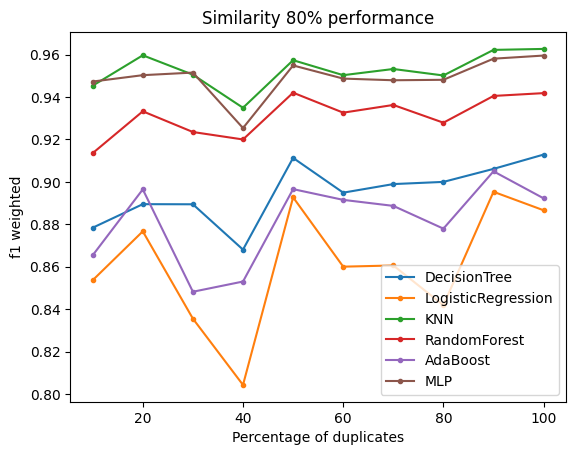

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.120404,0.116375,0.109270,0.127982,0.096671,0.111598,0.092333,0.095849,0.092758,0.083112
LogisticRegression,-0.006938,0.007405,-0.000583,0.021841,0.007616,-0.006464,0.002021,-0.003486,-0.001870,-0.003641
KNN,0.015840,0.014520,0.013277,0.015994,0.014626,0.013272,0.008269,0.010592,0.012131,0.008875
RandomForest,0.076956,0.074737,0.074575,0.077357,0.064983,0.067614,0.057287,0.067243,0.053689,0.057499
AdaBoost,0.051514,0.040653,0.039576,0.063560,0.035317,0.024887,0.039560,0.027634,0.024912,0.028509
MLP,0.011203,0.006203,0.006246,0.024588,0.009786,0.003459,0.010859,0.015574,0.002514,0.008870


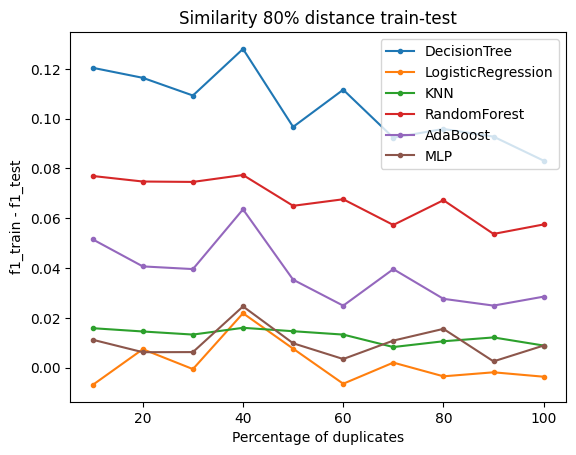

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.066824,0.063903,0.070649,0.054468,0.056013,0.056898,0.066783,0.067328,0.073528,0.072679
LogisticRegression,0.038457,0.041045,0.039266,0.052190,0.040958,0.040365,0.040677,0.046647,0.059278,0.062036
KNN,0.149472,0.166350,0.180779,0.192596,0.204390,0.228310,0.250744,0.261087,0.250820,0.390107
RandomForest,2.822297,2.048509,2.137885,3.239198,2.434513,2.361209,3.541124,2.639487,2.607665,3.509669
AdaBoost,0.994509,1.032624,1.096258,1.471461,1.607716,1.149546,1.156622,1.236927,1.233452,1.828671
MLP,8.343311,7.956868,9.326128,12.429144,13.321560,13.604426,13.813368,14.854685,14.555316,15.577577


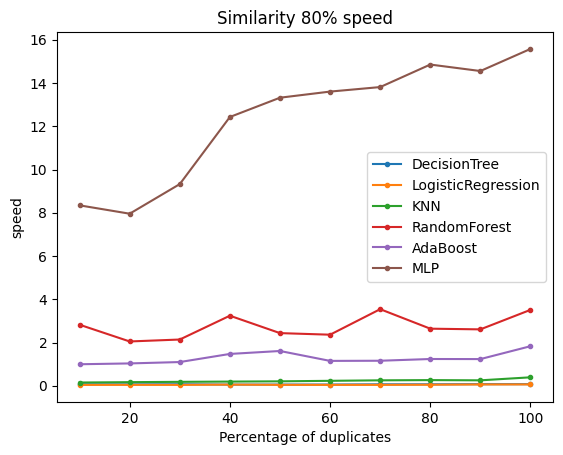

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.887500,0.898256,0.893285,0.900068,0.902572,0.914547,0.876709,0.907891,0.896038,0.904162
LogisticRegression,0.854835,0.866304,0.845288,0.868163,0.893235,0.864124,0.838354,0.872838,0.823087,0.844409
KNN,0.944668,0.959342,0.956390,0.955543,0.962550,0.960431,0.943004,0.952968,0.949792,0.958952
RandomForest,0.914327,0.937088,0.924031,0.936715,0.943676,0.945858,0.919586,0.938644,0.934667,0.933741
AdaBoost,0.877585,0.890904,0.873651,0.896248,0.885438,0.914107,0.861729,0.867352,0.878591,0.868921
MLP,0.942039,0.953115,0.955752,0.953176,0.957273,0.961722,0.932407,0.949041,0.950455,0.942691


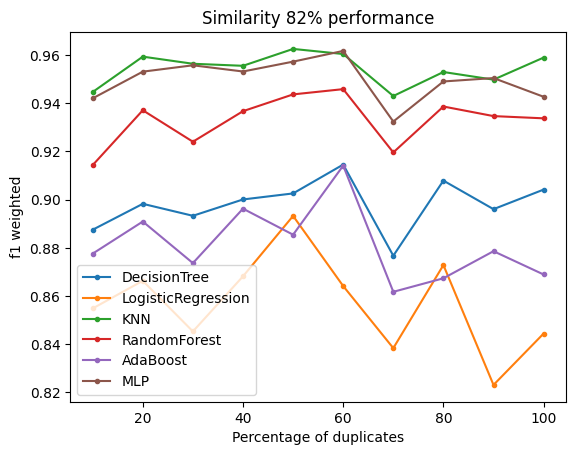

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.115603,0.109711,0.099995,0.097668,0.104476,0.088033,0.109232,0.094934,0.097366,0.092924
LogisticRegression,0.001550,0.011738,-0.003110,0.017986,0.001784,-0.003938,-0.007810,0.003173,-0.003398,0.004030
KNN,0.014685,0.014032,0.016467,0.009571,0.011272,0.008559,0.012555,0.014913,0.012719,0.006963
RandomForest,0.076966,0.070888,0.070533,0.063931,0.062484,0.051809,0.073271,0.053975,0.054814,0.061471
AdaBoost,0.050321,0.043544,0.036036,0.042321,0.038685,0.032583,0.031405,0.036480,0.024901,0.028168
MLP,0.006056,0.007800,0.010075,0.015650,0.004130,0.000604,0.010345,0.015911,0.001355,0.004423


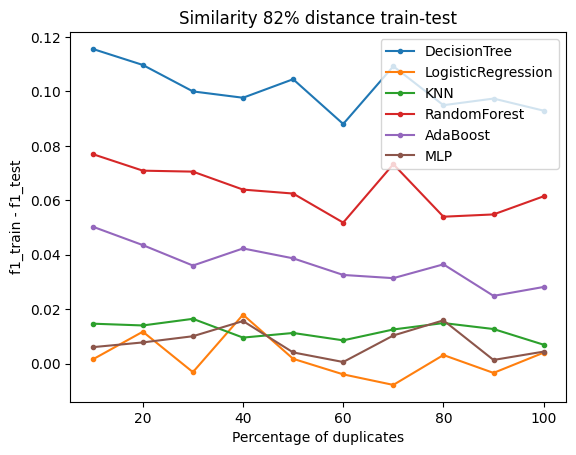

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.048659,0.053334,0.050673,0.052231,0.060930,0.060755,0.061555,0.061784,0.069663,0.075378
LogisticRegression,0.036366,0.037108,0.036856,0.038923,0.039954,0.039229,0.039178,0.041454,0.082913,0.110306
KNN,0.218359,0.245649,0.251770,0.271097,0.300835,0.209343,0.221144,0.246862,0.253464,0.248174
RandomForest,1.940337,2.621361,2.151147,2.124395,2.416732,2.717626,3.436333,3.499752,2.588551,4.736986
AdaBoost,0.952960,1.017208,1.033482,1.043823,1.355947,1.597766,1.127729,1.186056,1.179291,1.241053
MLP,10.547115,11.061562,8.743809,10.714066,13.342583,10.818444,16.878558,14.979693,15.185364,16.005825


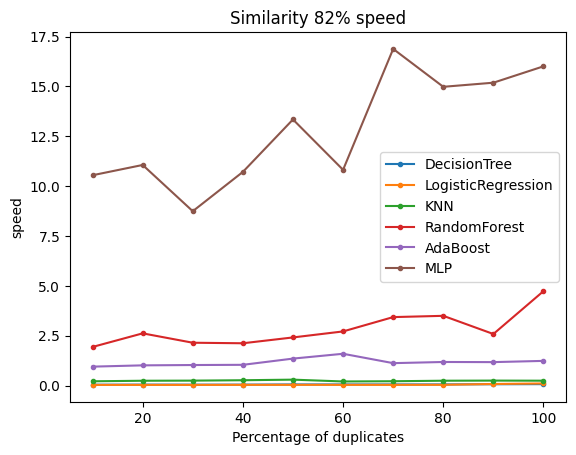

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.871930,0.893395,0.889355,0.896403,0.916408,0.908292,0.911984,0.899294,0.896889,0.923936
LogisticRegression,0.859787,0.874182,0.867728,0.838109,0.867082,0.810601,0.868378,0.831080,0.864059,0.887172
KNN,0.947686,0.959687,0.951650,0.959833,0.960033,0.964332,0.960870,0.956948,0.958125,0.966691
RandomForest,0.917001,0.936726,0.922785,0.941387,0.945874,0.947411,0.948637,0.932421,0.931146,0.945872
AdaBoost,0.870370,0.893974,0.883024,0.864288,0.896177,0.896313,0.908501,0.871350,0.880495,0.909621
MLP,0.941650,0.955891,0.943945,0.954768,0.958080,0.963018,0.960101,0.933353,0.948695,0.966681


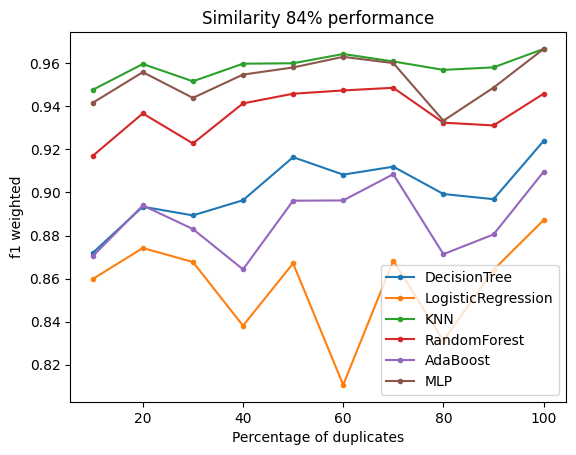

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.123489,0.109725,0.103870,0.102407,0.095574,0.094272,0.080712,0.095182,0.099527,0.080666
LogisticRegression,-0.001527,0.003225,0.000392,0.017111,0.008795,0.002216,-0.003919,-0.000382,0.005103,0.000303
KNN,0.015126,0.011972,0.010536,0.013688,0.010595,0.002678,0.006058,0.007896,0.010074,0.002985
RandomForest,0.075062,0.077515,0.068227,0.059812,0.055135,0.052590,0.047297,0.056921,0.058076,0.046863
AdaBoost,0.061686,0.041375,0.034192,0.054305,0.038570,0.026089,0.026414,0.031802,0.034024,0.030216
MLP,0.006218,0.003832,0.008371,0.014625,0.004044,0.003233,0.008268,0.011955,0.007759,0.005748


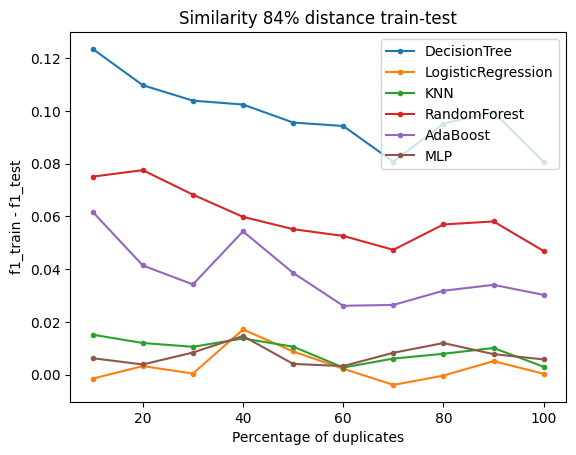

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.052408,0.047355,0.049342,0.073879,0.075978,0.078997,0.087251,0.084423,0.106693,0.087737
LogisticRegression,0.050750,0.050766,0.050676,0.049295,0.054031,0.052469,0.057650,0.058561,0.118728,0.076572
KNN,0.209956,0.227239,0.260538,0.203460,0.197417,0.193767,0.219363,0.237981,0.228038,0.257043
RandomForest,1.923829,2.943357,2.123030,2.130284,3.144639,2.360230,2.436414,3.613842,2.597220,2.627936
AdaBoost,1.421496,0.995765,1.035005,1.094088,1.091610,1.189522,1.671279,1.411279,1.241251,1.300283
MLP,12.572399,11.566114,10.294261,10.633683,13.107369,12.110660,14.226367,13.930921,20.523170,15.818521


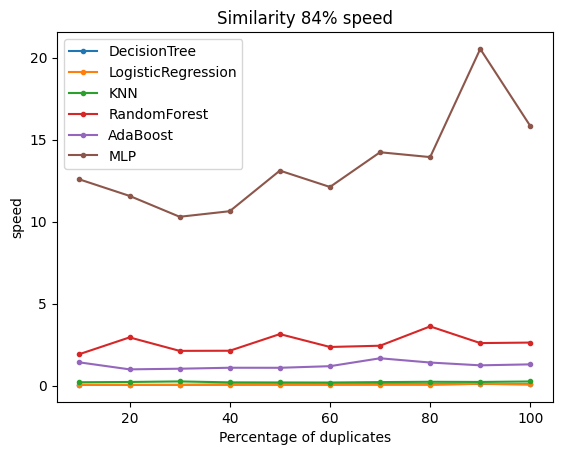

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.881361,0.899599,0.880775,0.899111,0.892266,0.907022,0.922064,0.916195,0.921063,0.919369
LogisticRegression,0.861362,0.860032,0.837336,0.847994,0.880041,0.882731,0.853708,0.849764,0.854242,0.860061
KNN,0.945862,0.958706,0.949596,0.954185,0.946699,0.959634,0.960550,0.965255,0.957786,0.967493
RandomForest,0.918978,0.938562,0.922248,0.940201,0.930577,0.940878,0.948805,0.951133,0.953252,0.946853
AdaBoost,0.868987,0.895546,0.875700,0.875944,0.891142,0.893216,0.908897,0.901149,0.903692,0.888894
MLP,0.939408,0.956623,0.953121,0.960431,0.926400,0.960152,0.966673,0.964346,0.959390,0.962695


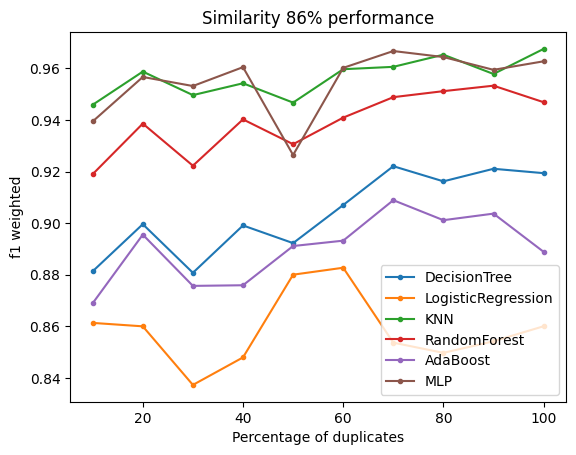

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.122412,0.112878,0.121107,0.101815,0.106131,0.096370,0.077998,0.083817,0.081575,0.085836
LogisticRegression,0.000726,0.010507,-0.000771,0.020403,0.002542,-0.009156,-0.003513,0.010302,-0.002178,-0.000997
KNN,0.019522,0.011278,0.019177,0.010216,0.018734,0.007070,0.010296,0.003711,0.013670,0.009020
RandomForest,0.076073,0.067718,0.071279,0.056539,0.070923,0.058875,0.048280,0.047702,0.050042,0.049812
AdaBoost,0.056424,0.044036,0.034939,0.049574,0.034497,0.028332,0.031909,0.038329,0.025371,0.028084
MLP,0.008822,0.005020,0.007725,0.014800,0.008620,0.002869,0.008863,0.010459,0.001928,0.011780


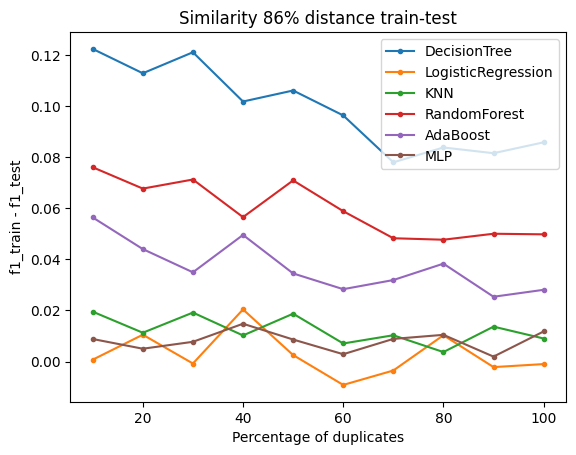

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.051678,0.045144,0.055450,0.048316,0.060374,0.062398,0.060401,0.062356,0.066541,0.070669
LogisticRegression,0.035678,0.038495,0.037318,0.044037,0.038716,0.039195,0.039645,0.040080,0.056839,0.056521
KNN,0.149626,0.223496,0.243673,0.272872,0.279487,0.224929,0.221421,0.216082,0.254149,0.257808
RandomForest,1.920556,2.389737,2.404533,2.111368,2.215122,3.120599,2.417450,2.524420,3.021283,2.671712
AdaBoost,0.967351,1.428185,1.229469,1.038224,1.057378,1.101326,1.149223,1.692248,1.608632,1.250228
MLP,8.271619,10.316014,11.809013,12.504515,10.451445,13.422731,11.339765,14.597106,15.393232,15.307977


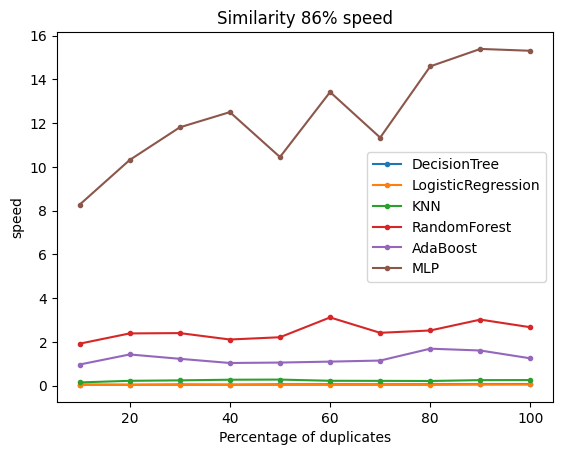

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.881414,0.894702,0.900335,0.893123,0.906413,0.899090,0.917355,0.914951,0.924988,0.930827
LogisticRegression,0.858313,0.869929,0.865108,0.869301,0.860117,0.850914,0.845300,0.843042,0.865585,0.885155
KNN,0.943552,0.956486,0.955787,0.959514,0.960337,0.957576,0.962307,0.966383,0.966432,0.969780
RandomForest,0.917814,0.930315,0.931429,0.943143,0.944986,0.945625,0.949318,0.950356,0.949076,0.953940
AdaBoost,0.871580,0.882768,0.894898,0.899909,0.898949,0.883873,0.911149,0.900125,0.882866,0.913932
MLP,0.942414,0.944385,0.959302,0.958922,0.957319,0.957084,0.966954,0.967106,0.958076,0.971246


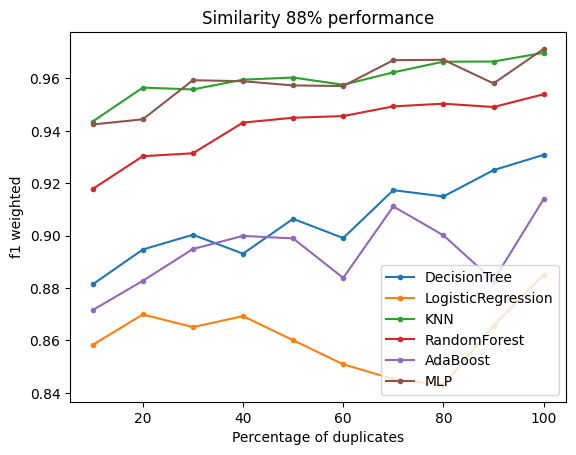

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.110639,0.114657,0.095247,0.107764,0.103742,0.098035,0.086388,0.081284,0.072822,0.068539
LogisticRegression,-0.000111,0.009998,-0.007254,0.012722,0.016889,-0.007518,0.010568,-0.011850,0.015284,0.001300
KNN,0.014030,0.010848,0.015117,0.013025,0.009553,0.011660,0.006984,0.009381,0.007412,0.002987
RandomForest,0.076150,0.077377,0.067488,0.063704,0.059491,0.055446,0.042648,0.042011,0.054008,0.041678
AdaBoost,0.052487,0.035259,0.033360,0.044810,0.041653,0.035637,0.031870,0.026216,0.031963,0.028505
MLP,0.007256,0.007943,0.006325,0.017607,0.009671,0.004733,0.009234,0.011587,0.006063,0.002299


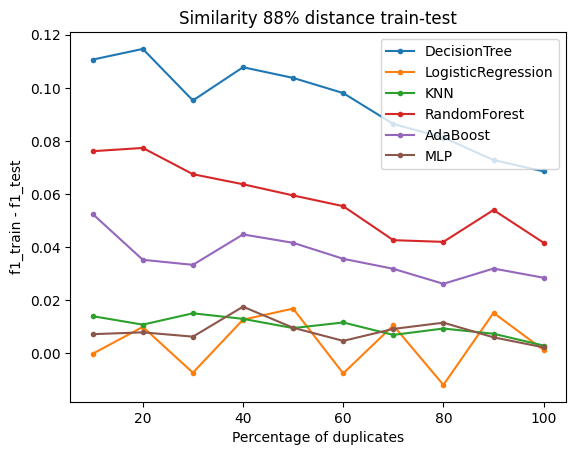

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.061906,0.068092,0.069210,0.075147,0.075408,0.079148,0.085325,0.089502,0.092402,0.096102
LogisticRegression,0.053244,0.051126,0.057888,0.051986,0.051897,0.052715,0.060199,0.058279,0.114959,0.117053
KNN,0.212594,0.251586,0.179047,0.173006,0.209231,0.199793,0.221215,0.242549,0.233989,0.274216
RandomForest,2.844745,3.137780,2.054611,2.144921,3.279043,2.305772,2.400360,3.538406,2.599829,2.656819
AdaBoost,1.419422,1.024444,1.046415,1.061950,1.088630,1.105509,1.684934,1.447524,1.197053,1.206607
MLP,10.901394,11.261993,11.965574,10.247291,12.214092,13.902044,14.376817,14.904638,15.922957,15.898699


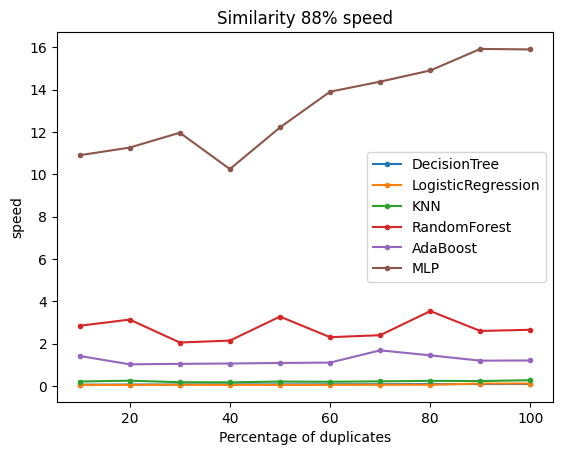

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.880910,0.899245,0.899681,0.902077,0.909990,0.910657,0.915476,0.918508,0.925627,0.922287
LogisticRegression,0.850034,0.868068,0.843475,0.835124,0.872496,0.858269,0.828294,0.859465,0.857445,0.844188
KNN,0.943205,0.960677,0.957379,0.960388,0.963058,0.955687,0.962303,0.963417,0.962937,0.968278
RandomForest,0.918589,0.943602,0.932069,0.940758,0.948892,0.944747,0.943682,0.946746,0.955256,0.954281
AdaBoost,0.867476,0.896627,0.870818,0.899048,0.905276,0.880453,0.880679,0.906231,0.901510,0.898059
MLP,0.944318,0.956198,0.955449,0.959509,0.960556,0.953593,0.955910,0.951608,0.965572,0.960993


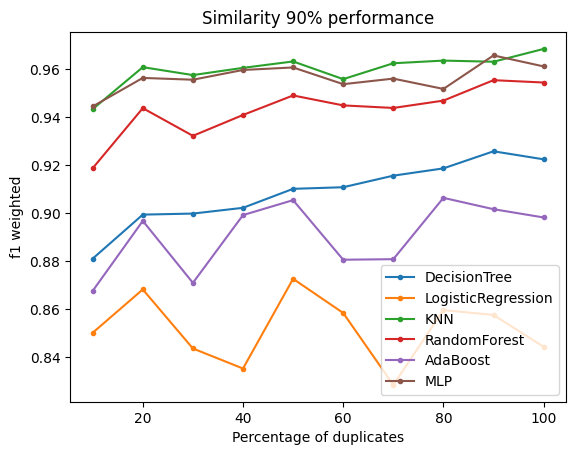

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.123121,0.102432,0.101662,0.093140,0.086957,0.086757,0.073068,0.081494,0.076969,0.076153
LogisticRegression,-0.008250,0.006111,-0.006863,0.017849,0.008915,-0.012771,-0.005108,-0.002794,-0.007297,-0.002227
KNN,0.016436,0.013571,0.013297,0.011915,0.010054,0.005832,0.010718,0.007880,0.006577,0.002269
RandomForest,0.074209,0.071669,0.062183,0.058965,0.056678,0.049260,0.049005,0.050944,0.041663,0.040676
AdaBoost,0.051973,0.047103,0.039612,0.051379,0.033733,0.029720,0.034208,0.024910,0.028809,0.026528
MLP,0.011313,0.007704,0.009521,0.017180,0.004565,0.000475,0.008026,0.011672,0.002943,0.007685


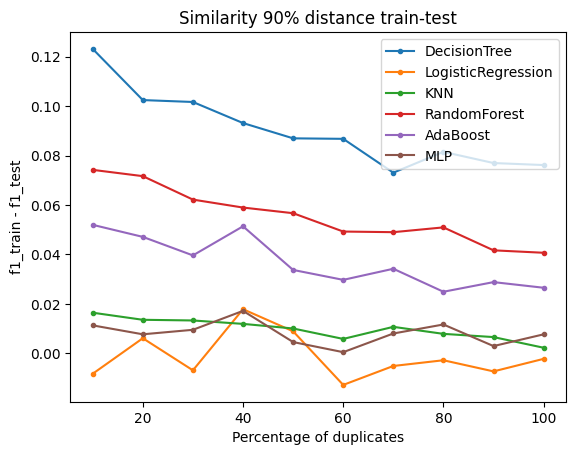

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.052196,0.045208,0.047701,0.051722,0.057708,0.062798,0.057048,0.065684,0.063111,0.072749
LogisticRegression,0.044308,0.041475,0.037428,0.038061,0.039869,0.037988,0.038197,0.039474,0.054613,0.061033
KNN,0.161748,0.160136,0.181999,0.184046,0.193220,0.221063,0.216348,0.233406,0.259642,0.363097
RandomForest,2.893032,2.002072,2.077949,2.948384,2.267740,2.342224,3.090837,2.504535,2.604654,3.880578
AdaBoost,0.998284,1.014414,1.086760,1.053822,1.592465,1.548835,1.179482,1.693526,1.653967,1.761655
MLP,8.043271,8.566345,8.397819,12.447032,13.459454,12.271683,14.290759,15.130125,15.677050,15.739595


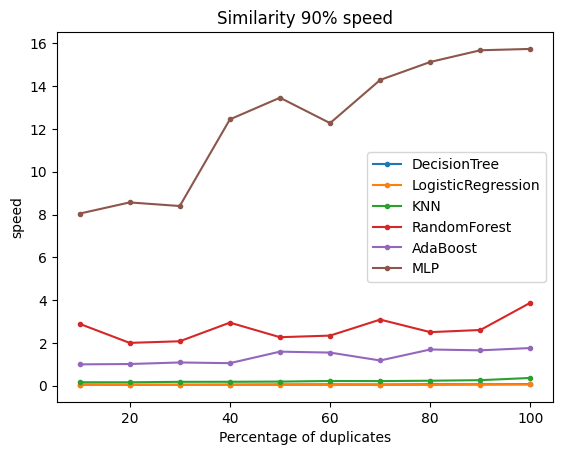

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.871167,0.900333,0.902235,0.909489,0.911367,0.916666,0.915914,0.921780,0.932020,0.932909
LogisticRegression,0.854492,0.849683,0.821625,0.894406,0.873821,0.907597,0.819110,0.850871,0.826463,0.847583
KNN,0.941666,0.957672,0.958287,0.955688,0.961954,0.966874,0.953540,0.968469,0.967756,0.970244
RandomForest,0.912870,0.936510,0.939064,0.942304,0.952785,0.947088,0.947894,0.952242,0.955900,0.956483
AdaBoost,0.868511,0.877443,0.882720,0.908099,0.900265,0.911405,0.883631,0.903657,0.889872,0.918816
MLP,0.936356,0.940010,0.945156,0.955684,0.961946,0.962422,0.956928,0.968967,0.969952,0.967925


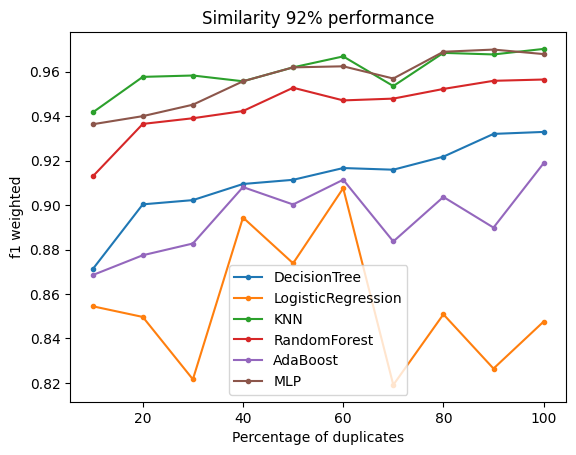

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.120094,0.105054,0.109957,0.087524,0.099167,0.077845,0.078910,0.076348,0.065135,0.075155
LogisticRegression,0.004625,-0.000604,-0.011668,0.012475,0.002731,-0.011210,0.005236,-0.003260,0.000880,0.010167
KNN,0.018131,0.016773,0.013808,0.013058,0.010327,0.005812,0.009740,0.006930,0.004638,0.005062
RandomForest,0.079176,0.074293,0.059334,0.056833,0.054193,0.047991,0.049494,0.040123,0.041904,0.042409
AdaBoost,0.051529,0.056219,0.041929,0.042437,0.032266,0.033217,0.039949,0.030847,0.036071,0.028018
MLP,0.011372,0.005125,0.013865,0.017091,0.007471,0.002491,0.014966,0.007841,0.005331,0.006257


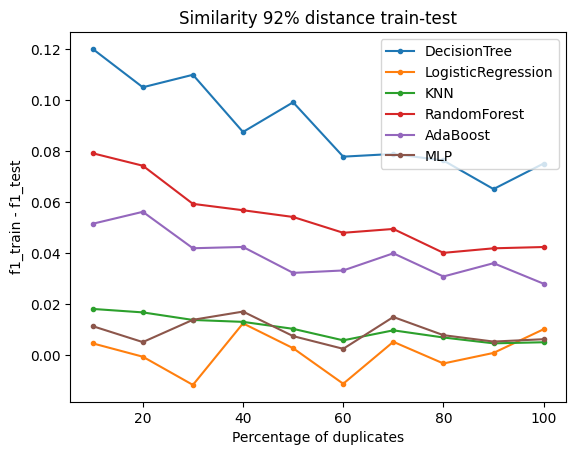

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.055235,0.049548,0.050827,0.055788,0.055258,0.059326,0.070798,0.064005,0.067165,0.069142
LogisticRegression,0.033637,0.035461,0.035336,0.038260,0.039736,0.040149,0.039204,0.037506,0.055256,0.057898
KNN,0.153959,0.145001,0.177237,0.259779,0.277040,0.301255,0.326345,0.229157,0.249852,0.260112
RandomForest,1.972922,2.037620,3.096848,2.234177,2.268304,3.486386,2.431657,2.505697,3.615191,2.574630
AdaBoost,0.994906,1.434151,1.466010,1.053715,1.131210,1.146704,1.145079,1.492141,1.791166,1.282353
MLP,7.669124,10.603625,11.622501,14.096691,13.268444,13.710873,14.637700,14.610087,15.304624,15.794003


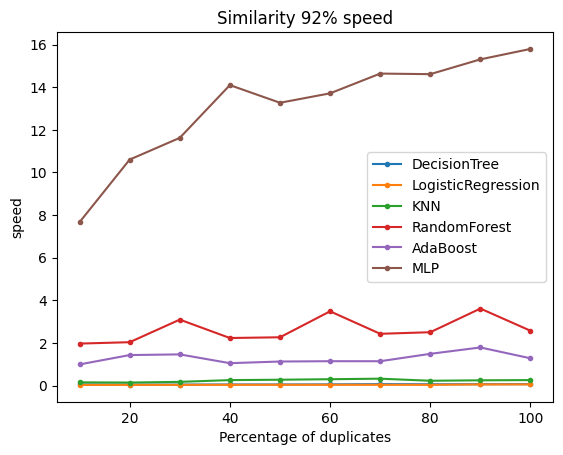

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.882555,0.900194,0.903221,0.907163,0.916687,0.915895,0.918160,0.926851,0.939476,0.932921
LogisticRegression,0.813957,0.844995,0.854833,0.844398,0.780754,0.903586,0.850388,0.876581,0.898468,0.902625
KNN,0.947326,0.961869,0.959240,0.957681,0.957794,0.963753,0.955383,0.967540,0.966656,0.969788
RandomForest,0.922316,0.940394,0.933287,0.939246,0.949459,0.949970,0.950487,0.948996,0.960308,0.954370
AdaBoost,0.877219,0.892357,0.892215,0.898050,0.889959,0.925708,0.890370,0.918202,0.928066,0.926213
MLP,0.944665,0.956979,0.952207,0.960081,0.937228,0.967670,0.956108,0.969900,0.965349,0.967708


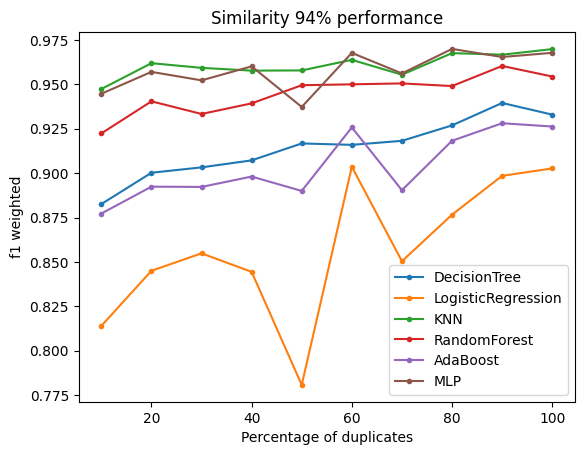

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.111434,0.115379,0.108350,0.091046,0.091110,0.075757,0.080135,0.067148,0.065131,0.068107
LogisticRegression,-0.005076,0.007254,-0.004931,0.019632,-0.003050,-0.010966,-0.004574,-0.000128,-0.002306,-0.004616
KNN,0.016675,0.014190,0.010134,0.006168,0.015324,0.003574,0.012321,0.010553,0.005549,0.005726
RandomForest,0.070844,0.065276,0.064787,0.058385,0.056124,0.045073,0.046577,0.048424,0.039916,0.043131
AdaBoost,0.047599,0.042724,0.036687,0.034431,0.035729,0.026858,0.037279,0.018847,0.027042,0.026672
MLP,0.010226,0.014676,0.007467,0.013675,0.001927,0.001130,0.011625,0.007661,0.000720,0.007002


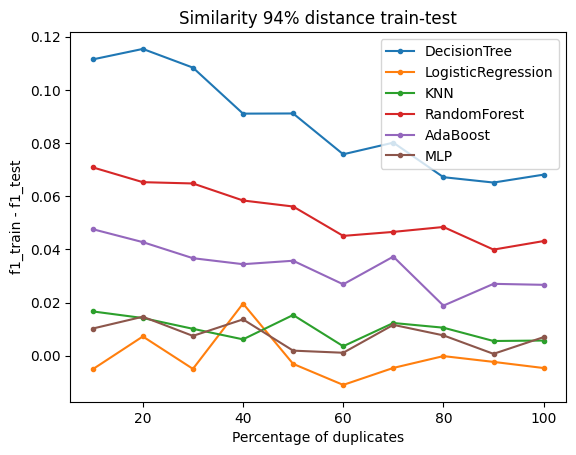

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.053504,0.045769,0.050432,0.052383,0.054301,0.056013,0.064909,0.076234,0.072642,0.073180
LogisticRegression,0.035328,0.036628,0.036949,0.036283,0.041802,0.038911,0.040596,0.051859,0.062234,0.063664
KNN,0.149527,0.167408,0.178738,0.198680,0.195872,0.223830,0.206979,0.301617,0.384321,0.384361
RandomForest,2.129123,1.988528,2.064648,3.215955,3.042712,2.506048,2.723048,2.498605,3.068345,2.642034
AdaBoost,0.985948,0.991357,1.114372,1.542184,1.104704,1.115004,1.151343,1.174006,1.262400,1.763234
MLP,7.150835,7.820872,10.214619,12.238260,13.236036,13.421643,14.307797,15.146311,15.372507,15.752415


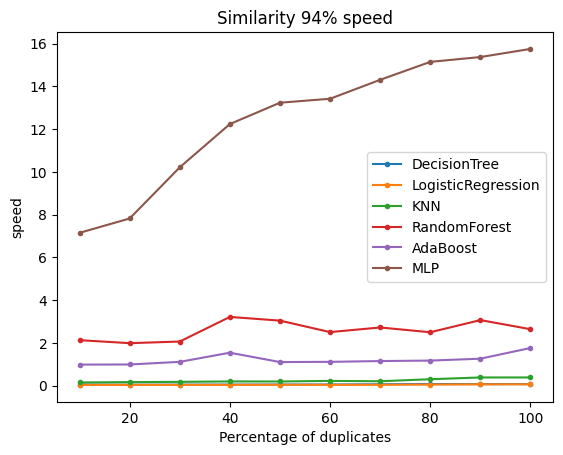

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.896529,0.905540,0.899639,0.913398,0.909988,0.928639,0.924252,0.927547,0.924131,0.930613
LogisticRegression,0.857176,0.847998,0.832935,0.881522,0.849574,0.859730,0.870728,0.865865,0.856548,0.870012
KNN,0.942786,0.961824,0.952769,0.961599,0.962743,0.963317,0.959418,0.966212,0.965526,0.971668
RandomForest,0.918522,0.942725,0.928109,0.941074,0.945779,0.948996,0.938454,0.951636,0.955673,0.958753
AdaBoost,0.867413,0.890978,0.890663,0.911902,0.906817,0.920815,0.919968,0.917104,0.928042,0.916257
MLP,0.939759,0.955932,0.956365,0.957734,0.961648,0.962266,0.966600,0.966662,0.970151,0.972711


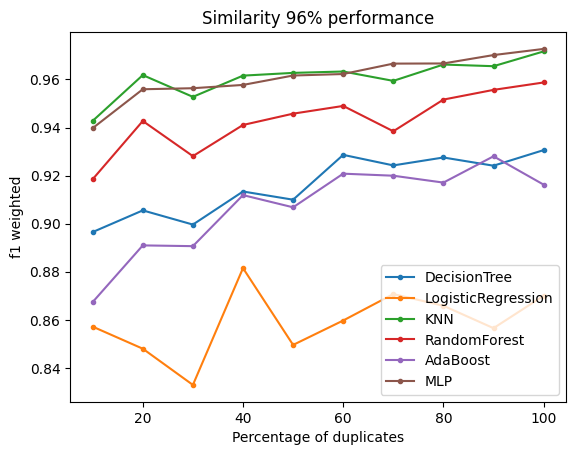

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.115625,0.107706,0.093508,0.083040,0.085005,0.067721,0.071565,0.070369,0.068426,0.074801
LogisticRegression,-0.000648,0.002520,-0.013512,0.011738,0.004321,-0.011184,-0.003862,0.007410,0.002154,-0.011073
KNN,0.018019,0.011590,0.013298,0.009586,0.012447,0.006650,0.009478,0.009839,0.005266,0.002329
RandomForest,0.076152,0.068435,0.061983,0.058047,0.059804,0.043985,0.047871,0.041185,0.040157,0.036674
AdaBoost,0.053347,0.052538,0.034652,0.034178,0.031483,0.017723,0.029724,0.031544,0.023269,0.025500
MLP,0.009894,0.006239,0.006508,0.017787,0.006836,0.000075,0.009013,0.007102,-0.000065,0.005064


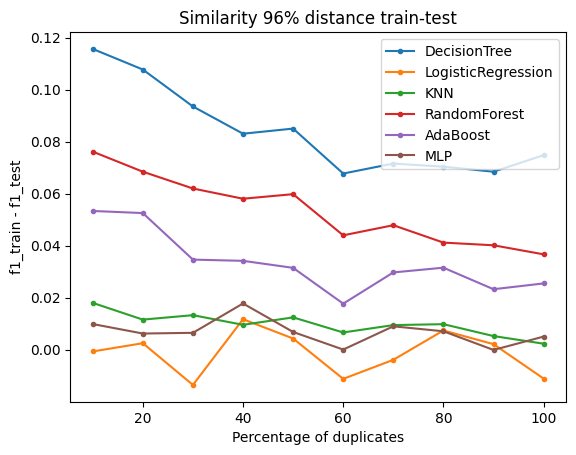

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.073685,0.063282,0.066538,0.075877,0.075251,0.088265,0.097361,0.078856,0.071000,0.064720
LogisticRegression,0.035857,0.036506,0.052155,0.038094,0.037020,0.048421,0.038255,0.040050,0.060158,0.056737
KNN,0.151081,0.152883,0.157785,0.181694,0.197540,0.218201,0.211586,0.240676,0.221632,0.255665
RandomForest,2.723330,2.006073,2.024274,2.138730,2.888865,2.311337,2.370961,2.983991,2.543386,3.104174
AdaBoost,0.979761,0.988552,1.026814,1.077825,1.102837,1.582217,1.514250,1.171609,1.222035,1.236976
MLP,10.455178,11.396796,8.639925,11.531407,13.354970,11.217636,14.140912,14.916042,15.386612,15.704143


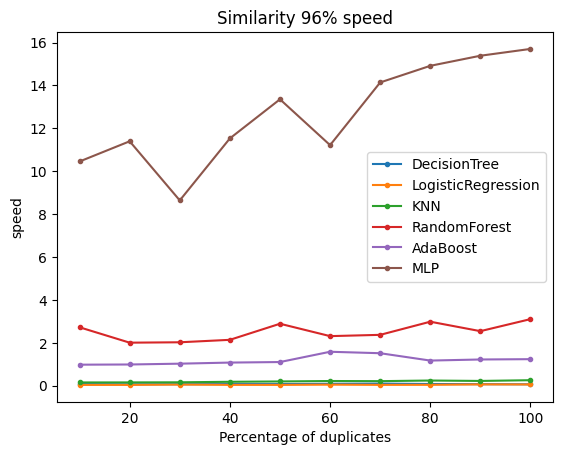

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.887873,0.901357,0.903847,0.905933,0.915791,0.928380,0.925768,0.926138,0.936361,0.933312
LogisticRegression,0.847727,0.865727,0.855537,0.901236,0.863361,0.910740,0.831840,0.895374,0.862846,0.889101
KNN,0.943183,0.960693,0.958039,0.956276,0.955068,0.965542,0.962057,0.966676,0.967758,0.968711
RandomForest,0.917046,0.943291,0.937852,0.942294,0.945388,0.951201,0.947116,0.947001,0.961202,0.954762
AdaBoost,0.860557,0.897058,0.894242,0.913141,0.897910,0.925122,0.919936,0.919455,0.923573,0.933872
MLP,0.943940,0.956883,0.957698,0.956573,0.965027,0.962160,0.965468,0.961810,0.971508,0.973107


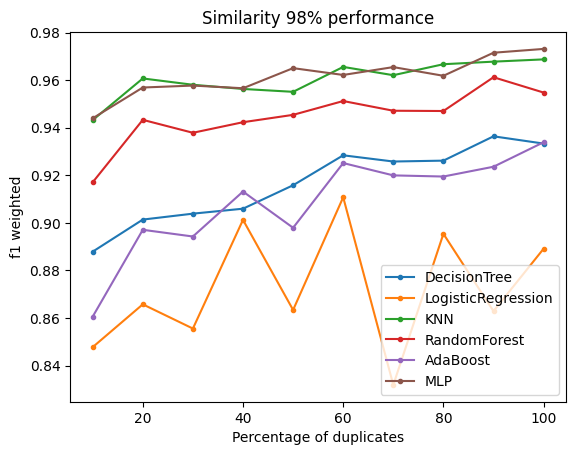

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.117825,0.109353,0.098767,0.092544,0.090864,0.067958,0.076052,0.070832,0.053766,0.066036
LogisticRegression,-0.009542,0.008247,-0.009201,0.013783,0.012287,-0.006444,0.008169,0.000496,0.005082,-0.000791
KNN,0.016118,0.015818,0.015573,0.009836,0.017521,0.007923,0.008994,0.009201,0.005562,0.006268
RandomForest,0.074976,0.068488,0.064403,0.057421,0.058546,0.048528,0.041653,0.044905,0.036597,0.041686
AdaBoost,0.055711,0.043937,0.032108,0.037081,0.034656,0.021318,0.021298,0.024125,0.026948,0.013913
MLP,0.009681,0.006452,0.006675,0.016501,0.007801,0.005439,0.010116,0.007342,0.003353,0.003196


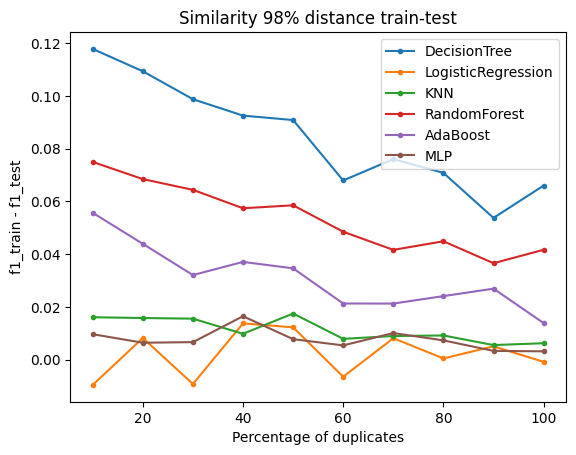

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.070617,0.070016,0.069084,0.076603,0.081351,0.075439,0.089797,0.087624,0.091408,0.087309
LogisticRegression,0.051125,0.048508,0.052311,0.050418,0.054079,0.057385,0.061921,0.059807,0.125398,0.060007
KNN,0.209183,0.265317,0.249666,0.265085,0.282640,0.311355,0.203198,0.229778,0.228137,0.267686
RandomForest,1.892421,2.020030,2.750790,2.127988,2.225220,3.386416,2.381031,2.428610,3.488441,2.559158
AdaBoost,0.982105,1.186405,1.497178,1.088290,1.116446,1.118149,1.122933,1.266991,1.804449,1.252150
MLP,7.038570,9.793984,12.224689,12.369180,9.926451,13.847855,18.798962,14.896989,15.606240,15.744950


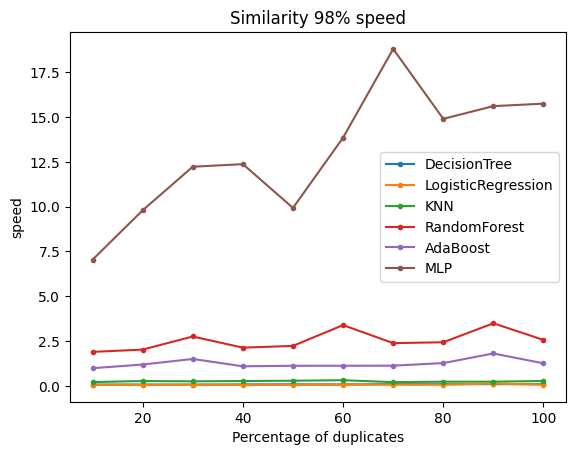

In [ ]:
results_for_each_similarity = []

for similarity in similarities:
  results_for_each_algorithm = []

  # For each algorithm, we compute the results on all the datasets of a fixed similarity
  for algorithm in CLASSIFICATION_ALGORITHMS:

    results_single_algorithm = []

    # Iteration over the different duplicates (fixed similarity)
    for dup in duplicates:

      key = "D_S"+str(similarity)+"_R"+str(dup)
      X = data_points_dictionary[key]
      y = data_labels_dictionary[key]

      # Shuffling the datasets before performing classification
      X, y = shuffle(X, y, random_state=SEED)

      #print("==> Performing "+str(algorithm)+" on "+str(key))

      results_analysis = classification(X, y, algorithm, SEED)
      results_single_algorithm.append(results_analysis)

    results_for_each_algorithm.append(results_single_algorithm)

  results_for_each_similarity.append(results_for_each_algorithm)

  # Generating the plots
  plot_type = ["performance","distance train-test","speed"]
  for plt_t in plot_type:
    plot(x_axis_values = duplicates,
        x_label = "Percentage of duplicates",
        results = results_for_each_algorithm,
        title = "Similarity " + str(similarity) + "% " + plt_t,
        algorithms = CLASSIFICATION_ALGORITHMS,
        plot_type = plt_t)


### Data Preparation
In this phase we will use RecordLinkage to clean the duplicates.

In [ ]:
!pip install recordlinkage

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.9/926.9 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 14.1 MB/s eta 0:00:00


In [ ]:
import recordlinkage

In [ ]:
# Function to find duplicates and similar records
@ignore_warnings()
def find_duplicates(X, y, threshold=0.95):

  # Conversion into dataframes
  dataset = pd.DataFrame(X, columns=[f"Feature{i}" for i in range(X.shape[1])])
  labels = pd.DataFrame(y)

  # Creating the index object (full)
  indexer = recordlinkage.Index()
  indexer.full()

  # Candidate links (index of record pairs) and Compare object
  pairs = indexer.index(dataset)
  compare_cl = recordlinkage.Compare()

  # Comparing numerical columns (skipping ID column)
  for feature in dataset.columns:
    if feature != 'ID':
      compare_cl.numeric(feature, feature, method='linear', label=f'{feature}_diff')
  features = compare_cl.compute(pairs, dataset)

  # Definition of a threshold over which a row is considered as duplicate
  n = threshold * (len(dataset.columns))
  matches = features[features.sum(axis=1) > n]

  dataset_size = dataset.shape[0]
  num_of_duplicates = dataset_size - 1000
  #print(num_of_duplicates)

  # Dropping duplicated rows
  indexes = []
  for i in matches.index:
    if i[0] not in indexes:
      dataset = dataset.drop([i[0]])
      labels = labels.drop([i[0]])
      indexes.append(i[0])

  # Check performances
  # Every row of index larger than 100 is a duplicate

  # Positives: real duplicates
  TP = sum(1 for i in indexes if i > 1000)
  FP = sum(1 for i in indexes if i <= 1000)
  TN = 1000 - FP
  FN = num_of_duplicates - TP
  #print(TP,FP,TN,FN)

  #print(matches.index)
  #print(indexes)

  acc = (TP+TN)/dataset_size
  prec = TP / (TP+FP)
  rec = TP / (TP+FN)
  print("==> Found "+str(TP)+" over "+str(num_of_duplicates)+" duplicates.")
  print("==> Found "+str(FP)+" fake duplicates.")
  print("Accuracy:"+str(acc)+" - Precision:"+str(prec)+" - Recall:"+str(rec)+"\n")

  dataset = dataset.to_numpy()
  labels = labels.to_numpy()
  labels = labels[:,0]

  return dataset, labels

Calling the function above to clean the dataset.

In [ ]:
clean_data_points_dictionary = {}
clean_data_labels_dictionary = {}

In [ ]:
# Iteration over different % of similarity
for similarity in similarities:

  # First iteration to create the datasets with different % of duplicates
  for dup in duplicates:

    # The key that we will use in the dictionaries
    key = "D_S"+str(similarity)+"_R"+str(dup)

    X_new = data_points_dictionary[key]
    y_new = data_labels_dictionary[key]

    print("==> CHECKING DUPLICATES on "+key+" with shape "+str(X_new.shape)+" "+str(y_new.shape))

    new_X, new_y = find_duplicates(X_new,y_new)

    #print(new_X.shape,new_y.shape)

    clean_data_points_dictionary[key] = new_X
    clean_data_labels_dictionary[key] = new_y

==> CHECKING DUPLICATES on D_S80_R10 with shape (1100, 5) (1100,)


==> Found 2 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9027272727272727 - Precision:0.18181818181818182 - Recall:0.02

==> CHECKING DUPLICATES on D_S80_R20 with shape (1200, 5) (1200,)


==> Found 1 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8266666666666667 - Precision:0.1 - Recall:0.005

==> CHECKING DUPLICATES on D_S80_R30 with shape (1300, 5) (1300,)


==> Found 6 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7669230769230769 - Precision:0.4 - Recall:0.02

==> CHECKING DUPLICATES on D_S80_R40 with shape (1400, 5) (1400,)


==> Found 9 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7142857142857143 - Precision:0.5 - Recall:0.0225

==> CHECKING DUPLICATES on D_S80_R50 with shape (1500, 5) (1500,)


==> Found 6 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6646666666666666 - Precision:0.4 - Recall:0.012

==> CHECKING DUPLICATES on D_S80_R60 with shape (1600, 5) (1600,)


==> Found 6 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.623125 - Precision:0.4 - Recall:0.01

==> CHECKING DUPLICATES on D_S80_R70 with shape (1700, 5) (1700,)


==> Found 7 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5870588235294117 - Precision:0.4375 - Recall:0.01

==> CHECKING DUPLICATES on D_S80_R80 with shape (1800, 5) (1800,)


==> Found 11 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5566666666666666 - Precision:0.55 - Recall:0.01375

==> CHECKING DUPLICATES on D_S80_R90 with shape (1900, 5) (1900,)


==> Found 13 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5284210526315789 - Precision:0.5909090909090909 - Recall:0.014444444444444444

==> CHECKING DUPLICATES on D_S80_R100 with shape (2000, 5) (2000,)


==> Found 11 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.501 - Precision:0.55 - Recall:0.011

==> CHECKING DUPLICATES on D_S82_R10 with shape (1100, 5) (1100,)


==> Found 3 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9036363636363637 - Precision:0.25 - Recall:0.03

==> CHECKING DUPLICATES on D_S82_R20 with shape (1200, 5) (1200,)


==> Found 3 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8283333333333334 - Precision:0.25 - Recall:0.015

==> CHECKING DUPLICATES on D_S82_R30 with shape (1300, 5) (1300,)


==> Found 5 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7661538461538462 - Precision:0.35714285714285715 - Recall:0.016666666666666666

==> CHECKING DUPLICATES on D_S82_R40 with shape (1400, 5) (1400,)


==> Found 12 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7164285714285714 - Precision:0.5714285714285714 - Recall:0.03

==> CHECKING DUPLICATES on D_S82_R50 with shape (1500, 5) (1500,)


==> Found 14 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.67 - Precision:0.6086956521739131 - Recall:0.028

==> CHECKING DUPLICATES on D_S82_R60 with shape (1600, 5) (1600,)


==> Found 15 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.62875 - Precision:0.625 - Recall:0.025

==> CHECKING DUPLICATES on D_S82_R70 with shape (1700, 5) (1700,)


==> Found 13 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5905882352941176 - Precision:0.5909090909090909 - Recall:0.018571428571428572

==> CHECKING DUPLICATES on D_S82_R80 with shape (1800, 5) (1800,)


==> Found 25 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5644444444444444 - Precision:0.7352941176470589 - Recall:0.03125

==> CHECKING DUPLICATES on D_S82_R90 with shape (1900, 5) (1900,)


==> Found 22 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.533157894736842 - Precision:0.7096774193548387 - Recall:0.024444444444444446

==> CHECKING DUPLICATES on D_S82_R100 with shape (2000, 5) (2000,)


==> Found 21 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.506 - Precision:0.7 - Recall:0.021

==> CHECKING DUPLICATES on D_S84_R10 with shape (1100, 5) (1100,)


==> Found 3 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9036363636363637 - Precision:0.25 - Recall:0.03

==> CHECKING DUPLICATES on D_S84_R20 with shape (1200, 5) (1200,)


==> Found 5 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.83 - Precision:0.35714285714285715 - Recall:0.025

==> CHECKING DUPLICATES on D_S84_R30 with shape (1300, 5) (1300,)


==> Found 11 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7707692307692308 - Precision:0.55 - Recall:0.03666666666666667

==> CHECKING DUPLICATES on D_S84_R40 with shape (1400, 5) (1400,)


==> Found 8 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7135714285714285 - Precision:0.47058823529411764 - Recall:0.02

==> CHECKING DUPLICATES on D_S84_R50 with shape (1500, 5) (1500,)


==> Found 16 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6713333333333333 - Precision:0.64 - Recall:0.032

==> CHECKING DUPLICATES on D_S84_R60 with shape (1600, 5) (1600,)


==> Found 25 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.635 - Precision:0.7352941176470589 - Recall:0.041666666666666664

==> CHECKING DUPLICATES on D_S84_R70 with shape (1700, 5) (1700,)


==> Found 33 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6023529411764705 - Precision:0.7857142857142857 - Recall:0.047142857142857146

==> CHECKING DUPLICATES on D_S84_R80 with shape (1800, 5) (1800,)


==> Found 39 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5722222222222222 - Precision:0.8125 - Recall:0.04875

==> CHECKING DUPLICATES on D_S84_R90 with shape (1900, 5) (1900,)


==> Found 25 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5347368421052632 - Precision:0.7352941176470589 - Recall:0.027777777777777776

==> CHECKING DUPLICATES on D_S84_R100 with shape (2000, 5) (2000,)


==> Found 46 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5185 - Precision:0.8363636363636363 - Recall:0.046

==> CHECKING DUPLICATES on D_S86_R10 with shape (1100, 5) (1100,)


==> Found 5 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9054545454545454 - Precision:0.35714285714285715 - Recall:0.05

==> CHECKING DUPLICATES on D_S86_R20 with shape (1200, 5) (1200,)


==> Found 13 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8366666666666667 - Precision:0.5909090909090909 - Recall:0.065

==> CHECKING DUPLICATES on D_S86_R30 with shape (1300, 5) (1300,)


==> Found 16 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7746153846153846 - Precision:0.64 - Recall:0.05333333333333334

==> CHECKING DUPLICATES on D_S86_R40 with shape (1400, 5) (1400,)


==> Found 21 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7228571428571429 - Precision:0.7 - Recall:0.0525

==> CHECKING DUPLICATES on D_S86_R50 with shape (1500, 5) (1500,)


==> Found 24 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6766666666666666 - Precision:0.7272727272727273 - Recall:0.048

==> CHECKING DUPLICATES on D_S86_R60 with shape (1600, 5) (1600,)


==> Found 43 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.64625 - Precision:0.8269230769230769 - Recall:0.07166666666666667

==> CHECKING DUPLICATES on D_S86_R70 with shape (1700, 5) (1700,)


==> Found 34 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6029411764705882 - Precision:0.7906976744186046 - Recall:0.04857142857142857

==> CHECKING DUPLICATES on D_S86_R80 with shape (1800, 5) (1800,)


==> Found 47 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5766666666666667 - Precision:0.8392857142857143 - Recall:0.05875

==> CHECKING DUPLICATES on D_S86_R90 with shape (1900, 5) (1900,)


==> Found 60 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5531578947368421 - Precision:0.8695652173913043 - Recall:0.06666666666666667

==> CHECKING DUPLICATES on D_S86_R100 with shape (2000, 5) (2000,)


==> Found 49 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.52 - Precision:0.8448275862068966 - Recall:0.049

==> CHECKING DUPLICATES on D_S88_R10 with shape (1100, 5) (1100,)


==> Found 10 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.91 - Precision:0.5263157894736842 - Recall:0.1

==> CHECKING DUPLICATES on D_S88_R20 with shape (1200, 5) (1200,)


==> Found 16 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8391666666666666 - Precision:0.64 - Recall:0.08

==> CHECKING DUPLICATES on D_S88_R30 with shape (1300, 5) (1300,)


==> Found 29 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7846153846153846 - Precision:0.7631578947368421 - Recall:0.09666666666666666

==> CHECKING DUPLICATES on D_S88_R40 with shape (1400, 5) (1400,)


==> Found 37 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7342857142857143 - Precision:0.8043478260869565 - Recall:0.0925

==> CHECKING DUPLICATES on D_S88_R50 with shape (1500, 5) (1500,)


==> Found 40 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6873333333333334 - Precision:0.8163265306122449 - Recall:0.08

==> CHECKING DUPLICATES on D_S88_R60 with shape (1600, 5) (1600,)


==> Found 54 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.653125 - Precision:0.8571428571428571 - Recall:0.09

==> CHECKING DUPLICATES on D_S88_R70 with shape (1700, 5) (1700,)


==> Found 66 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6217647058823529 - Precision:0.88 - Recall:0.09428571428571429

==> CHECKING DUPLICATES on D_S88_R80 with shape (1800, 5) (1800,)


==> Found 56 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.5816666666666667 - Precision:0.8615384615384616 - Recall:0.07

==> CHECKING DUPLICATES on D_S88_R90 with shape (1900, 5) (1900,)


==> Found 92 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.57 - Precision:0.9108910891089109 - Recall:0.10222222222222223

==> CHECKING DUPLICATES on D_S88_R100 with shape (2000, 5) (2000,)


==> Found 87 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.539 - Precision:0.90625 - Recall:0.087

==> CHECKING DUPLICATES on D_S90_R10 with shape (1100, 5) (1100,)


==> Found 13 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9127272727272727 - Precision:0.5909090909090909 - Recall:0.13

==> CHECKING DUPLICATES on D_S90_R20 with shape (1200, 5) (1200,)


==> Found 41 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.86 - Precision:0.82 - Recall:0.205

==> CHECKING DUPLICATES on D_S90_R30 with shape (1300, 5) (1300,)


==> Found 47 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7984615384615384 - Precision:0.8392857142857143 - Recall:0.15666666666666668

==> CHECKING DUPLICATES on D_S90_R40 with shape (1400, 5) (1400,)


==> Found 74 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7607142857142857 - Precision:0.891566265060241 - Recall:0.185

==> CHECKING DUPLICATES on D_S90_R50 with shape (1500, 5) (1500,)


==> Found 80 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.714 - Precision:0.898876404494382 - Recall:0.16

==> CHECKING DUPLICATES on D_S90_R60 with shape (1600, 5) (1600,)


==> Found 105 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.685 - Precision:0.9210526315789473 - Recall:0.175

==> CHECKING DUPLICATES on D_S90_R70 with shape (1700, 5) (1700,)


==> Found 121 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6541176470588236 - Precision:0.9307692307692308 - Recall:0.17285714285714285

==> CHECKING DUPLICATES on D_S90_R80 with shape (1800, 5) (1800,)


==> Found 139 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6277777777777778 - Precision:0.9391891891891891 - Recall:0.17375

==> CHECKING DUPLICATES on D_S90_R90 with shape (1900, 5) (1900,)


==> Found 152 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6015789473684211 - Precision:0.9440993788819876 - Recall:0.1688888888888889

==> CHECKING DUPLICATES on D_S90_R100 with shape (2000, 5) (2000,)


==> Found 167 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.579 - Precision:0.9488636363636364 - Recall:0.167

==> CHECKING DUPLICATES on D_S92_R10 with shape (1100, 5) (1100,)


==> Found 32 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.93 - Precision:0.7804878048780488 - Recall:0.32

==> CHECKING DUPLICATES on D_S92_R20 with shape (1200, 5) (1200,)


==> Found 82 over 200 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8941666666666667 - Precision:0.9010989010989011 - Recall:0.41

==> CHECKING DUPLICATES on D_S92_R30 with shape (1300, 5) (1300,)


==> Found 98 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8376923076923077 - Precision:0.9158878504672897 - Recall:0.32666666666666666

==> CHECKING DUPLICATES on D_S92_R40 with shape (1400, 5) (1400,)


==> Found 130 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8007142857142857 - Precision:0.935251798561151 - Recall:0.325

==> CHECKING DUPLICATES on D_S92_R50 with shape (1500, 5) (1500,)


==> Found 158 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.766 - Precision:0.9461077844311377 - Recall:0.316

==> CHECKING DUPLICATES on D_S92_R60 with shape (1600, 5) (1600,)


==> Found 194 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.740625 - Precision:0.9556650246305419 - Recall:0.3233333333333333

==> CHECKING DUPLICATES on D_S92_R70 with shape (1700, 5) (1700,)


==> Found 236 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.721764705882353 - Precision:0.963265306122449 - Recall:0.33714285714285713

==> CHECKING DUPLICATES on D_S92_R80 with shape (1800, 5) (1800,)


==> Found 290 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.7116666666666667 - Precision:0.9698996655518395 - Recall:0.3625

==> CHECKING DUPLICATES on D_S92_R90 with shape (1900, 5) (1900,)


==> Found 318 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6889473684210526 - Precision:0.9724770642201835 - Recall:0.35333333333333333

==> CHECKING DUPLICATES on D_S92_R100 with shape (2000, 5) (2000,)


==> Found 350 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.6705 - Precision:0.9749303621169917 - Recall:0.35

==> CHECKING DUPLICATES on D_S94_R10 with shape (1100, 5) (1100,)


==> Found 63 over 100 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9581818181818181 - Precision:0.875 - Recall:0.63

==> CHECKING DUPLICATES on D_S94_R20 with shape (1200, 5) (1200,)


==> Found 149 over 200 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9491666666666667 - Precision:0.9371069182389937 - Recall:0.745

==> CHECKING DUPLICATES on D_S94_R30 with shape (1300, 5) (1300,)


==> Found 215 over 300 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9276923076923077 - Precision:0.9598214285714286 - Recall:0.7166666666666667

==> CHECKING DUPLICATES on D_S94_R40 with shape (1400, 5) (1400,)


==> Found 279 over 400 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.9071428571428571 - Precision:0.96875 - Recall:0.6975

==> CHECKING DUPLICATES on D_S94_R50 with shape (1500, 5) (1500,)


==> Found 351 over 500 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8946666666666667 - Precision:0.975 - Recall:0.702

==> CHECKING DUPLICATES on D_S94_R60 with shape (1600, 5) (1600,)


==> Found 415 over 600 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.87875 - Precision:0.9787735849056604 - Recall:0.6916666666666667

==> CHECKING DUPLICATES on D_S94_R70 with shape (1700, 5) (1700,)


==> Found 495 over 700 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8741176470588236 - Precision:0.9821428571428571 - Recall:0.7071428571428572

==> CHECKING DUPLICATES on D_S94_R80 with shape (1800, 5) (1800,)


==> Found 575 over 800 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.87 - Precision:0.9845890410958904 - Recall:0.71875

==> CHECKING DUPLICATES on D_S94_R90 with shape (1900, 5) (1900,)


==> Found 627 over 900 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8515789473684211 - Precision:0.9858490566037735 - Recall:0.6966666666666667

==> CHECKING DUPLICATES on D_S94_R100 with shape (2000, 5) (2000,)


==> Found 700 over 1000 duplicates.
==> Found 9 fake duplicates.
Accuracy:0.8455 - Precision:0.9873060648801129 - Recall:0.7

==> CHECKING DUPLICATES on D_S96_R10 with shape (1100, 5) (1100,)


==> Found 99 over 100 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.99 - Precision:0.908256880733945 - Recall:0.99

==> CHECKING DUPLICATES on D_S96_R20 with shape (1200, 5) (1200,)


==> Found 199 over 200 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9908333333333333 - Precision:0.9521531100478469 - Recall:0.995

==> CHECKING DUPLICATES on D_S96_R30 with shape (1300, 5) (1300,)


==> Found 299 over 300 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9915384615384616 - Precision:0.9676375404530745 - Recall:0.9966666666666667

==> CHECKING DUPLICATES on D_S96_R40 with shape (1400, 5) (1400,)


==> Found 399 over 400 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9921428571428571 - Precision:0.9755501222493888 - Recall:0.9975

==> CHECKING DUPLICATES on D_S96_R50 with shape (1500, 5) (1500,)


==> Found 499 over 500 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9926666666666667 - Precision:0.9803536345776032 - Recall:0.998

==> CHECKING DUPLICATES on D_S96_R60 with shape (1600, 5) (1600,)


==> Found 599 over 600 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.993125 - Precision:0.9835796387520526 - Recall:0.9983333333333333

==> CHECKING DUPLICATES on D_S96_R70 with shape (1700, 5) (1700,)


==> Found 699 over 700 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9935294117647059 - Precision:0.9858956276445698 - Recall:0.9985714285714286

==> CHECKING DUPLICATES on D_S96_R80 with shape (1800, 5) (1800,)


==> Found 799 over 800 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9938888888888889 - Precision:0.9876390605686032 - Recall:0.99875

==> CHECKING DUPLICATES on D_S96_R90 with shape (1900, 5) (1900,)


==> Found 899 over 900 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9942105263157894 - Precision:0.988998899889989 - Recall:0.9988888888888889

==> CHECKING DUPLICATES on D_S96_R100 with shape (2000, 5) (2000,)


==> Found 999 over 1000 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9945 - Precision:0.9900891972249752 - Recall:0.999

==> CHECKING DUPLICATES on D_S98_R10 with shape (1100, 5) (1100,)


==> Found 99 over 100 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.99 - Precision:0.908256880733945 - Recall:0.99

==> CHECKING DUPLICATES on D_S98_R20 with shape (1200, 5) (1200,)


==> Found 199 over 200 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9908333333333333 - Precision:0.9521531100478469 - Recall:0.995

==> CHECKING DUPLICATES on D_S98_R30 with shape (1300, 5) (1300,)


==> Found 299 over 300 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9915384615384616 - Precision:0.9676375404530745 - Recall:0.9966666666666667

==> CHECKING DUPLICATES on D_S98_R40 with shape (1400, 5) (1400,)


==> Found 399 over 400 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9921428571428571 - Precision:0.9755501222493888 - Recall:0.9975

==> CHECKING DUPLICATES on D_S98_R50 with shape (1500, 5) (1500,)


==> Found 499 over 500 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9926666666666667 - Precision:0.9803536345776032 - Recall:0.998

==> CHECKING DUPLICATES on D_S98_R60 with shape (1600, 5) (1600,)


==> Found 599 over 600 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.993125 - Precision:0.9835796387520526 - Recall:0.9983333333333333

==> CHECKING DUPLICATES on D_S98_R70 with shape (1700, 5) (1700,)


==> Found 699 over 700 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9935294117647059 - Precision:0.9858956276445698 - Recall:0.9985714285714286

==> CHECKING DUPLICATES on D_S98_R80 with shape (1800, 5) (1800,)


==> Found 799 over 800 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9938888888888889 - Precision:0.9876390605686032 - Recall:0.99875

==> CHECKING DUPLICATES on D_S98_R90 with shape (1900, 5) (1900,)


==> Found 899 over 900 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9942105263157894 - Precision:0.988998899889989 - Recall:0.9988888888888889

==> CHECKING DUPLICATES on D_S98_R100 with shape (2000, 5) (2000,)


==> Found 999 over 1000 duplicates.
==> Found 10 fake duplicates.
Accuracy:0.9945 - Precision:0.9900891972249752 - Recall:0.999



### Data Analysis and Evaluation (after Data Preparation)

#### Run of classification algorithms with generation of plots

In [ ]:
CLASSIFICATION_ALGORITHMS = ["DecisionTree","LogisticRegression","KNN","RandomForest","AdaBoost","MLP"]

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.880769,0.879547,0.884054,0.887181,0.903223,0.893584,0.899418,0.893722,0.901087,0.916876
LogisticRegression,0.857010,0.863256,0.834696,0.814775,0.877993,0.846414,0.861177,0.830052,0.895981,0.890918
KNN,0.942567,0.947432,0.947777,0.933812,0.953905,0.947268,0.956578,0.951053,0.961398,0.964632
RandomForest,0.915040,0.917242,0.926687,0.914431,0.931628,0.922903,0.940770,0.927139,0.936082,0.948002
AdaBoost,0.874890,0.877260,0.845827,0.855236,0.880809,0.874598,0.889562,0.866791,0.903894,0.890924
MLP,0.942604,0.942184,0.948453,0.931268,0.949445,0.939922,0.948313,0.944726,0.956077,0.961683


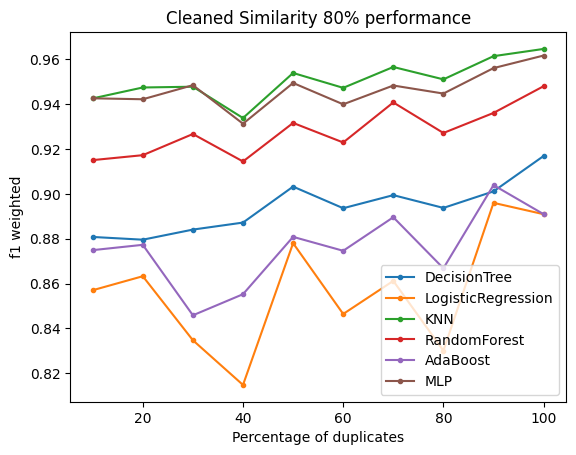

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.109743,0.114834,0.109566,0.122439,0.098428,0.108033,0.099970,0.105577,0.094194,0.090709
LogisticRegression,0.002618,-0.006612,0.009698,0.015320,0.011382,0.001442,0.002802,0.014864,0.001318,-0.005931
KNN,0.011749,0.016004,0.022501,0.016560,0.010539,0.018561,0.013121,0.027361,0.004062,0.008598
RandomForest,0.072746,0.073909,0.083796,0.083702,0.065800,0.074677,0.056292,0.076427,0.057463,0.054509
AdaBoost,0.049694,0.045225,0.054518,0.054998,0.040243,0.032815,0.029523,0.043658,0.025245,0.030374
MLP,0.001912,0.010185,0.019746,0.011094,0.010103,0.012056,0.007329,0.021157,0.003630,0.010232


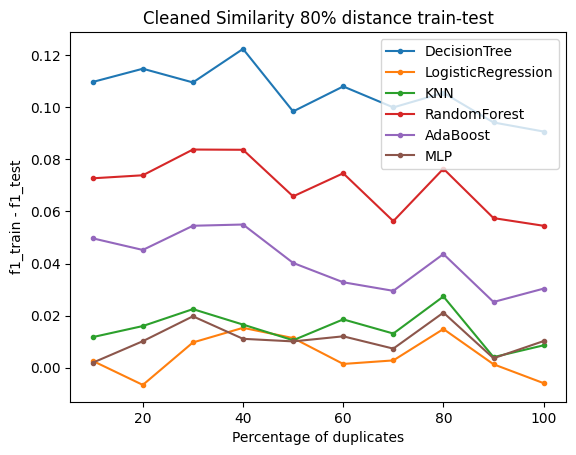

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.049277,0.045051,0.048664,0.053681,0.054439,0.054358,0.061447,0.070054,0.070006,0.066223
LogisticRegression,0.036036,0.034539,0.036194,0.057705,0.061098,0.078560,0.039670,0.045746,0.059354,0.059182
KNN,0.167975,0.251429,0.168839,0.192340,0.234418,0.392324,0.591774,1.182355,1.020315,0.542084
RandomForest,6.515513,3.999626,3.105637,2.203902,2.214958,3.550591,2.416604,2.617725,3.670487,2.663784
AdaBoost,0.987042,1.327883,1.543171,1.074342,1.125511,1.126441,1.126377,1.540002,1.719871,1.225306
MLP,6.969043,11.088537,11.944246,12.084858,9.875744,13.948442,16.400871,14.904119,15.349552,15.706353


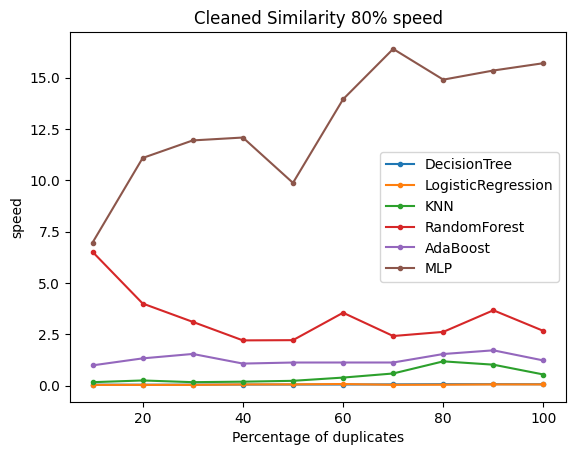

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.880720,0.877478,0.892445,0.898519,0.902865,0.910948,0.880728,0.905617,0.904851,0.897843
LogisticRegression,0.854984,0.859520,0.859426,0.872309,0.888251,0.852394,0.833239,0.884553,0.832380,0.847733
KNN,0.950663,0.946029,0.949479,0.955789,0.959758,0.958263,0.941372,0.957056,0.948986,0.960639
RandomForest,0.920041,0.922598,0.929081,0.934570,0.943144,0.934488,0.923622,0.942195,0.938066,0.936525
AdaBoost,0.868857,0.874254,0.875913,0.889519,0.882348,0.900947,0.860454,0.876101,0.887693,0.871496
MLP,0.944935,0.937306,0.959197,0.947964,0.956945,0.958264,0.934146,0.959416,0.944080,0.950055


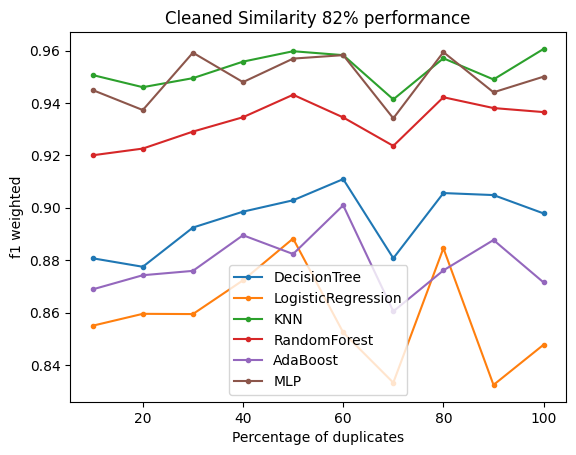

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.123916,0.104014,0.117225,0.099415,0.098787,0.084010,0.117716,0.095233,0.103410,0.101954
LogisticRegression,0.000701,-0.000779,0.020733,0.004466,-0.000771,0.012363,0.006016,-0.011876,0.012263,-0.000143
KNN,0.009324,0.016492,0.017639,0.018392,0.010467,0.019736,0.017107,0.005338,0.018219,0.014170
RandomForest,0.080354,0.069205,0.082904,0.066060,0.061920,0.063085,0.071712,0.053776,0.066357,0.059868
AdaBoost,0.051905,0.042054,0.065569,0.038571,0.037038,0.040448,0.029291,0.034821,0.037306,0.028606
MLP,0.010678,0.013660,0.012782,0.011483,0.004158,0.009168,0.005582,0.005748,0.017655,0.009491


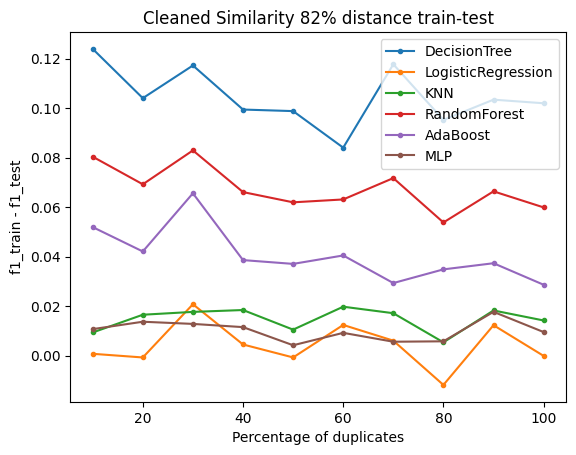

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.071553,0.062009,0.074295,0.072218,0.075575,0.081443,0.084916,0.082938,0.092245,0.071511
LogisticRegression,0.046476,0.038342,0.036627,0.036925,0.038936,0.036522,0.038582,0.040254,0.058499,0.058006
KNN,0.151162,0.174637,0.173935,0.191679,0.220516,0.214330,0.219857,0.231847,0.241031,0.288552
RandomForest,2.758417,2.033388,2.125753,2.327040,2.721377,2.322216,2.442201,2.940452,2.537282,3.309027
AdaBoost,0.950731,0.992043,1.035873,1.058798,1.102242,1.589288,1.364336,1.198712,1.207319,1.220092
MLP,10.674761,14.642802,8.937757,10.567752,13.528029,11.263915,14.007057,13.973421,15.454284,15.706139


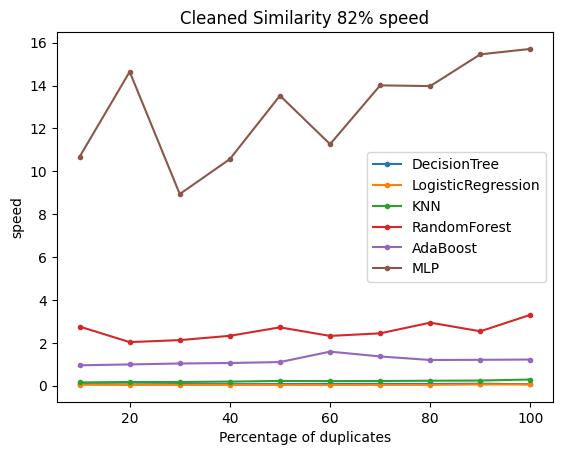

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.878438,0.885236,0.891301,0.893377,0.913103,0.905304,0.917306,0.900162,0.899086,0.909640
LogisticRegression,0.861570,0.873829,0.865333,0.831539,0.858673,0.799241,0.875331,0.835916,0.861210,0.884328
KNN,0.950666,0.947249,0.949588,0.956622,0.957135,0.963048,0.963441,0.957473,0.956720,0.965356
RandomForest,0.919278,0.925159,0.924543,0.942169,0.943594,0.945758,0.949167,0.936582,0.939982,0.940754
AdaBoost,0.860061,0.884104,0.878979,0.856314,0.884956,0.879832,0.904764,0.877656,0.879260,0.907807
MLP,0.948003,0.949403,0.947633,0.952704,0.956003,0.955055,0.961167,0.939908,0.944664,0.965557


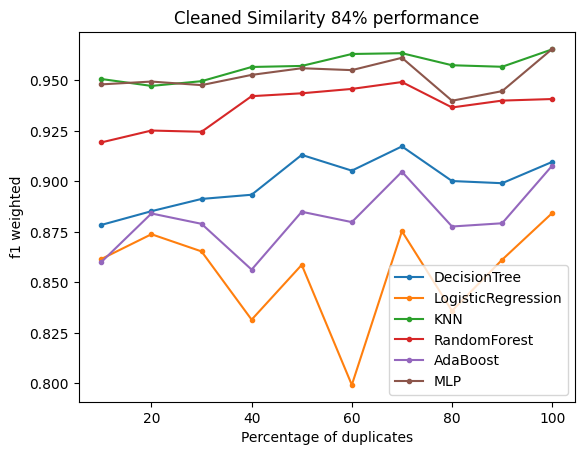

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.113917,0.108519,0.115266,0.102095,0.090582,0.094715,0.091181,0.091724,0.099379,0.077482
LogisticRegression,0.004445,-0.009294,0.005692,0.009503,-0.000306,0.004632,-0.000741,-0.001547,0.004445,0.008269
KNN,0.009310,0.011636,0.013533,0.013691,0.010958,0.010196,0.011798,0.007296,0.007320,0.011640
RandomForest,0.074191,0.072020,0.076150,0.058703,0.056424,0.054512,0.053423,0.057698,0.055346,0.050692
AdaBoost,0.049601,0.043860,0.043846,0.048596,0.033357,0.041127,0.028206,0.027345,0.026730,0.031781
MLP,0.011482,0.009884,0.011213,0.008788,0.010310,0.009288,0.009252,0.005691,0.009268,0.012521


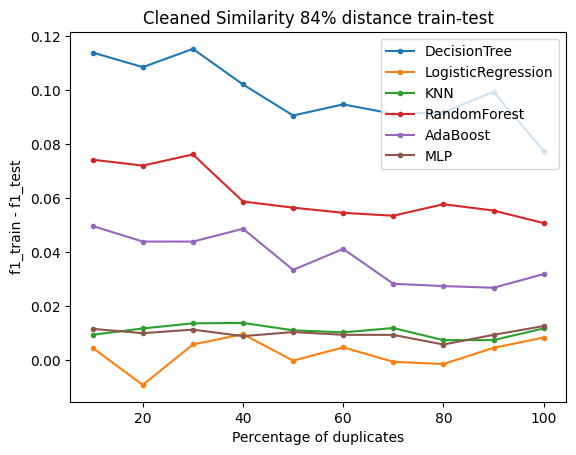

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.049841,0.048793,0.047399,0.050999,0.051224,0.060284,0.066036,0.062906,0.069869,0.069366
LogisticRegression,0.036859,0.036891,0.048848,0.036304,0.039214,0.035857,0.039223,0.039457,0.052984,0.070157
KNN,0.226165,0.236932,0.249446,0.260421,0.305138,0.364980,0.328749,0.334183,0.268067,0.273039
RandomForest,1.892486,1.970601,2.860134,2.153475,2.236493,2.880840,2.509350,2.536196,3.438679,2.614678
AdaBoost,0.971235,1.004116,1.448858,1.524717,1.078320,1.094431,1.129027,1.160130,1.594296,1.735016
MLP,7.094423,8.120333,11.017050,12.061666,12.914188,13.861964,14.160291,14.874414,14.522837,15.906328


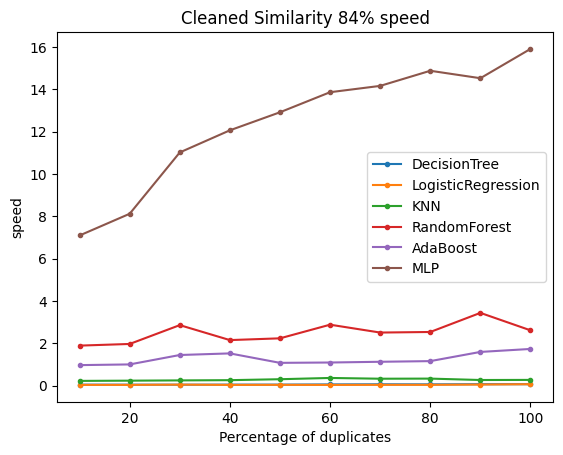

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.878787,0.891969,0.878922,0.892294,0.907896,0.897556,0.918400,0.914591,0.912091,0.919370
LogisticRegression,0.858597,0.854537,0.842768,0.843102,0.874670,0.882049,0.855441,0.853748,0.857868,0.857586
KNN,0.945591,0.944584,0.951219,0.956828,0.938213,0.958867,0.961852,0.969942,0.960844,0.966765
RandomForest,0.917650,0.922650,0.927715,0.945251,0.925711,0.936777,0.942036,0.958019,0.945870,0.945317
AdaBoost,0.864726,0.887342,0.871964,0.865841,0.880924,0.894051,0.908648,0.902675,0.904027,0.877736
MLP,0.945597,0.945635,0.951579,0.955911,0.924018,0.956171,0.964616,0.968037,0.954496,0.960543


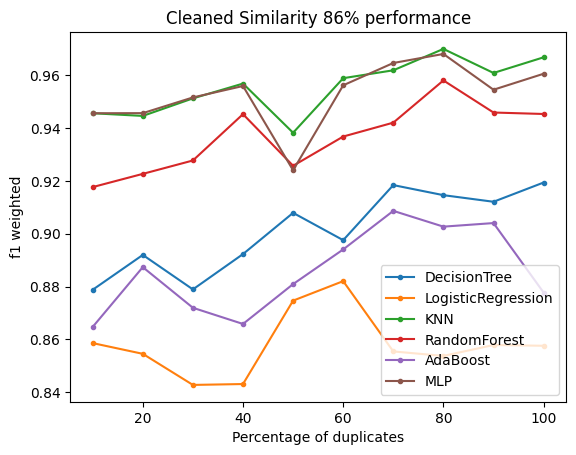

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.119246,0.118665,0.123814,0.100986,0.099189,0.113166,0.078854,0.089515,0.091370,0.085798
LogisticRegression,-0.008451,0.008736,0.001211,-0.007643,0.005987,0.015436,-0.004329,-0.002776,-0.000631,0.005419
KNN,0.007615,0.016491,0.024160,0.013862,0.016070,0.018113,0.009499,0.004375,0.013117,0.008930
RandomForest,0.071254,0.073521,0.076969,0.054756,0.072909,0.064800,0.048437,0.047472,0.059174,0.050207
AdaBoost,0.046366,0.062105,0.055399,0.031354,0.035300,0.053480,0.031785,0.026181,0.031970,0.032168
MLP,0.012455,0.016826,0.021740,0.002173,0.013751,0.014529,0.006565,0.004845,0.015126,0.011845


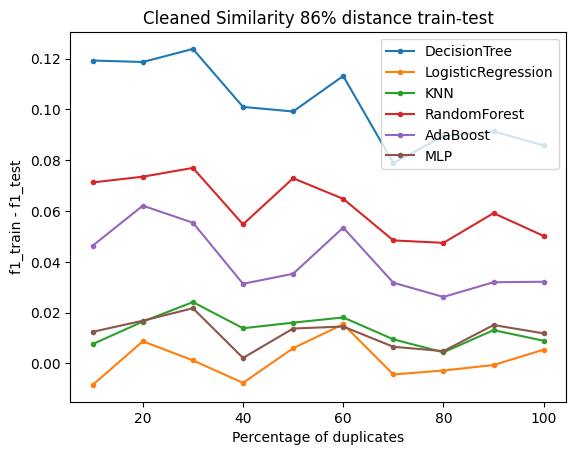

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.050326,0.045133,0.049844,0.047232,0.053782,0.055277,0.059002,0.061416,0.066506,0.068516
LogisticRegression,0.039995,0.041951,0.048038,0.038249,0.037695,0.037613,0.039315,0.042356,0.039629,0.053617
KNN,0.158588,0.219032,0.236393,0.254476,0.270084,0.191169,0.211793,0.221467,0.246658,0.264583
RandomForest,1.922056,2.151227,2.591649,2.084139,2.228287,3.251405,2.422794,2.467589,3.258078,2.652529
AdaBoost,0.962666,1.425598,1.476884,1.069541,1.106179,1.087181,1.121065,1.448179,1.749308,1.212320
MLP,7.069884,10.035095,15.004844,12.079462,11.105426,13.398424,13.858023,14.903233,14.299588,15.555908


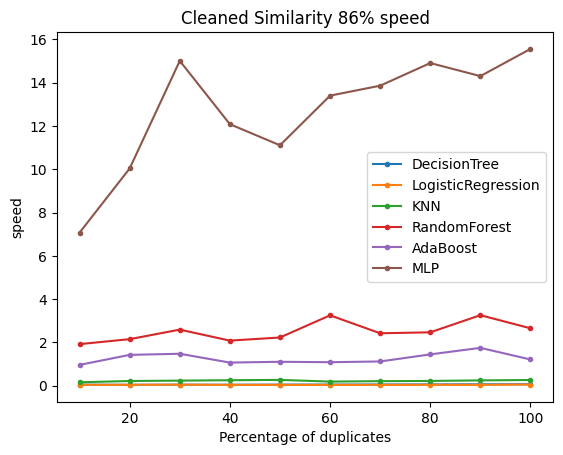

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.879939,0.898018,0.889489,0.890667,0.904700,0.895826,0.909667,0.925330,0.920399,0.922862
LogisticRegression,0.858712,0.871643,0.864134,0.863988,0.848352,0.841706,0.850714,0.854439,0.865977,0.880666
KNN,0.939979,0.948881,0.948886,0.952113,0.957275,0.956740,0.966513,0.968068,0.966882,0.969604
RandomForest,0.911502,0.927259,0.928451,0.931845,0.945530,0.942155,0.950614,0.952873,0.945534,0.953426
AdaBoost,0.873390,0.881381,0.882284,0.898362,0.888947,0.878657,0.905328,0.901802,0.889903,0.902930
MLP,0.942681,0.944706,0.948556,0.955480,0.949334,0.952174,0.964711,0.964220,0.958317,0.972456


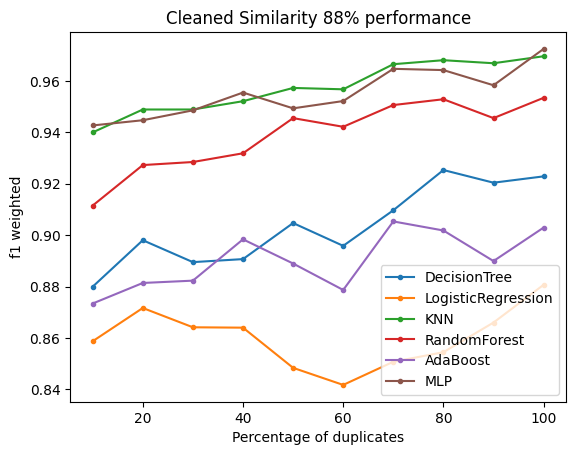

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.111928,0.105129,0.107659,0.109034,0.093804,0.097671,0.074318,0.077445,0.079176,0.085661
LogisticRegression,0.001431,-0.009118,-0.001252,-0.003296,0.008448,-0.003000,-0.011730,-0.003401,0.006770,0.004625
KNN,0.016538,0.015354,0.011504,0.009603,0.015315,0.012743,0.009487,0.010273,0.010596,0.008363
RandomForest,0.074984,0.067412,0.064659,0.059883,0.057639,0.063282,0.044534,0.043718,0.055808,0.052234
AdaBoost,0.056927,0.034520,0.049947,0.029859,0.035985,0.039878,0.029118,0.025724,0.042188,0.034849
MLP,0.002936,0.002437,0.008005,0.007095,0.014494,0.005130,0.007497,0.008686,0.008601,0.011110


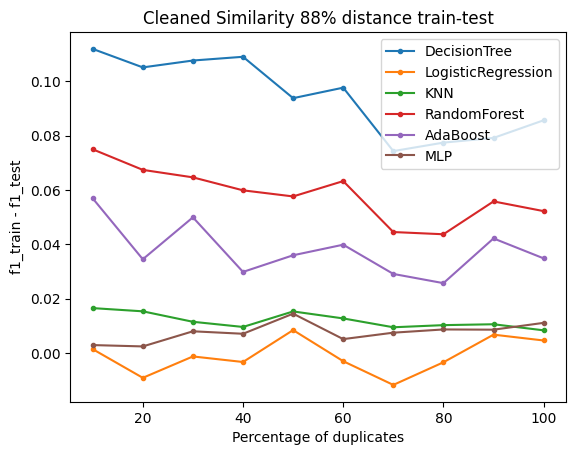

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.052032,0.047623,0.057989,0.051337,0.053078,0.055880,0.062942,0.063062,0.061359,0.068033
LogisticRegression,0.036978,0.047661,0.037292,0.036387,0.037067,0.039704,0.060659,0.058371,0.061013,0.063456
KNN,0.214654,0.225779,0.244160,0.268608,0.286078,0.195251,0.210877,0.224189,0.216382,0.244512
RandomForest,1.922553,2.582795,2.243059,2.193716,3.545352,2.638209,2.319098,2.682407,2.723900,2.616059
AdaBoost,1.064872,1.443980,1.100148,1.030163,1.066967,1.095637,1.098768,1.684203,1.508920,1.179376
MLP,8.454434,10.362467,11.759790,12.300031,10.024405,13.645450,12.577402,15.099848,13.833330,15.630290


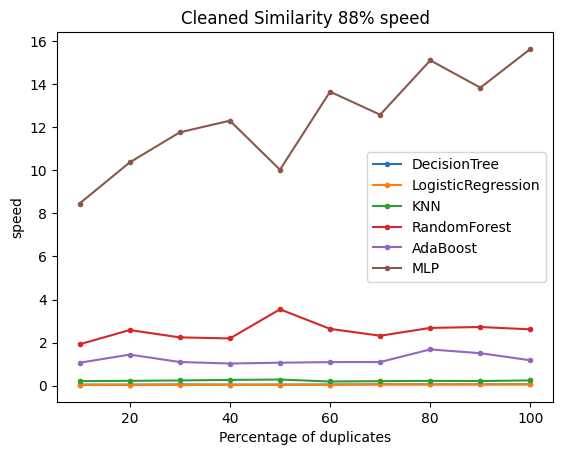

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.884906,0.895704,0.900707,0.900591,0.906238,0.905552,0.910566,0.913539,0.910217,0.916076
LogisticRegression,0.860798,0.871785,0.852613,0.839311,0.865193,0.855249,0.838510,0.862654,0.846042,0.843581
KNN,0.952569,0.957170,0.952533,0.952301,0.963426,0.958489,0.964211,0.962196,0.958823,0.965263
RandomForest,0.926315,0.933225,0.928451,0.940960,0.939230,0.937450,0.948545,0.946571,0.937757,0.953616
AdaBoost,0.870444,0.895428,0.867971,0.888578,0.884952,0.864929,0.869449,0.903453,0.884592,0.891396
MLP,0.944078,0.942252,0.954870,0.955473,0.960482,0.949489,0.949052,0.945304,0.952363,0.960944


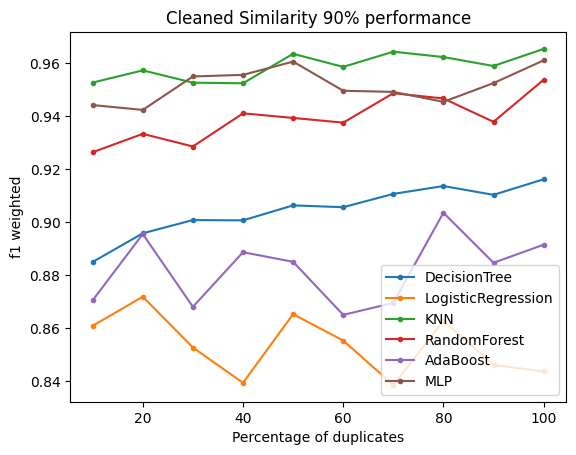

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.121283,0.102223,0.104604,0.102607,0.095825,0.095025,0.088095,0.080632,0.080232,0.077518
LogisticRegression,0.006564,-0.023445,-0.006175,0.000318,0.000458,0.003788,0.002957,-0.004236,0.003134,0.003540
KNN,0.011246,0.011085,0.013929,0.011436,0.013343,0.018004,0.011850,0.006201,0.008008,0.007277
RandomForest,0.072496,0.063473,0.068845,0.059718,0.064309,0.060588,0.055445,0.049657,0.050035,0.046845
AdaBoost,0.057870,0.030210,0.040491,0.032368,0.044716,0.037259,0.038164,0.026147,0.026846,0.020837
MLP,0.010293,0.006235,0.013404,0.007746,0.008809,0.010545,0.015352,0.006895,0.013098,0.008285


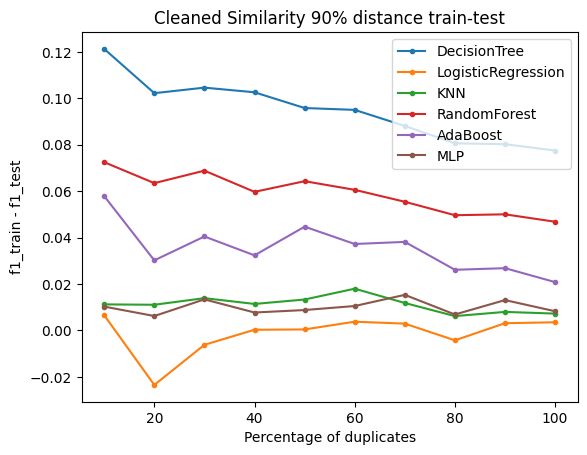

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.051810,0.044710,0.045984,0.048058,0.048841,0.054944,0.054030,0.069429,0.060911,0.063798
LogisticRegression,0.036922,0.036720,0.039080,0.035628,0.038875,0.037081,0.048793,0.039634,0.038006,0.041622
KNN,0.132470,0.171386,0.234521,0.274724,0.271806,0.280086,0.215850,0.206374,0.243304,0.232459
RandomForest,1.918623,2.018691,2.851824,2.127223,2.150017,3.286325,2.277216,2.364106,3.560194,2.536634
AdaBoost,0.958921,1.000828,1.486613,1.438831,1.050540,1.119660,1.094674,1.135230,1.584186,1.713223
MLP,6.972328,7.809639,9.763411,11.855201,15.282504,12.269845,13.116115,12.427645,15.384482,16.001607


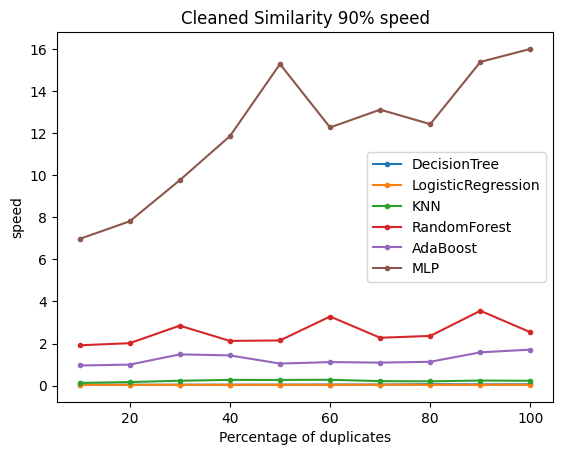

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.880096,0.889657,0.882325,0.896036,0.896858,0.910721,0.908925,0.911811,0.919740,0.918428
LogisticRegression,0.847392,0.853296,0.823008,0.883914,0.862783,0.884234,0.849612,0.841545,0.832933,0.851128
KNN,0.943415,0.945615,0.951772,0.958455,0.954678,0.963014,0.952883,0.960349,0.958401,0.969598
RandomForest,0.913514,0.923879,0.932548,0.935029,0.943094,0.933194,0.943994,0.949243,0.944877,0.951365
AdaBoost,0.872223,0.855613,0.870383,0.894441,0.890899,0.890329,0.878253,0.885996,0.883596,0.906284
MLP,0.924923,0.932101,0.935036,0.955482,0.953116,0.954375,0.940310,0.964234,0.956302,0.966297


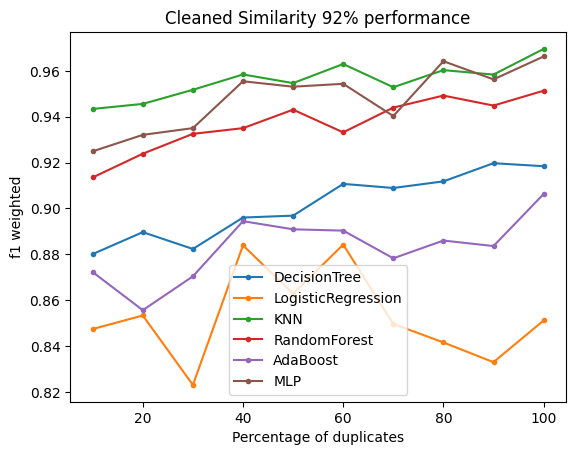

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.110111,0.115591,0.118394,0.102302,0.105632,0.083608,0.096183,0.081497,0.084711,0.076600
LogisticRegression,0.011468,0.012651,0.003947,0.014110,0.005834,0.005188,-0.003695,0.006462,0.004565,-0.003941
KNN,0.024796,0.017578,0.015239,0.016166,0.016116,0.013824,0.012704,0.011731,0.014140,0.005674
RandomForest,0.083392,0.077654,0.068138,0.069236,0.063782,0.058431,0.056283,0.050446,0.053513,0.048145
AdaBoost,0.065765,0.063012,0.060076,0.046017,0.047581,0.045563,0.033065,0.041479,0.033259,0.032695
MLP,0.017985,0.012081,0.015204,0.011161,0.014764,0.010716,0.010337,0.009345,0.016863,0.001613


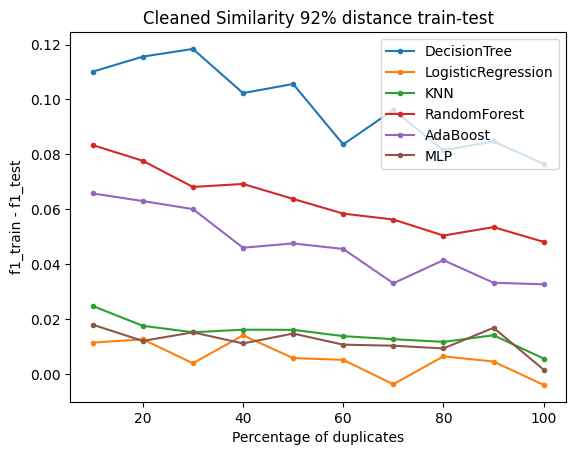

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.060346,0.050056,0.051919,0.061505,0.057333,0.060725,0.064191,0.064246,0.065852,0.068377
LogisticRegression,0.042027,0.044005,0.042381,0.054615,0.058400,0.057240,0.043817,0.045372,0.045771,0.048459
KNN,0.165636,0.177694,0.193005,0.193936,0.208661,0.216378,0.306884,0.310252,0.288672,0.316459
RandomForest,2.005695,2.008689,2.010017,2.839830,2.190223,2.209874,3.387082,2.308061,2.389882,3.574672
AdaBoost,0.981592,1.013502,1.050890,1.073509,1.608982,1.511542,1.117312,1.128028,1.168561,1.761096
MLP,10.244812,9.893418,10.140538,8.688130,12.370013,12.886487,10.852314,13.896153,12.208156,14.472970


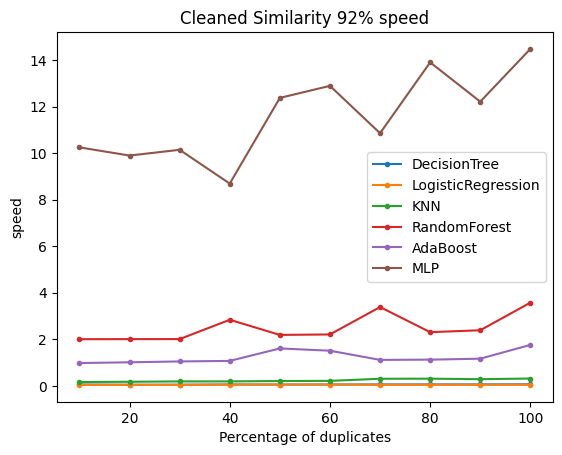

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.885529,0.872562,0.881597,0.882914,0.894028,0.885611,0.887559,0.893477,0.898671,0.891715
LogisticRegression,0.831226,0.843064,0.849644,0.855715,0.821774,0.879161,0.842446,0.869470,0.867047,0.869741
KNN,0.938437,0.944075,0.953919,0.947161,0.941500,0.954261,0.938373,0.952036,0.952576,0.952286
RandomForest,0.911360,0.920099,0.926054,0.921997,0.931978,0.928751,0.918832,0.933172,0.937453,0.934885
AdaBoost,0.855909,0.863397,0.867890,0.867039,0.861706,0.887605,0.857461,0.882162,0.894998,0.882003
MLP,0.936445,0.941676,0.950421,0.950199,0.933076,0.948218,0.934119,0.953073,0.948335,0.945518


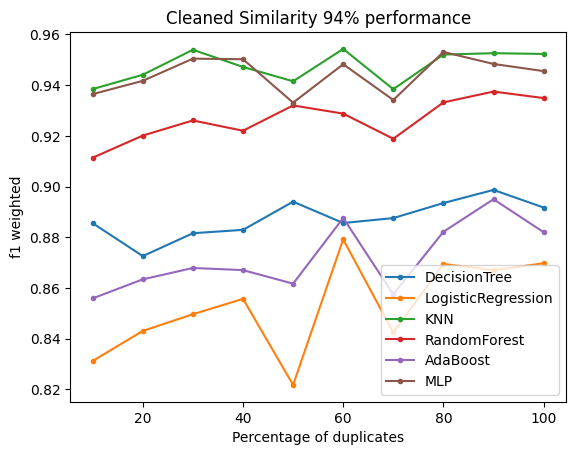

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.118572,0.113827,0.120037,0.116066,0.102001,0.117221,0.111786,0.106860,0.100354,0.100534
LogisticRegression,-0.002834,0.003463,0.004789,0.017926,0.006712,0.002787,0.005226,-0.003602,0.004312,-0.004550
KNN,0.016072,0.013068,0.016305,0.022616,0.018336,0.012441,0.009308,0.009051,0.010762,0.019416
RandomForest,0.074084,0.076698,0.080929,0.085880,0.063250,0.074754,0.072898,0.065463,0.065158,0.066064
AdaBoost,0.044928,0.060704,0.059365,0.067657,0.048146,0.041021,0.054242,0.039629,0.037609,0.045167
MLP,0.015479,0.010584,0.010752,0.014834,0.004472,0.013461,0.004764,0.005063,0.007570,0.016506


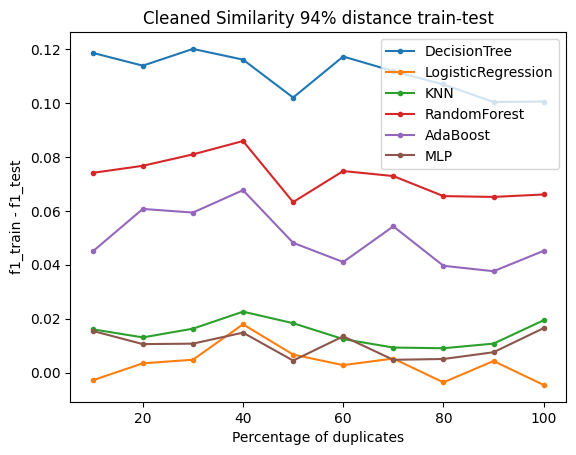

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.055204,0.041241,0.042898,0.049906,0.047149,0.044883,0.050225,0.059156,0.050988,0.051764
LogisticRegression,0.040654,0.035679,0.035130,0.039322,0.037267,0.040556,0.038166,0.040002,0.052163,0.039508
KNN,0.141141,0.139552,0.138133,0.154639,0.172746,0.266493,0.236944,0.238312,0.312271,0.298988
RandomForest,3.029670,1.943654,2.070622,2.495941,2.332657,2.060862,2.110766,3.082224,2.150313,2.145206
AdaBoost,1.444161,1.440681,1.055734,1.039653,1.084320,1.033653,1.102921,1.511113,1.207507,1.124461
MLP,9.138698,9.772784,11.050109,11.207108,11.175889,11.767294,10.692976,8.595677,13.632378,12.561752


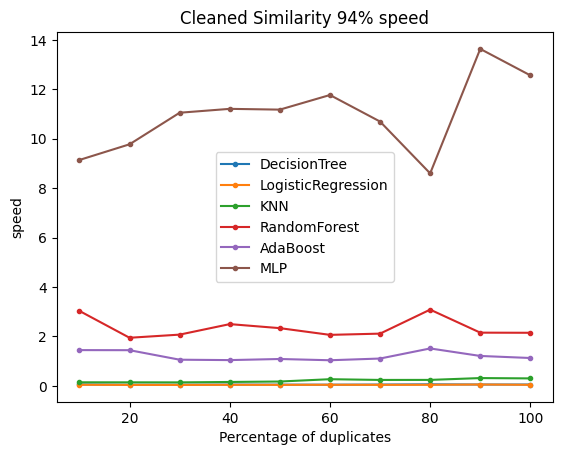

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.866617,0.862831,0.864104,0.865778,0.864505,0.863670,0.867887,0.864511,0.864520,0.864039
LogisticRegression,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573
KNN,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225
RandomForest,0.906006,0.903455,0.900964,0.901784,0.903066,0.900538,0.905155,0.902213,0.903059,0.903067
AdaBoost,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295
MLP,0.943352,0.945015,0.944190,0.943343,0.944610,0.944179,0.945442,0.942936,0.945452,0.940409


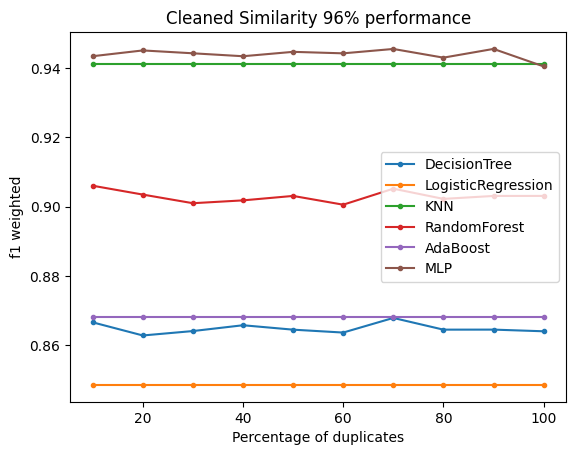

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.130527,0.134276,0.135117,0.132145,0.134738,0.130947,0.134714,0.132234,0.134730,0.128829
LogisticRegression,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301
KNN,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510
RandomForest,0.091880,0.089778,0.090206,0.091461,0.087673,0.088949,0.088951,0.091039,0.088509,0.085169
AdaBoost,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203
MLP,0.018133,0.016170,0.017123,0.017434,0.015333,0.014611,0.016651,0.013590,0.015626,0.016176


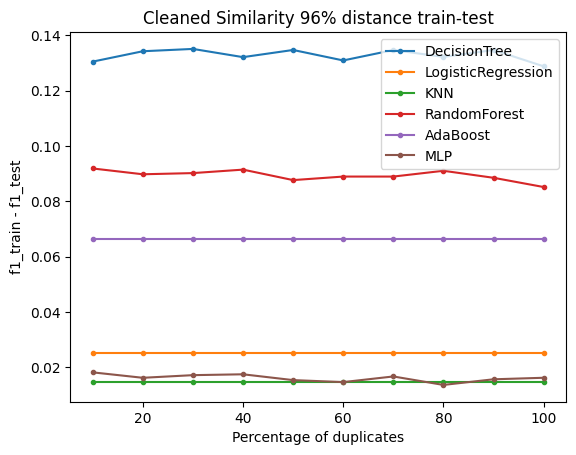

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.054165,0.041847,0.042153,0.041959,0.040967,0.042187,0.042263,0.042459,0.042051,0.041455
LogisticRegression,0.039943,0.039912,0.036253,0.035813,0.049176,0.035889,0.038153,0.037702,0.043885,0.036243
KNN,0.146588,0.133617,0.158173,0.143711,0.138733,0.182640,0.168266,0.147260,0.168330,0.131976
RandomForest,2.028965,2.670339,1.884773,1.922171,2.731943,2.016091,1.936705,1.917521,2.854374,1.915571
AdaBoost,0.987916,1.009681,0.997639,1.391102,1.277878,1.024827,1.002819,1.000122,0.999218,1.181186
MLP,9.407256,9.195452,9.231236,9.372933,9.064094,8.959677,8.506897,12.181028,7.495091,7.756837


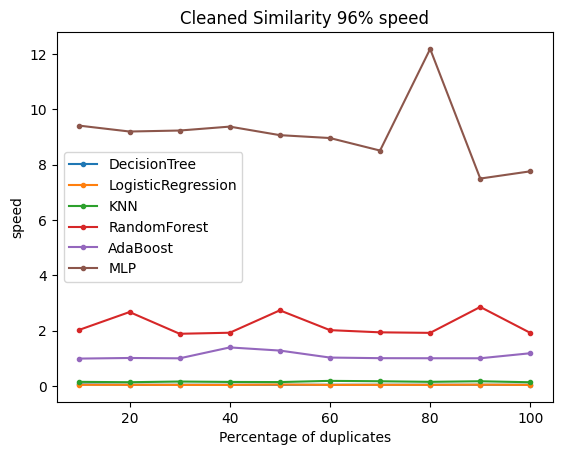

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.864495,0.865381,0.866201,0.865748,0.862401,0.865365,0.869149,0.860310,0.871218,0.865351
LogisticRegression,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573,0.848573
KNN,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225,0.941225
RandomForest,0.909783,0.898850,0.902226,0.903921,0.908959,0.911479,0.906836,0.903884,0.902664,0.899688
AdaBoost,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295,0.868295
MLP,0.943761,0.944184,0.943340,0.945024,0.942918,0.945024,0.942490,0.942080,0.942498,0.943351


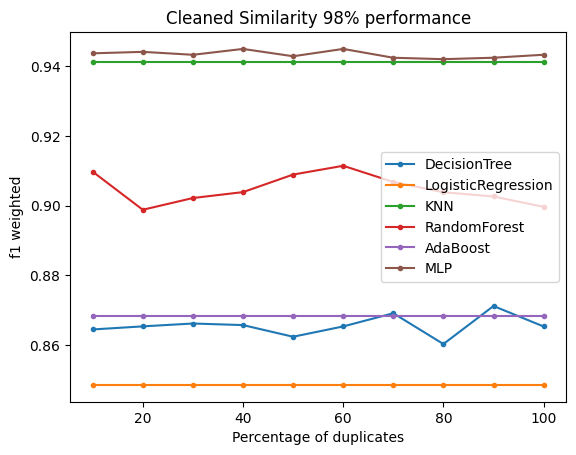

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.135540,0.137636,0.135538,0.132612,0.135990,0.137206,0.133011,0.131355,0.133866,0.133481
LogisticRegression,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301,0.025301
KNN,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510,0.014510
RandomForest,0.088082,0.087701,0.090215,0.087266,0.090628,0.092294,0.087280,0.091023,0.093163,0.088533
AdaBoost,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203,0.066203
MLP,0.017192,0.016293,0.016879,0.016282,0.014067,0.015215,0.017020,0.017126,0.014843,0.015388


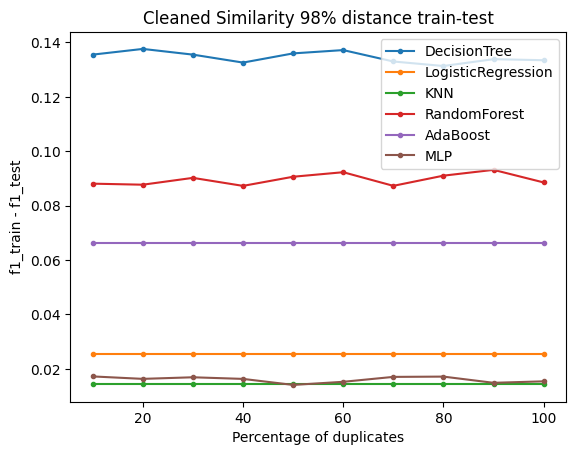

,10,20,30,40,50,60,70,80,90,100
DecisionTree,0.054244,0.044452,0.041173,0.053550,0.041781,0.042296,0.042002,0.043414,0.045556,0.044945
LogisticRegression,0.039708,0.040378,0.036628,0.036891,0.037168,0.041201,0.037695,0.036309,0.035316,0.036700
KNN,0.136652,0.147288,0.130959,0.130571,0.144547,0.205379,0.204183,0.210013,0.217560,0.206181
RandomForest,2.188847,1.903727,1.913061,2.950757,1.976032,1.973066,2.217963,2.457162,1.923717,1.957582
AdaBoost,1.421248,1.436701,0.965770,1.006486,0.998657,1.017463,1.022018,1.515738,1.408567,1.006077
MLP,6.956407,7.311042,7.652119,7.589277,7.538023,7.712847,8.047780,7.631245,8.035632,7.637774


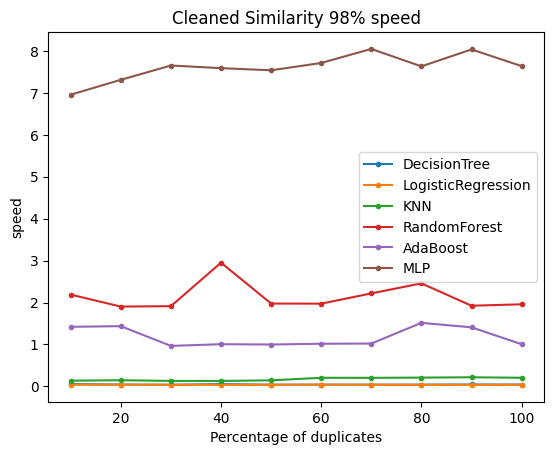

In [ ]:
results_for_each_similarity = []

for similarity in similarities:
  results_for_each_algorithm = []

  # For each algorithm, we compute the results on all the datasets of a fixed similarity
  for algorithm in CLASSIFICATION_ALGORITHMS:

    results_single_algorithm = []

    # Iteration over the different duplicates (fixed similarity)
    for dup in duplicates:

      key = "D_S"+str(similarity)+"_R"+str(dup)
      X = clean_data_points_dictionary[key]
      y = clean_data_labels_dictionary[key]

      # Shuffling the datasets before performing classification
      X, y = shuffle(X, y, random_state=SEED)

      #print("==> Performing "+str(algorithm)+" on "+str(key))

      results_analysis = classification(X, y, algorithm, SEED)
      results_single_algorithm.append(results_analysis)

    results_for_each_algorithm.append(results_single_algorithm)

  results_for_each_similarity.append(results_for_each_algorithm)

  # Generating the plots
  plot_type = ["performance","distance train-test","speed"]
  for plt_t in plot_type:
    plot(x_axis_values = duplicates,
        x_label = "Percentage of duplicates",
        results = results_for_each_algorithm,
        title = "Cleaned Similarity " + str(similarity) + "% " + plt_t,
        algorithms = CLASSIFICATION_ALGORITHMS,
        plot_type = plt_t)


## DQ2: Dimensionality

###Data collection and pollution
For this second problem, the collection and pollution phase are mixed since we modify (so, pollute) the parameters of the dataset directly upon creation.

In [ ]:
# Parameters definition
num_of_experiment = 10

In [ ]:
#parameters for varying features
datasets_different_features = []
min_num_of_features = 5
max_num_of_features = min_num_of_features * num_of_experiment
step_features = 5
print(min_num_of_features,max_num_of_features,step_features)

5 50 5


In [ ]:
#parameters for varying samples
datasets_different_samples = []
min_num_of_samples = 1000
max_num_of_samples = min_num_of_samples * num_of_experiment
step_samples = 1000
print(min_num_of_samples,max_num_of_samples,step_samples)

1000 10000 1000


#### Datasets with different number of features

In [ ]:
#for every iteration fix the number of samples
for num_samples in range(min_num_of_samples, max_num_of_samples+1, step_samples):
    # we have a fixed number of samples
    # Make 10 datasets with different features and other parameters fixed
    print("num of samples="+str(num_samples))
    datasets_different_features_same_samples = []
    for feat in range(min_num_of_features, max_num_of_features+1, step_features):
        X, y = make_dataset_for_classification(n_samples=num_samples,
                                            n_features=feat,
                                            n_informative=5,
                                            n_redundant=0,
                                            n_repeated=0,
                                            n_classes=2,
                                            n_clusters_per_class=2,
                                            weights=None,
                                            flip_y=0.01,
                                            class_sep=1.0,
                                            hypercube=True,
                                            seed=SEED)
        datasets_different_features_same_samples.append((X,y))
        print("Added dataset with shape "+str(X.shape))

    datasets_different_features.append(datasets_different_features_same_samples)

num of samples=1000
Added dataset with shape (1000, 5)
Added dataset with shape (1000, 10)
Added dataset with shape (1000, 15)
Added dataset with shape (1000, 20)
Added dataset with shape (1000, 25)
Added dataset with shape (1000, 30)
Added dataset with shape (1000, 35)
Added dataset with shape (1000, 40)
Added dataset with shape (1000, 45)
Added dataset with shape (1000, 50)
num of samples=2000
Added dataset with shape (2000, 5)
Added dataset with shape (2000, 10)
Added dataset with shape (2000, 15)
Added dataset with shape (2000, 20)
Added dataset with shape (2000, 25)
Added dataset with shape (2000, 30)
Added dataset with shape (2000, 35)
Added dataset with shape (2000, 40)
Added dataset with shape (2000, 45)
Added dataset with shape (2000, 50)
num of samples=3000
Added dataset with shape (3000, 5)
Added dataset with shape (3000, 10)
Added dataset with shape (3000, 15)
Added dataset with shape (3000, 20)
Added dataset with shape (3000, 25)
Added dataset with shape (3000, 30)
Added d

#### Datasets with different number of samples

In [ ]:
#for every iteration fix the number of features
for num_features in range(min_num_of_features, max_num_of_features+1, step_features):

    # Make 10 datasets with different samples and other parameters fixed
    print("num of features="+str(num_features))
    datasets_different_samples_same_feature = []
    for sampl in range(min_num_of_samples, max_num_of_samples+1, step_samples):
        X, y = make_dataset_for_classification(n_samples=sampl,
                                            n_features=num_features,
                                            n_informative=5,
                                            n_redundant=0,
                                            n_repeated=0,
                                            n_classes=2,
                                            n_clusters_per_class=2,
                                            weights=None,
                                            flip_y=0.01,
                                            class_sep=1.0,
                                            hypercube=True,
                                            seed=2023)
        datasets_different_samples_same_feature.append((X,y))
        print("Added dataset with shape "+str(X.shape))

    datasets_different_samples.append(datasets_different_samples_same_feature)

num of features=5
Added dataset with shape (1000, 5)
Added dataset with shape (2000, 5)
Added dataset with shape (3000, 5)
Added dataset with shape (4000, 5)
Added dataset with shape (5000, 5)
Added dataset with shape (6000, 5)
Added dataset with shape (7000, 5)
Added dataset with shape (8000, 5)
Added dataset with shape (9000, 5)
Added dataset with shape (10000, 5)
num of features=10
Added dataset with shape (1000, 10)
Added dataset with shape (2000, 10)
Added dataset with shape (3000, 10)
Added dataset with shape (4000, 10)
Added dataset with shape (5000, 10)
Added dataset with shape (6000, 10)
Added dataset with shape (7000, 10)
Added dataset with shape (8000, 10)
Added dataset with shape (9000, 10)
Added dataset with shape (10000, 10)
num of features=15
Added dataset with shape (1000, 15)
Added dataset with shape (2000, 15)
Added dataset with shape (3000, 15)
Added dataset with shape (4000, 15)
Added dataset with shape (5000, 15)
Added dataset with shape (6000, 15)
Added dataset wi

###Data analysis and evaluation

#### Run of classification algorithms with generation of plots

In [ ]:
CLASSIFICATION_ALGORITHMS = ["DecisionTree","LogisticRegression","KNN","RandomForest","AdaBoost","MLP"]

#### Different number of features

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.878767,0.835673,0.841631,0.809082,0.839257,0.832567,0.830447,0.818311,0.790336,0.811868
LogisticRegression,0.858947,0.850367,0.860313,0.838047,0.846797,0.840464,0.847903,0.834467,0.836259,0.833580
KNN,0.944547,0.875697,0.854878,0.812240,0.799586,0.770033,0.773147,0.712873,0.724706,0.724923
RandomForest,0.909877,0.890677,0.891920,0.872982,0.881712,0.878150,0.874397,0.861459,0.853476,0.867706
AdaBoost,0.859821,0.857379,0.861666,0.842338,0.853512,0.847506,0.844888,0.835743,0.833360,0.842363
MLP,0.943319,0.927078,0.901577,0.861951,0.862215,0.848358,0.845444,0.820738,0.823429,0.818785


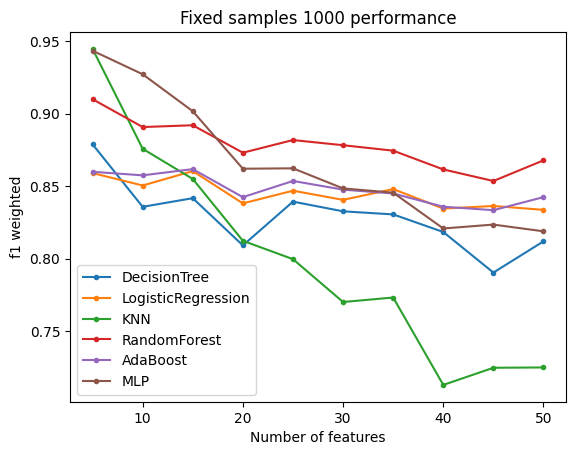

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.120851,0.152985,0.142509,0.177159,0.164281,0.175690,0.178715,0.177142,0.197511,0.185552
LogisticRegression,0.005209,0.021013,0.005121,0.021141,0.034856,0.018254,0.016195,0.027015,0.021672,0.038833
KNN,0.021661,0.048130,0.053917,0.077085,0.078880,0.105787,0.079678,0.124287,0.109196,0.102718
RandomForest,0.092618,0.103943,0.115146,0.120546,0.119258,0.130468,0.113859,0.140571,0.130223,0.134454
AdaBoost,0.052940,0.076464,0.074846,0.093355,0.102909,0.102896,0.088139,0.124481,0.113476,0.128941
MLP,0.017556,0.045351,0.077033,0.122295,0.148415,0.152673,0.134594,0.172585,0.172452,0.181251


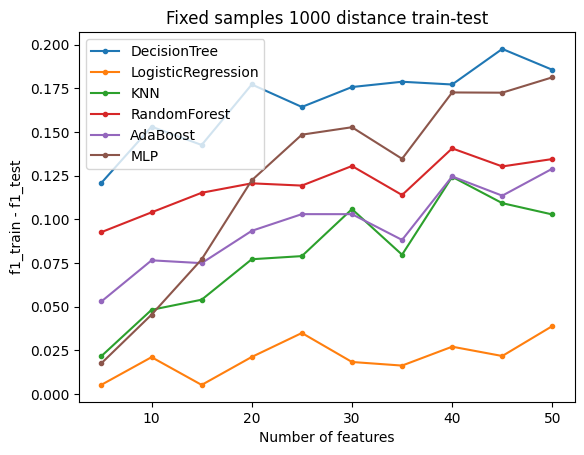

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.057955,0.090038,0.119466,0.173186,0.195385,0.224482,0.230664,0.303365,0.325780,0.372625
LogisticRegression,0.062739,0.073850,0.082033,0.076529,0.112587,0.083970,0.080990,0.078492,0.081514,0.099872
KNN,0.203870,0.210294,0.339085,0.673517,0.208506,0.206565,0.208588,0.200165,0.201710,0.205033
RandomForest,2.259804,3.845484,2.814591,3.869109,3.683306,4.718708,3.825640,4.591556,4.893408,4.764842
AdaBoost,1.389061,1.469055,1.718136,2.172110,2.190563,2.444073,3.455402,2.962023,3.565016,3.442399
MLP,11.093182,9.028554,11.540200,10.820873,12.236290,10.933862,12.682562,12.748395,12.993173,13.060983


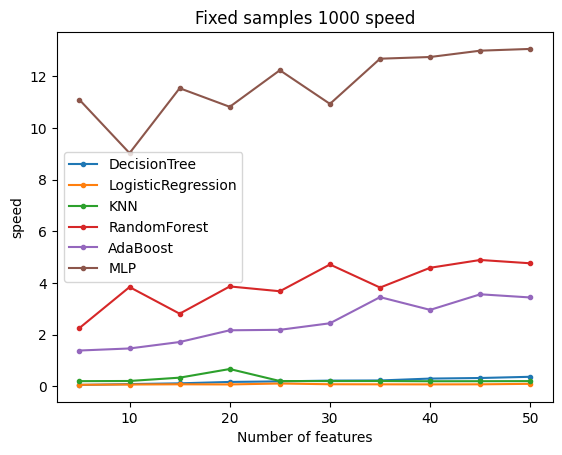

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.912484,0.893269,0.879370,0.891633,0.874606,0.875827,0.871431,0.876019,0.884823,0.867106
LogisticRegression,0.912284,0.907271,0.897086,0.900591,0.895194,0.908955,0.886262,0.886649,0.892918,0.892733
KNN,0.946665,0.893732,0.848904,0.838323,0.798059,0.806066,0.796879,0.772541,0.771028,0.736483
RandomForest,0.939375,0.930197,0.920643,0.919777,0.918134,0.917097,0.908122,0.904610,0.916688,0.910226
AdaBoost,0.919396,0.914361,0.905447,0.904564,0.878561,0.907726,0.889159,0.895387,0.901692,0.889803
MLP,0.953332,0.942901,0.922717,0.901648,0.879793,0.880640,0.881059,0.872711,0.883350,0.870239


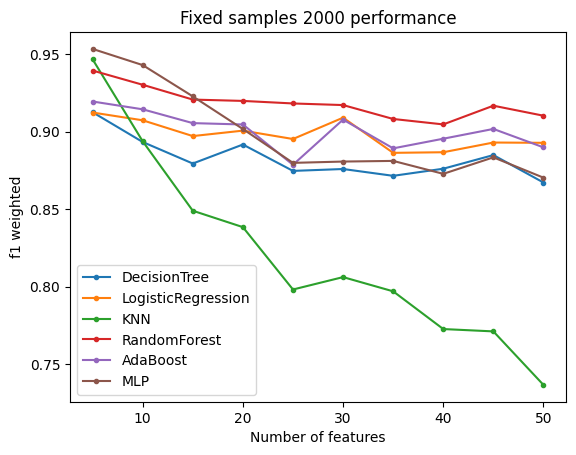

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.091716,0.095031,0.122126,0.114161,0.133107,0.118964,0.123776,0.117935,0.115645,0.129170
LogisticRegression,0.002140,-0.000377,0.015044,0.001049,0.009205,0.009708,0.012225,0.017932,0.013893,0.018948
KNN,0.023313,0.038508,0.056695,0.075747,0.096438,0.082557,0.085075,0.092063,0.102168,0.118440
RandomForest,0.063567,0.064806,0.075405,0.077497,0.085390,0.091471,0.094188,0.088317,0.085205,0.090649
AdaBoost,0.030280,0.026410,0.043377,0.045811,0.050128,0.043743,0.053819,0.055178,0.049722,0.053705
MLP,0.015972,0.028366,0.062245,0.082062,0.113724,0.116876,0.117490,0.122690,0.119575,0.127281


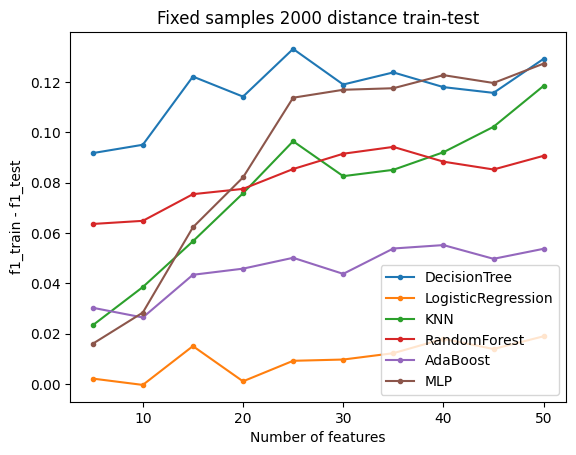

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.089308,0.155965,0.209104,0.288965,0.417972,0.461409,0.536071,0.622978,0.675384,1.007665
LogisticRegression,0.153120,0.234293,0.189407,0.268334,0.105597,0.096129,0.106666,0.113092,0.113378,0.109329
KNN,0.377508,0.419582,0.519106,0.367036,0.336938,0.407322,0.381084,0.374685,0.396594,0.378381
RandomForest,3.365298,4.398014,5.546319,5.939421,7.049565,7.388239,7.904269,8.833166,8.954416,9.535025
AdaBoost,1.696317,2.136100,2.772921,3.151489,4.285633,4.140479,4.679243,5.893228,6.473536,6.911994
MLP,18.267444,20.191054,21.363096,19.830782,21.346614,23.176664,23.174444,24.070094,24.276488,24.265482


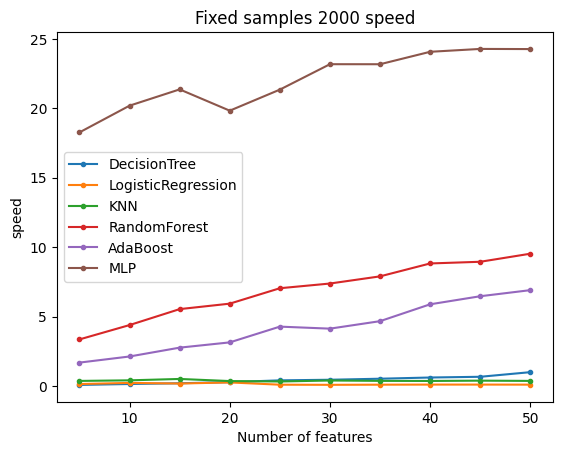

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.877804,0.871248,0.858180,0.850008,0.848063,0.845711,0.842351,0.841098,0.834714,0.838464
LogisticRegression,0.895985,0.889477,0.895289,0.883398,0.883157,0.888534,0.887288,0.882739,0.878484,0.873994
KNN,0.942502,0.883723,0.843843,0.817821,0.790519,0.776049,0.773105,0.743549,0.742672,0.736250
RandomForest,0.920822,0.914562,0.907035,0.903177,0.901760,0.899268,0.896759,0.889291,0.883491,0.882463
AdaBoost,0.867085,0.869721,0.859822,0.848452,0.848071,0.851930,0.849428,0.840705,0.844846,0.835703
MLP,0.948055,0.928739,0.905674,0.893604,0.879425,0.883636,0.873852,0.864310,0.863485,0.853765


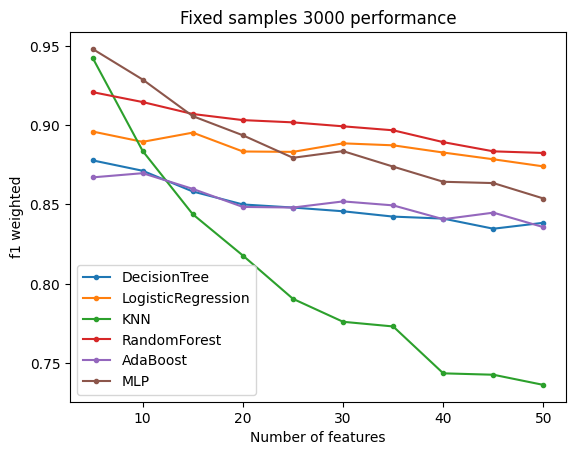

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.127786,0.133735,0.149880,0.148480,0.151110,0.153921,0.157093,0.154175,0.166414,0.162367
LogisticRegression,0.002319,0.001790,0.006365,0.005038,0.000017,0.006013,0.009707,0.007853,0.007894,0.010294
KNN,0.023884,0.050301,0.062770,0.075827,0.077675,0.087008,0.088613,0.102756,0.107889,0.110022
RandomForest,0.082789,0.085005,0.098469,0.093898,0.095705,0.103933,0.105735,0.108059,0.116154,0.114058
AdaBoost,0.024055,0.030837,0.035027,0.037177,0.033548,0.044739,0.043873,0.049643,0.053421,0.055396
MLP,0.011737,0.029040,0.063463,0.091291,0.108022,0.125181,0.122237,0.130136,0.133335,0.137934


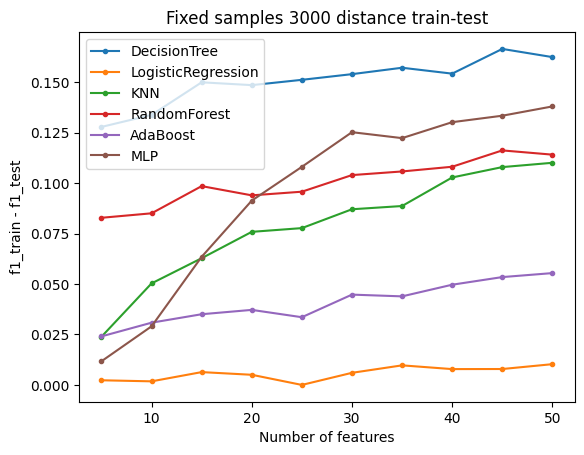

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.201099,0.317770,0.455117,0.558245,0.648567,0.726935,0.870372,0.955720,1.170339,1.511897
LogisticRegression,0.205930,0.257262,0.325558,0.103055,0.109080,0.108983,0.141322,0.111429,0.125061,0.131016
KNN,0.530308,0.824680,1.071936,0.933131,0.600714,0.538897,0.524304,0.529408,1.057790,0.557628
RandomForest,4.606812,6.251696,6.696935,8.286906,10.798988,10.659135,11.383208,13.012134,13.172245,15.047752
AdaBoost,2.785232,2.770655,3.742992,4.262314,5.890121,6.641659,7.336051,8.063766,8.899041,9.524485
MLP,28.304871,31.374493,30.814239,33.733984,33.659121,32.289712,32.804509,35.238006,32.899380,35.056188


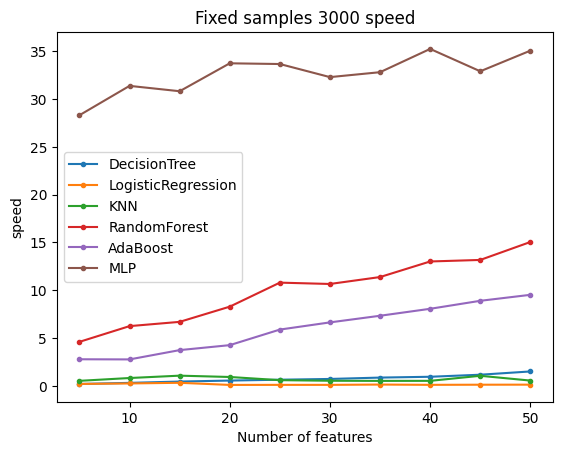

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.911246,0.902495,0.892084,0.887700,0.885515,0.887485,0.879664,0.881033,0.873127,0.876259
LogisticRegression,0.893840,0.896352,0.896628,0.893315,0.891730,0.892387,0.894030,0.890170,0.894029,0.891025
KNN,0.954372,0.906072,0.862457,0.819386,0.801496,0.788546,0.762971,0.758408,0.741675,0.718003
RandomForest,0.949791,0.944685,0.931562,0.931979,0.926665,0.923125,0.912275,0.911976,0.916119,0.907085
AdaBoost,0.894677,0.891670,0.884062,0.883533,0.879351,0.885198,0.886133,0.880698,0.879349,0.882400
MLP,0.958748,0.946874,0.937499,0.924894,0.915203,0.908956,0.901859,0.903105,0.898222,0.895006


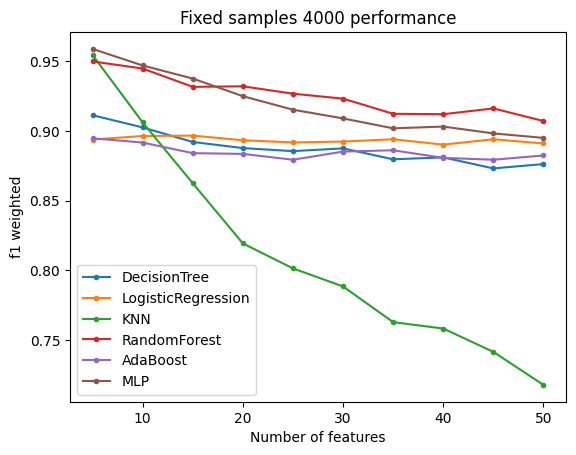

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.091669,0.105207,0.104895,0.115003,0.118974,0.116575,0.113890,0.116138,0.115312,0.125193
LogisticRegression,0.005543,0.003768,0.006489,-0.004100,0.003234,0.008985,0.001983,0.008775,0.005575,0.016352
KNN,0.015084,0.038089,0.049956,0.070566,0.087738,0.085474,0.097394,0.103675,0.108310,0.111286
RandomForest,0.053859,0.058122,0.064375,0.066936,0.070732,0.078444,0.084895,0.081972,0.091989,0.088126
AdaBoost,0.021817,0.025705,0.027418,0.023253,0.033072,0.037203,0.032936,0.028614,0.030272,0.035100
MLP,0.011047,0.019372,0.042694,0.065650,0.081065,0.091377,0.101357,0.100195,0.098019,0.107711


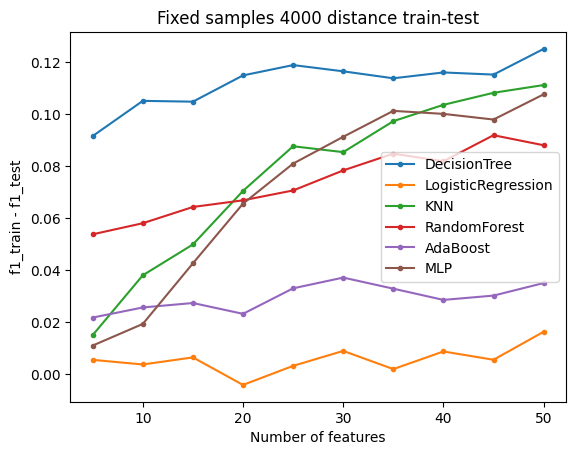

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.174921,0.297394,0.446630,0.585241,0.740882,0.893450,1.333624,1.410379,1.448148,1.478322
LogisticRegression,0.098129,0.140528,0.147934,0.115192,0.119373,0.119016,0.145775,0.127363,0.129996,0.170966
KNN,0.890850,1.070778,1.510213,1.476390,0.734385,0.733087,0.811537,1.157701,0.746058,0.769451
RandomForest,6.526057,8.853107,9.435432,11.729191,14.006009,14.361809,15.195770,17.344835,17.202813,20.010741
AdaBoost,2.610150,3.371297,5.013635,5.411000,6.396408,7.434925,9.012096,10.238895,10.502584,12.223020
MLP,35.117402,36.612358,38.379956,41.379669,42.648452,43.773915,46.076037,45.514687,43.681122,40.127110


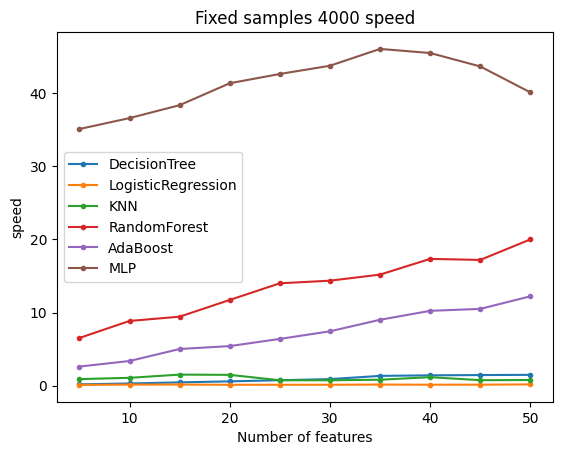

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.916489,0.899257,0.893408,0.891658,0.885422,0.888584,0.877579,0.885999,0.881497,0.884153
LogisticRegression,0.851237,0.848594,0.846742,0.848747,0.845995,0.847438,0.840601,0.846299,0.845406,0.842913
KNN,0.957500,0.916831,0.889207,0.854342,0.834271,0.810356,0.791225,0.781317,0.760015,0.755804
RandomForest,0.954330,0.941842,0.935250,0.930084,0.928255,0.924176,0.911094,0.917835,0.909244,0.909659
AdaBoost,0.846120,0.847834,0.838840,0.841588,0.838575,0.840438,0.836687,0.839405,0.832499,0.838244
MLP,0.963416,0.952254,0.942168,0.927835,0.916587,0.913755,0.898078,0.901663,0.888663,0.894912


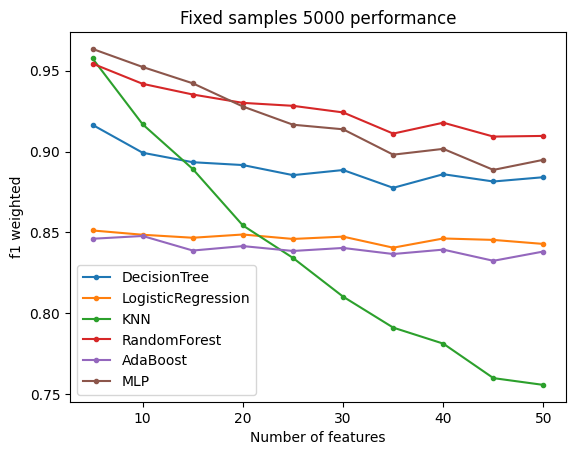

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.079500,0.101339,0.106673,0.108925,0.112996,0.116411,0.113836,0.111501,0.110594,0.122508
LogisticRegression,-0.003561,0.007402,0.004430,0.005963,0.010648,0.004543,0.001374,0.002283,0.006053,0.006542
KNN,0.009331,0.034308,0.050554,0.055544,0.068796,0.086694,0.077884,0.086409,0.095290,0.106048
RandomForest,0.045001,0.058751,0.065248,0.067748,0.072581,0.080326,0.080924,0.080917,0.092009,0.092676
AdaBoost,0.015120,0.025732,0.023881,0.026365,0.030113,0.026702,0.027714,0.023258,0.029993,0.026355
MLP,0.003203,0.025167,0.043867,0.060308,0.081307,0.087995,0.095997,0.097584,0.109664,0.105913


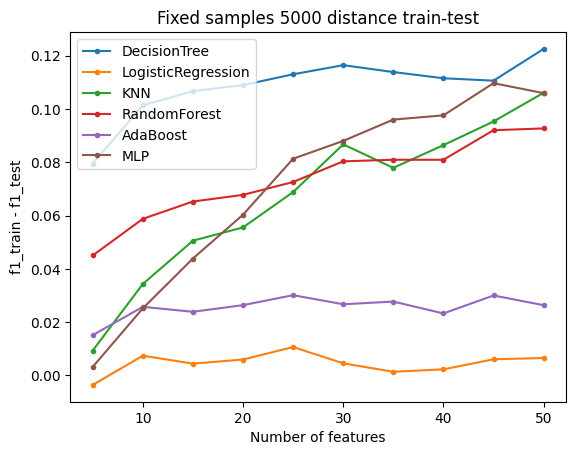

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.316129,0.594888,0.845038,0.877177,1.043761,1.284997,1.667082,2.224539,2.091265,2.288463
LogisticRegression,0.131730,0.114417,0.130648,0.125208,0.148158,0.136923,0.322657,0.366564,0.318894,0.293212
KNN,1.037870,1.372020,2.570449,0.947052,1.111965,0.945939,0.974793,1.855057,0.969316,1.039293
RandomForest,7.705379,10.237426,11.976928,14.585087,17.628383,18.770871,19.571453,22.215878,23.214184,26.143228
AdaBoost,2.839400,5.164657,5.767575,6.792291,8.924597,10.265857,10.878529,12.774021,14.146991,15.364191
MLP,49.393891,49.919783,52.399647,50.764872,52.018425,52.014808,56.421939,55.905574,56.668674,49.809661


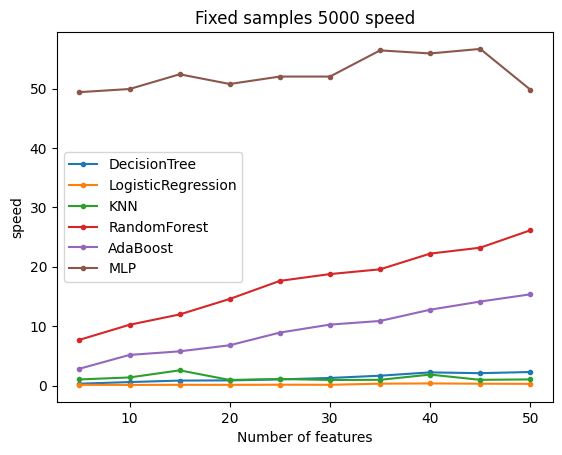

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.880144,0.862150,0.856942,0.848746,0.845070,0.849990,0.840562,0.837841,0.850210,0.836258
LogisticRegression,0.842619,0.848525,0.842051,0.841160,0.838102,0.835617,0.837217,0.842473,0.837278,0.836747
KNN,0.932641,0.891866,0.863948,0.847006,0.818820,0.796968,0.794090,0.769714,0.758081,0.743986
RandomForest,0.925906,0.917357,0.908110,0.909932,0.903059,0.899031,0.896182,0.899729,0.897634,0.894868
AdaBoost,0.860196,0.858644,0.858420,0.855824,0.854486,0.855200,0.847422,0.852467,0.854141,0.849288
MLP,0.944376,0.934304,0.925546,0.907079,0.890554,0.885287,0.871748,0.865495,0.868261,0.862506


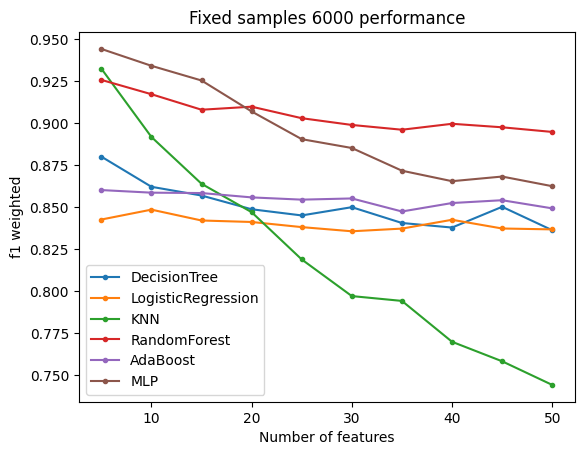

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.123135,0.137025,0.144315,0.151532,0.151391,0.154091,0.159367,0.161173,0.159652,0.165630
LogisticRegression,0.000156,-0.005178,-0.000131,0.002589,-0.001902,0.006264,0.008169,0.002897,0.011838,0.006838
KNN,0.016152,0.034329,0.049221,0.058792,0.067183,0.077181,0.083211,0.099188,0.099461,0.108403
RandomForest,0.078470,0.083681,0.090138,0.094583,0.096109,0.100693,0.102918,0.098882,0.106671,0.104033
AdaBoost,0.013041,0.009026,0.014900,0.017588,0.015962,0.020105,0.027010,0.016725,0.028094,0.025730
MLP,0.007608,0.022681,0.043821,0.068641,0.099941,0.111310,0.128415,0.138725,0.138404,0.140689


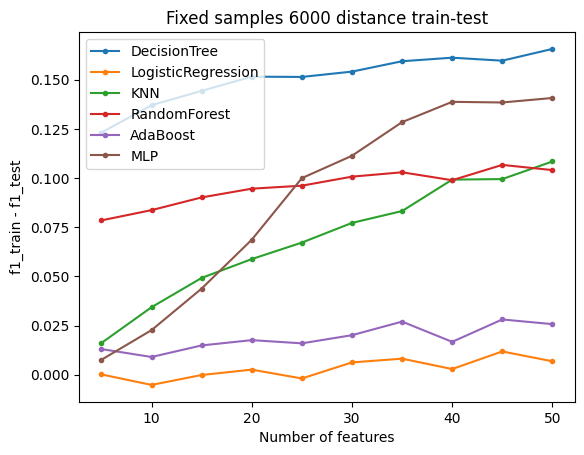

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.418370,0.763255,0.936460,1.170291,1.555340,1.807302,3.084983,2.753127,3.045493,3.706661
LogisticRegression,0.113336,0.131692,0.129344,0.155596,0.143317,0.176453,0.149297,0.146714,0.155509,0.283317
KNN,1.444506,1.952796,4.039848,1.142042,1.214245,2.730624,1.221615,1.552333,1.230891,1.288365
RandomForest,8.969494,13.517677,14.399785,18.656224,22.299200,23.254227,24.133199,27.880878,28.974712,33.280064
AdaBoost,4.085445,4.698779,6.254509,7.929378,10.543447,12.431486,13.711582,15.181015,17.258227,19.541923
MLP,60.035741,62.102703,63.481644,64.875817,69.377974,62.210925,65.699091,64.489748,68.542927,69.397326


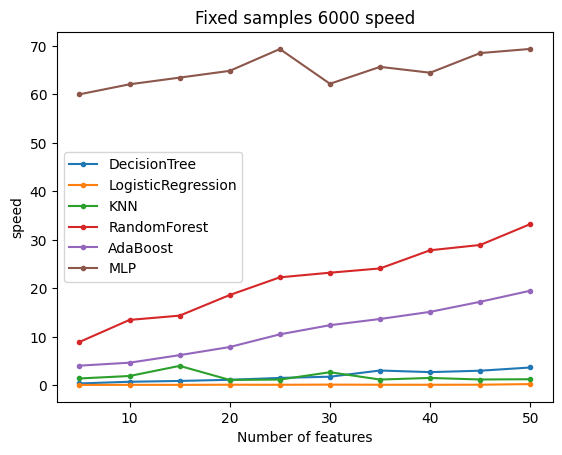

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.939758,0.937617,0.919997,0.927560,0.922853,0.916315,0.916357,0.920950,0.917487,0.919699
LogisticRegression,0.896944,0.892197,0.888493,0.892192,0.890818,0.886773,0.890711,0.892315,0.888970,0.891476
KNN,0.974107,0.929697,0.893870,0.869533,0.851979,0.828392,0.824413,0.805030,0.792107,0.780520
RandomForest,0.968691,0.960239,0.950709,0.951428,0.949402,0.941066,0.940412,0.942016,0.934634,0.941007
AdaBoost,0.922727,0.918011,0.911422,0.915411,0.915048,0.908691,0.906169,0.910880,0.907848,0.917022
MLP,0.978988,0.975119,0.961786,0.956430,0.936071,0.929706,0.917971,0.926429,0.920119,0.919522


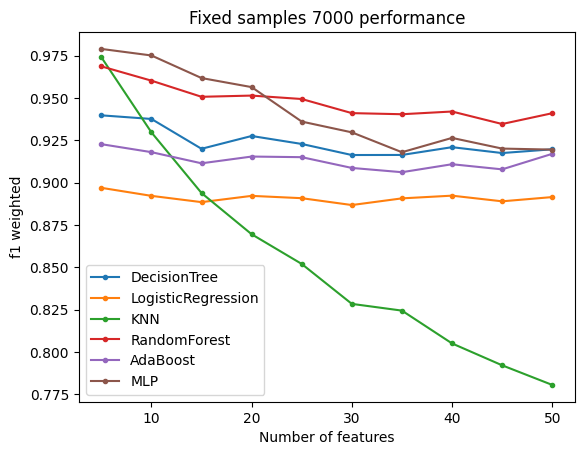

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.060418,0.066188,0.076427,0.073273,0.075899,0.081314,0.086016,0.079109,0.081252,0.079463
LogisticRegression,-0.001889,0.002118,0.006166,-0.003557,0.005015,0.000027,0.007835,0.002173,0.008028,0.005019
KNN,0.006283,0.020773,0.044932,0.048517,0.058896,0.060598,0.064373,0.071712,0.089633,0.082773
RandomForest,0.032925,0.037058,0.047598,0.045953,0.048635,0.053571,0.062215,0.060480,0.062336,0.059531
AdaBoost,0.007571,0.012031,0.013695,0.007133,0.015010,0.011570,0.019480,0.018237,0.017506,0.015920
MLP,0.002985,0.010510,0.027253,0.040813,0.059569,0.067988,0.082326,0.074107,0.082204,0.081133


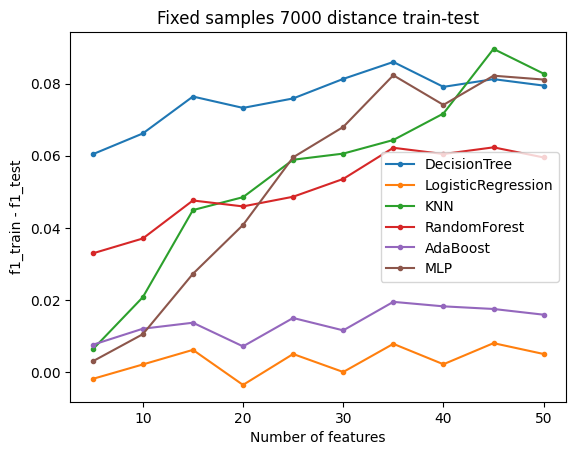

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.470475,0.761796,1.206672,1.249239,1.600277,2.073541,3.126887,2.842946,3.542120,3.592880
LogisticRegression,0.142514,0.178903,0.164698,0.188361,0.207156,0.392171,0.433367,0.389247,0.385303,0.433758
KNN,1.190519,2.319242,3.941819,1.385222,1.509968,1.418452,1.461146,1.529210,1.553085,1.579121
RandomForest,10.175274,14.020283,16.156162,19.838332,24.799439,26.374484,26.780708,31.748268,32.413769,36.671648
AdaBoost,3.574642,6.394354,8.265249,9.933897,11.817501,13.771925,15.986570,17.263105,19.617300,21.236759
MLP,64.074422,68.607183,70.638202,71.483796,74.429445,76.459710,80.466754,76.431964,72.423080,66.046877


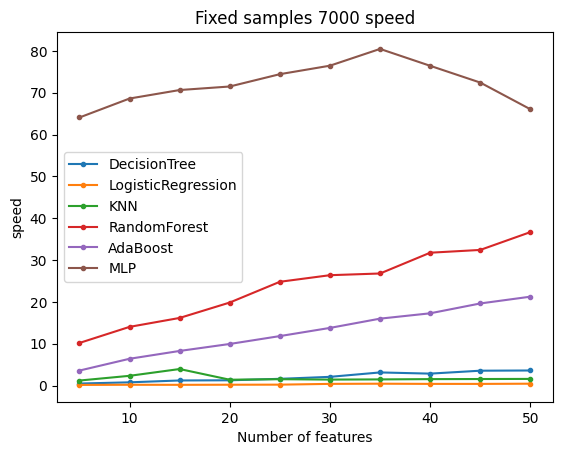

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.933543,0.927498,0.920621,0.914636,0.912655,0.912656,0.915987,0.907601,0.907499,0.911246
LogisticRegression,0.855665,0.853342,0.850632,0.852708,0.849789,0.853333,0.859979,0.852910,0.851872,0.847868
KNN,0.962126,0.911725,0.867289,0.847002,0.821197,0.812329,0.798740,0.790146,0.775116,0.770251
RandomForest,0.960726,0.956300,0.945574,0.942915,0.938328,0.932339,0.927389,0.923224,0.920305,0.916661
AdaBoost,0.877650,0.875200,0.869316,0.872859,0.871250,0.874741,0.875920,0.869944,0.870780,0.867240
MLP,0.978331,0.971978,0.963593,0.953330,0.929154,0.898435,0.895874,0.870241,0.866610,0.863950


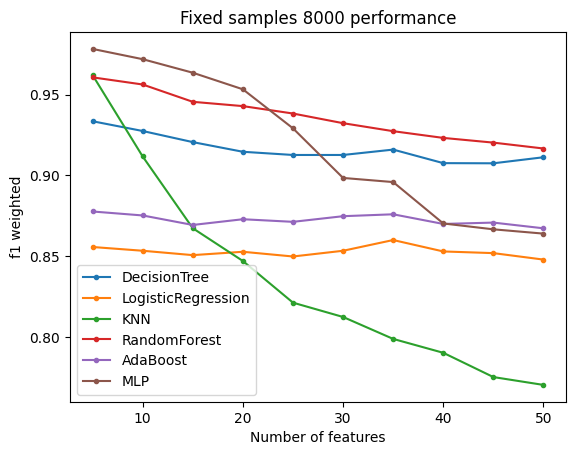

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.064844,0.068652,0.076242,0.084896,0.083960,0.087348,0.086614,0.085689,0.090411,0.089482
LogisticRegression,0.000157,0.002566,0.000247,0.003660,0.004049,-0.002153,0.002408,0.003169,0.005446,0.004630
KNN,0.010674,0.032712,0.048348,0.064564,0.068671,0.070441,0.077977,0.084992,0.093854,0.090231
RandomForest,0.036644,0.042454,0.052026,0.055938,0.061714,0.065866,0.078646,0.075107,0.080520,0.082652
AdaBoost,0.010206,0.010824,0.015630,0.017359,0.019432,0.011441,0.017093,0.009568,0.013152,0.016973
MLP,0.002357,0.010846,0.024602,0.043293,0.071651,0.099073,0.105615,0.123747,0.135164,0.134734


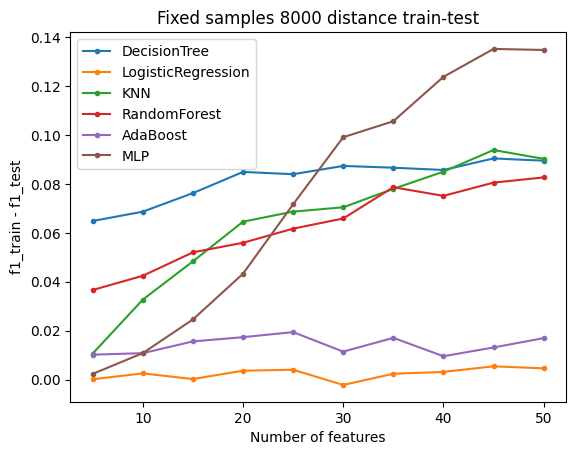

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.379515,0.668158,1.024387,1.845580,1.822714,2.345907,2.610534,3.080967,3.376952,3.785276
LogisticRegression,0.142274,0.145169,0.187387,0.168003,0.162639,0.201869,0.178335,0.181518,0.354528,0.473984
KNN,1.839997,2.683678,4.978116,1.726144,1.764388,1.772991,2.793587,1.812417,1.774601,1.761608
RandomForest,11.788388,16.541266,18.111728,23.531931,29.527457,31.870947,31.485924,38.045985,39.043125,43.329154
AdaBoost,3.851851,6.095644,8.123010,11.061017,13.194298,15.799072,17.684475,20.248912,22.584387,24.570314
MLP,73.613641,74.791680,76.389397,80.390902,84.653846,85.157562,86.325832,87.287990,91.314212,92.387898


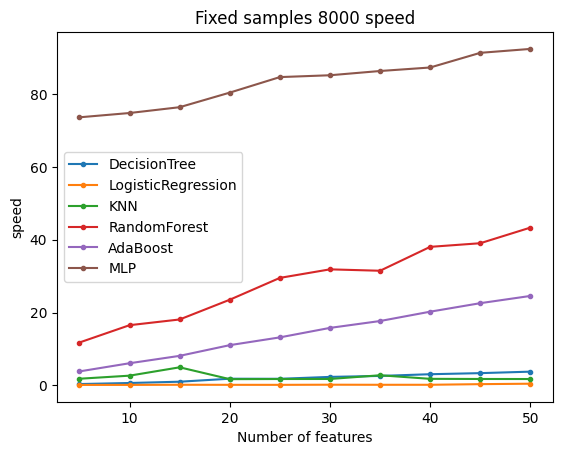

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.939350,0.926575,0.919905,0.918058,0.919488,0.916850,0.913979,0.911476,0.912500,0.914904
LogisticRegression,0.907222,0.901342,0.903286,0.908517,0.904815,0.905318,0.902865,0.903978,0.898983,0.903003
KNN,0.971153,0.926446,0.898106,0.870037,0.846330,0.831427,0.813372,0.795839,0.788767,0.775895
RandomForest,0.964255,0.951286,0.947583,0.945860,0.944651,0.938028,0.931300,0.935203,0.928444,0.932226
AdaBoost,0.912120,0.904804,0.901101,0.905967,0.901794,0.902719,0.901006,0.899208,0.895740,0.897714
MLP,0.978100,0.966290,0.957821,0.950686,0.930220,0.919903,0.902035,0.895368,0.889213,0.888272


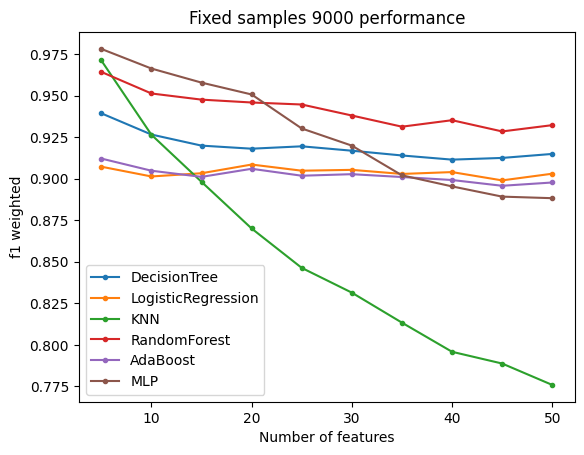

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.066342,0.075139,0.083148,0.078289,0.087175,0.082968,0.089910,0.091253,0.089861,0.089677
LogisticRegression,-0.001663,0.002020,0.002867,0.002759,0.007536,0.000526,0.000978,0.004068,0.005997,0.004748
KNN,0.008569,0.024394,0.042316,0.050336,0.061430,0.069331,0.080724,0.083663,0.085191,0.093261
RandomForest,0.038287,0.045652,0.053257,0.051454,0.060338,0.061042,0.065680,0.063680,0.069160,0.071146
AdaBoost,0.005498,0.011371,0.011669,0.008464,0.014204,0.009032,0.010135,0.009764,0.010463,0.012892
MLP,0.004150,0.008626,0.024696,0.042554,0.062697,0.077506,0.096649,0.105260,0.108470,0.109445


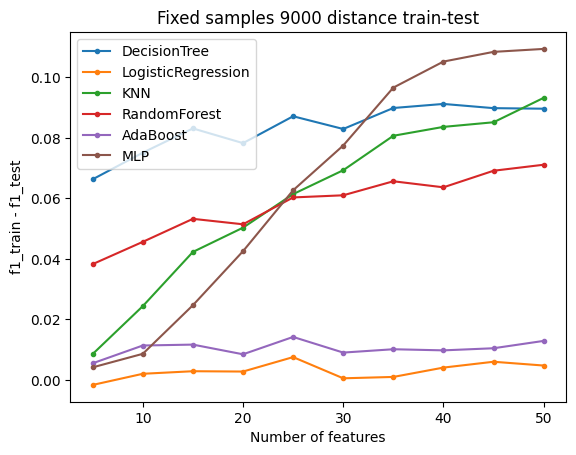

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.477453,1.298362,1.651402,1.890066,2.743878,3.462555,3.920766,4.507421,5.833857,5.484212
LogisticRegression,0.163167,0.178335,0.204664,0.181521,0.191207,0.199142,0.201357,0.228325,0.225646,0.237654
KNN,1.434892,3.145954,5.759904,1.948982,2.795703,2.203554,2.199652,2.200724,3.462976,2.185989
RandomForest,13.455519,19.461020,21.655751,27.513254,35.250219,36.006663,37.019704,44.009540,46.060960,51.640951
AdaBoost,4.293658,6.632052,9.565887,12.289484,14.602084,17.018048,19.780422,22.833352,24.695737,27.675704
MLP,83.007802,86.724228,88.296867,88.883361,93.077019,94.792660,96.554667,98.582850,101.846814,100.360439


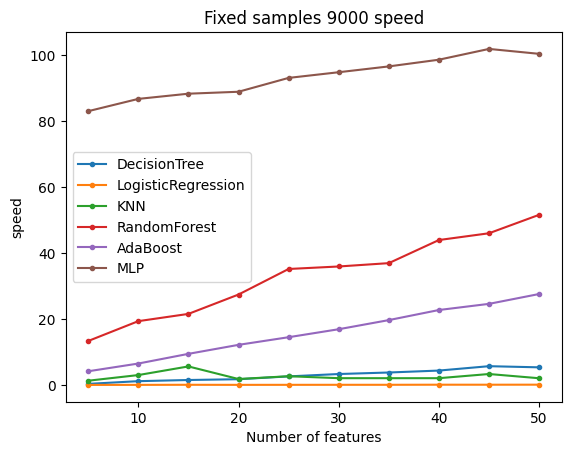

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.920084,0.911661,0.907789,0.906123,0.900332,0.899037,0.895211,0.898252,0.901707,0.897500
LogisticRegression,0.892315,0.890732,0.892372,0.890755,0.889144,0.890152,0.891563,0.892073,0.890617,0.891567
KNN,0.958208,0.923821,0.900714,0.878659,0.858660,0.848170,0.827327,0.822140,0.815970,0.800887
RandomForest,0.951704,0.944740,0.938786,0.936018,0.932175,0.926506,0.923388,0.926843,0.923256,0.922375
AdaBoost,0.898320,0.897156,0.895671,0.892060,0.890947,0.893782,0.891486,0.892826,0.889369,0.890030
MLP,0.967626,0.960499,0.947583,0.939036,0.923538,0.914416,0.902791,0.906081,0.905743,0.895334


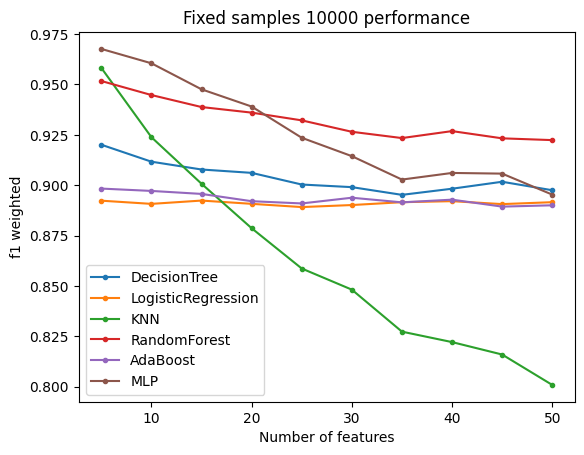

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.078588,0.089167,0.091128,0.092001,0.096751,0.097542,0.101044,0.097041,0.101167,0.099337
LogisticRegression,-0.005559,0.001037,-0.002988,0.000632,-0.000704,0.004232,0.005617,0.001057,0.003554,0.001004
KNN,0.010479,0.028835,0.032791,0.051039,0.058251,0.065517,0.077174,0.073265,0.080877,0.086969
RandomForest,0.045965,0.055893,0.058509,0.064866,0.065068,0.072623,0.076652,0.073824,0.077190,0.077216
AdaBoost,0.001984,0.005427,0.006422,0.010071,0.009663,0.012280,0.015048,0.011335,0.016355,0.009351
MLP,0.003274,0.015728,0.032475,0.048881,0.068987,0.087644,0.095642,0.094500,0.092796,0.104127


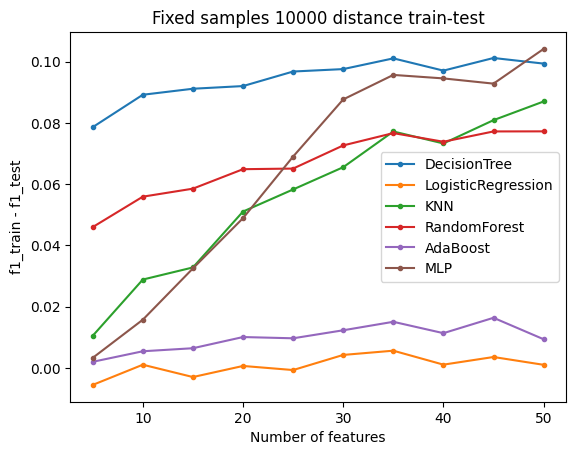

,5,10,15,20,25,30,35,40,45,50
DecisionTree,0.702719,1.224507,1.495348,2.039514,2.761484,3.265751,3.921438,4.290216,5.702388,6.116542
LogisticRegression,0.159056,0.185180,0.196668,0.216262,0.209259,0.241488,0.234932,0.261028,0.239234,0.263010
KNN,1.761686,3.579431,7.941917,2.543314,3.325097,2.260769,2.349106,2.615145,2.364744,2.947536
RandomForest,15.783167,21.586359,23.554548,32.109445,38.969464,40.276009,41.459998,48.604001,50.584970,58.158551
AdaBoost,4.592263,7.272606,10.859750,13.713621,16.941913,18.764462,22.108183,24.568315,27.716985,30.303276
MLP,91.422241,95.655123,98.869638,100.606232,101.246224,107.119480,106.743314,109.086719,112.500926,108.893843


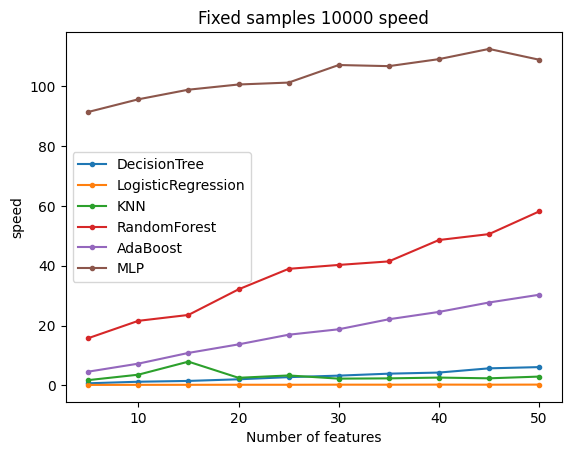

In [ ]:
for j in range(len(datasets_different_features)):
    results_for_each_algorithm = []

    # For each algorithm, we compute the results on all the datasets
    for algorithm in CLASSIFICATION_ALGORITHMS:

        results_single_algorithm = []

        # Iteration over the different number of features
        for i,dataset_i in enumerate(datasets_different_features[j]):

            X = dataset_i[0]
            y = dataset_i[1]

            results_analysis = classification(X, y, algorithm, SEED)
            results_single_algorithm.append(results_analysis)

        results_for_each_algorithm.append(results_single_algorithm)

    # Generating the plots
    plot_type = ["performance","distance train-test","speed"]
    for plt_t in plot_type:
        plot(x_axis_values = range(min_num_of_features, max_num_of_features + 1, min_num_of_features),
            x_label = "Number of features",
            results = results_for_each_algorithm,
            title = "Fixed samples "+str((j+1)*min_num_of_samples)+" "+ plt_t,
            algorithms = CLASSIFICATION_ALGORITHMS,
            plot_type = plt_t)


#### Different number of samples

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.878767,0.915217,0.879183,0.909268,0.918241,0.880425,0.940294,0.932604,0.938703,0.919834
LogisticRegression,0.858947,0.912284,0.895985,0.893840,0.851237,0.842619,0.896944,0.855665,0.907222,0.892315
KNN,0.944547,0.946665,0.942502,0.954372,0.957500,0.932641,0.974107,0.962126,0.971153,0.958208
RandomForest,0.909877,0.938127,0.922905,0.948124,0.953914,0.924448,0.969048,0.961299,0.964256,0.950705
AdaBoost,0.859821,0.919396,0.867085,0.894677,0.846120,0.860196,0.922727,0.877650,0.912120,0.898320
MLP,0.943319,0.953124,0.950274,0.958643,0.963249,0.945488,0.978988,0.978123,0.977775,0.967959


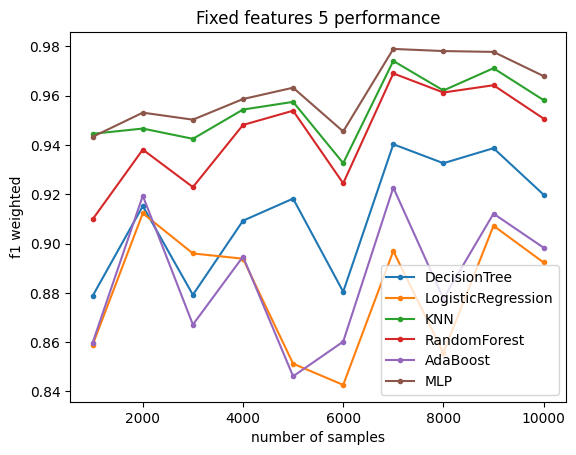

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.120851,0.090459,0.127357,0.090523,0.081333,0.124453,0.059229,0.064896,0.067314,0.078252
LogisticRegression,0.005209,0.002140,0.002319,0.005543,-0.003561,0.000156,-0.001889,0.000157,-0.001663,-0.005559
KNN,0.021661,0.023313,0.023884,0.015084,0.009331,0.016152,0.006283,0.010674,0.008569,0.010479
RandomForest,0.092618,0.064191,0.083566,0.054068,0.046001,0.077291,0.032738,0.037031,0.038220,0.045465
AdaBoost,0.052940,0.030280,0.024055,0.021817,0.015120,0.013041,0.007571,0.010206,0.005498,0.001984
MLP,0.017556,0.014868,0.010827,0.010898,0.003835,0.006219,0.002882,0.002380,0.004389,0.003215


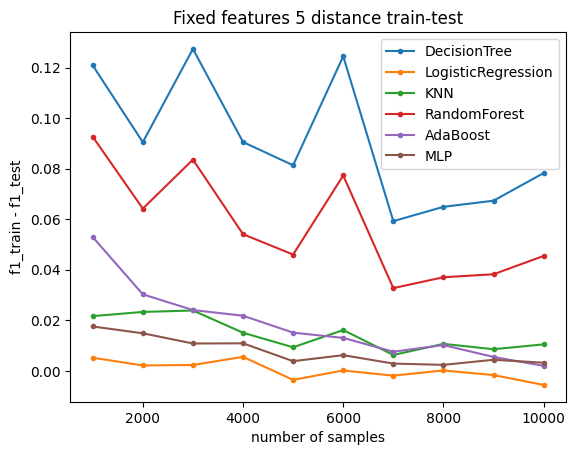

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.047017,0.066275,0.106421,0.137600,0.191728,0.251898,0.273494,0.322877,0.383392,0.443117
LogisticRegression,0.069901,0.075306,0.144941,0.171314,0.224659,0.168956,0.221405,0.197315,0.246850,0.273585
KNN,0.268410,0.257002,0.415217,0.606418,0.651287,0.840326,1.355177,1.123380,1.308456,1.531278
RandomForest,1.892410,3.743557,3.787787,5.666109,6.738103,8.166586,8.976910,10.182190,10.699688,13.249590
AdaBoost,0.965820,1.260378,1.518630,2.520256,2.204716,2.499899,3.379446,3.114058,4.457648,3.814712
MLP,7.844519,16.465662,23.998268,32.672254,41.230515,46.755771,54.828778,61.930440,71.943301,76.908712


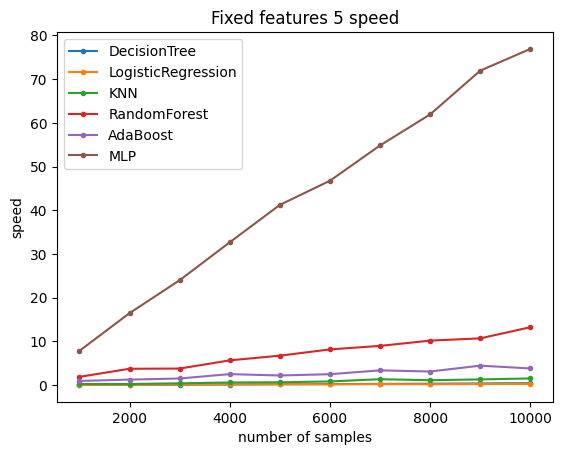

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.836518,0.892648,0.866951,0.903007,0.897840,0.864722,0.937319,0.927968,0.927222,0.910871
LogisticRegression,0.850367,0.907271,0.889477,0.896352,0.848594,0.848525,0.892197,0.853342,0.901342,0.890732
KNN,0.875697,0.893732,0.883723,0.906072,0.916831,0.891866,0.929697,0.911725,0.926446,0.923821
RandomForest,0.895248,0.929570,0.916784,0.943020,0.942424,0.915550,0.960715,0.956196,0.951935,0.945157
AdaBoost,0.857379,0.914361,0.869721,0.891670,0.847834,0.858644,0.918011,0.875200,0.904804,0.897156
MLP,0.928758,0.942690,0.926651,0.947289,0.950088,0.935066,0.976131,0.972290,0.966799,0.959790


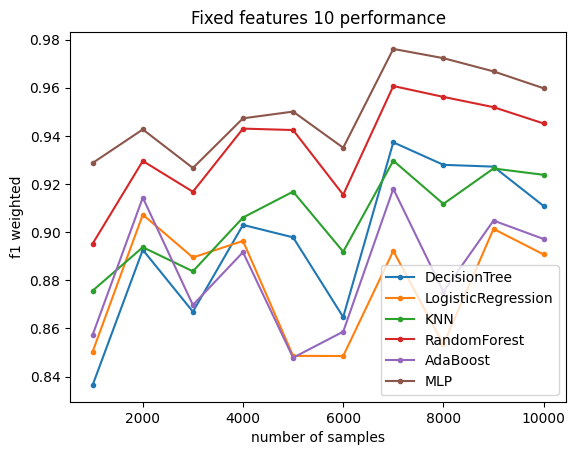

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.147131,0.099632,0.134163,0.106874,0.102172,0.134533,0.064641,0.068860,0.074676,0.088627
LogisticRegression,0.021013,-0.000377,0.001790,0.003768,0.007402,-0.005178,0.002118,0.002566,0.002020,0.001037
KNN,0.048130,0.038508,0.050301,0.038089,0.034308,0.034329,0.020773,0.032712,0.024394,0.028835
RandomForest,0.105615,0.063762,0.086389,0.057392,0.060170,0.082985,0.037202,0.041599,0.045382,0.055458
AdaBoost,0.076464,0.026410,0.030837,0.025705,0.025732,0.009026,0.012031,0.010824,0.011371,0.005427
MLP,0.046682,0.024821,0.028799,0.018868,0.023941,0.021541,0.009991,0.010056,0.009525,0.016557


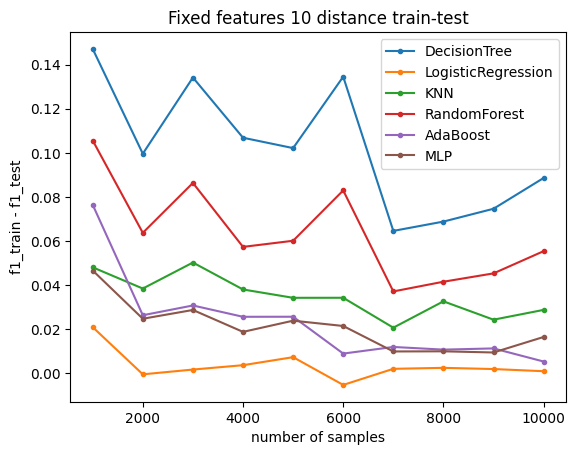

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.098210,0.161665,0.268208,0.329073,0.487340,0.515829,0.494949,0.624913,0.864206,0.872394
LogisticRegression,0.051564,0.071095,0.073915,0.077766,0.084875,0.099321,0.113220,0.116238,0.126291,0.133785
KNN,0.207855,0.372796,0.982237,0.911028,1.190740,2.542499,2.064798,2.396849,3.896597,4.327921
RandomForest,3.356735,3.682128,6.285089,7.378282,9.541065,11.704511,12.041587,14.279069,18.230092,19.802153
AdaBoost,1.820827,1.870372,2.403022,3.541863,3.454005,4.927922,4.666069,5.784563,6.959826,7.462086
MLP,10.550017,17.072494,27.320979,34.852104,42.601915,57.320526,63.818430,73.509051,80.925409,90.652850


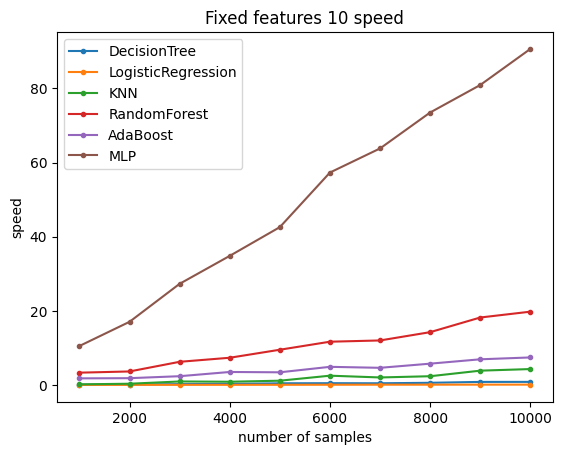

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.846232,0.877710,0.856102,0.889899,0.895663,0.855753,0.922201,0.920359,0.918608,0.907374
LogisticRegression,0.860313,0.897086,0.895289,0.896628,0.846742,0.842051,0.888493,0.850632,0.903286,0.892372
KNN,0.854878,0.848904,0.843843,0.862457,0.889207,0.863948,0.893870,0.867289,0.898106,0.900714
RandomForest,0.887773,0.920427,0.909965,0.933643,0.934249,0.910895,0.949459,0.947449,0.947446,0.938410
AdaBoost,0.861666,0.905447,0.859822,0.884062,0.838840,0.858420,0.911422,0.869316,0.901101,0.895671
MLP,0.901151,0.923742,0.905398,0.934374,0.943084,0.925410,0.961964,0.966355,0.959578,0.947085


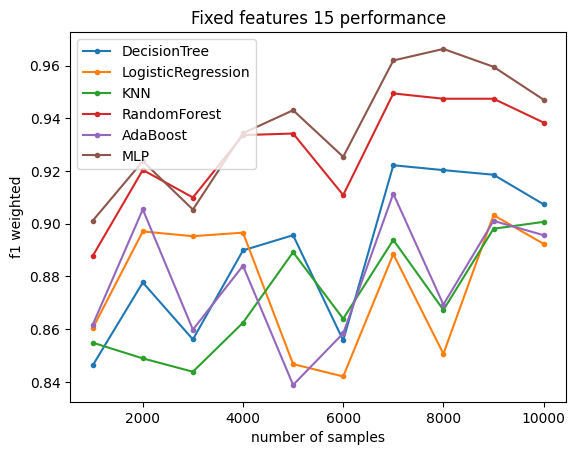

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.142881,0.113961,0.150187,0.106152,0.103504,0.148277,0.077083,0.076138,0.082546,0.091465
LogisticRegression,0.005121,0.015044,0.006365,0.006489,0.004430,-0.000131,0.006166,0.000247,0.002867,-0.002988
KNN,0.053917,0.056695,0.062770,0.049956,0.050554,0.049221,0.044932,0.048348,0.042316,0.032791
RandomForest,0.112210,0.078105,0.091605,0.065419,0.065583,0.091248,0.047504,0.052339,0.052936,0.058632
AdaBoost,0.074846,0.043377,0.035027,0.027418,0.023881,0.014900,0.013695,0.015630,0.011669,0.006422
MLP,0.078769,0.063707,0.063361,0.044508,0.040858,0.044433,0.026564,0.024381,0.023692,0.030296


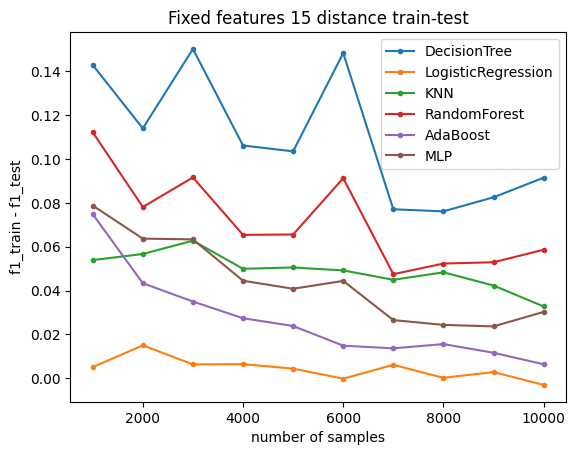

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.114207,0.197451,0.334961,0.409911,0.582034,0.879801,0.913053,0.957684,1.972134,1.554462
LogisticRegression,0.063257,0.071684,0.081008,0.091826,0.093379,0.113858,0.137026,0.121141,0.153809,0.159054
KNN,0.238408,0.482018,0.965050,1.961670,1.900458,3.143609,3.653809,4.425224,6.829164,7.586655
RandomForest,2.417000,3.848710,6.401751,7.659393,10.124650,12.492447,13.487240,15.604522,18.815317,20.226412
AdaBoost,1.448665,2.629867,2.878959,4.211361,4.344653,5.960171,6.901272,7.436029,8.538574,9.396719
MLP,9.871405,18.131607,24.177998,32.321079,39.771536,49.003608,58.426256,65.461315,74.637613,83.371372


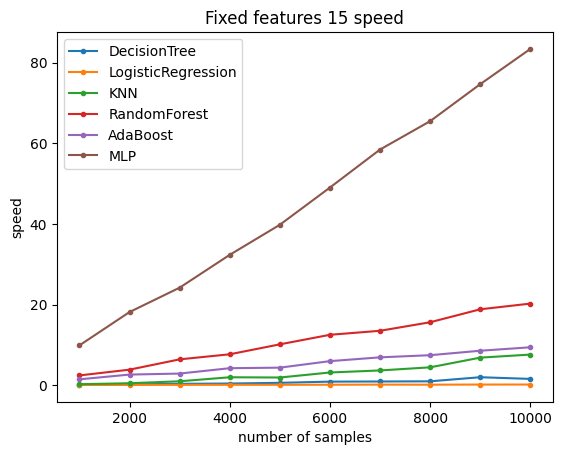

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.814870,0.888704,0.851264,0.885411,0.893068,0.845134,0.928039,0.915470,0.920744,0.904207
LogisticRegression,0.838047,0.900591,0.883398,0.893315,0.848747,0.841160,0.892192,0.852708,0.908517,0.890755
KNN,0.812240,0.838323,0.817821,0.819386,0.854342,0.847006,0.869533,0.847002,0.870037,0.878659
RandomForest,0.869535,0.922069,0.901776,0.927396,0.929752,0.909448,0.952023,0.942133,0.946600,0.936226
AdaBoost,0.842338,0.904564,0.848452,0.883533,0.841588,0.855824,0.915411,0.872859,0.905967,0.892060
MLP,0.858195,0.902064,0.893463,0.920728,0.929253,0.910415,0.955120,0.952187,0.948832,0.938289


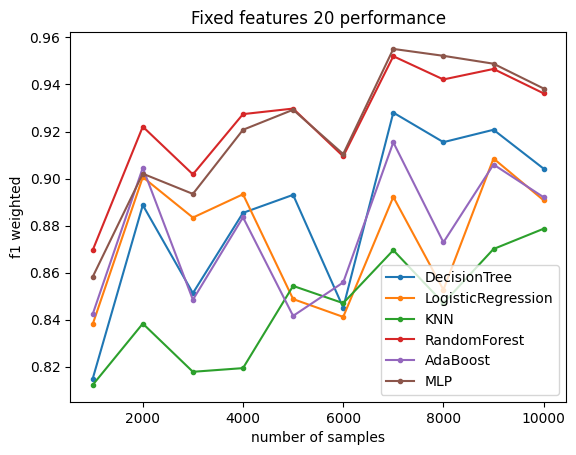

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.173794,0.115622,0.148779,0.115108,0.108427,0.151608,0.072561,0.086251,0.078196,0.094165
LogisticRegression,0.021141,0.001049,0.005038,-0.004100,0.005963,0.002589,-0.003557,0.003660,0.002759,0.000632
KNN,0.077085,0.075747,0.075827,0.070566,0.055544,0.058792,0.048517,0.064564,0.050336,0.051039
RandomForest,0.115506,0.077496,0.094598,0.066876,0.066914,0.094864,0.046073,0.056825,0.051127,0.064929
AdaBoost,0.093355,0.045811,0.037177,0.023253,0.026365,0.017588,0.007133,0.017359,0.008464,0.010071
MLP,0.121601,0.085936,0.093720,0.067071,0.059380,0.069633,0.041705,0.042543,0.040164,0.049165


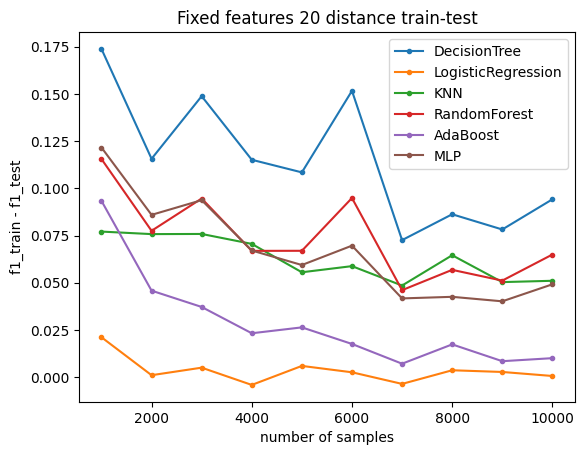

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.199646,0.321562,0.405849,0.504657,0.755328,1.024300,1.116647,1.179878,1.940022,1.990104
LogisticRegression,0.053427,0.071467,0.075108,0.099361,0.106600,0.096694,0.124587,0.121307,0.151138,0.158774
KNN,0.261302,0.284199,0.424668,0.603315,1.291008,0.985309,1.218072,1.506005,1.666682,1.857988
RandomForest,3.138337,4.466821,7.827269,10.042516,12.114612,15.743366,17.775550,19.769613,23.365548,27.097254
AdaBoost,1.728290,2.780198,3.452398,5.320593,5.772371,6.401498,7.428755,9.165359,10.512051,10.955583
MLP,9.956082,16.405577,26.036506,34.817132,40.420732,49.172776,59.448762,67.971986,75.771893,84.777855


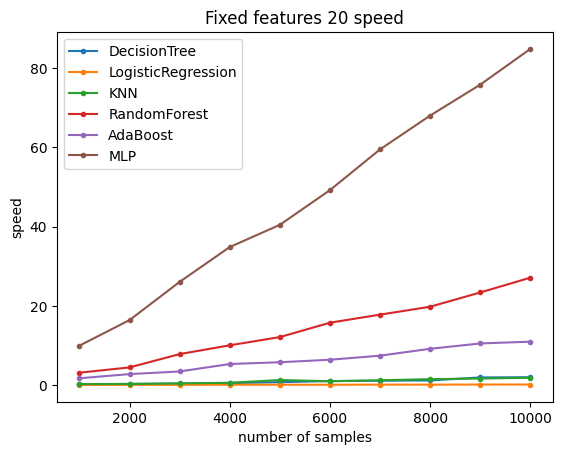

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.835038,0.876064,0.841540,0.883854,0.885754,0.844863,0.921362,0.914317,0.921020,0.900919
LogisticRegression,0.846797,0.895194,0.883157,0.891730,0.845995,0.838102,0.890818,0.849789,0.904815,0.889144
KNN,0.799586,0.798059,0.790519,0.801496,0.834271,0.818820,0.851979,0.821197,0.846330,0.858660
RandomForest,0.879630,0.919170,0.900380,0.924686,0.927004,0.902227,0.949817,0.937913,0.945160,0.932428
AdaBoost,0.853512,0.878561,0.848071,0.879351,0.838575,0.854486,0.915048,0.871250,0.901794,0.890947
MLP,0.861305,0.883523,0.877917,0.917383,0.915671,0.889859,0.936428,0.926503,0.934339,0.924583


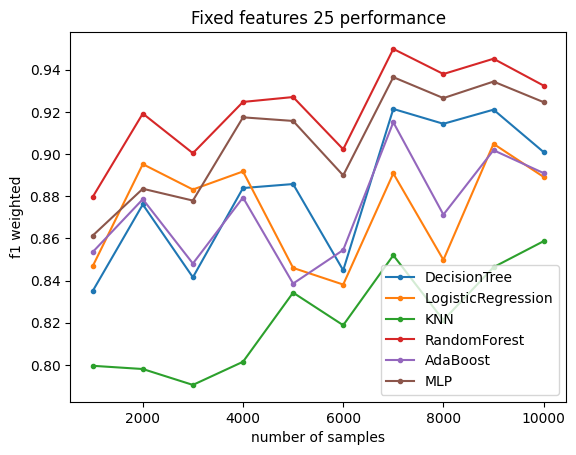

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.157200,0.130201,0.146921,0.117944,0.113252,0.153683,0.075540,0.083287,0.085601,0.096459
LogisticRegression,0.034856,0.009205,0.000017,0.003234,0.010648,-0.001902,0.005015,0.004049,0.007536,-0.000704
KNN,0.078880,0.096438,0.077675,0.087738,0.068796,0.067183,0.058896,0.068671,0.061430,0.058251
RandomForest,0.118809,0.084350,0.094186,0.071151,0.072918,0.096179,0.048875,0.062027,0.059737,0.065867
AdaBoost,0.102909,0.050128,0.033548,0.033072,0.030113,0.015962,0.015010,0.019432,0.014204,0.009663
MLP,0.143998,0.121314,0.111423,0.080992,0.081067,0.095779,0.061736,0.074804,0.063106,0.068353


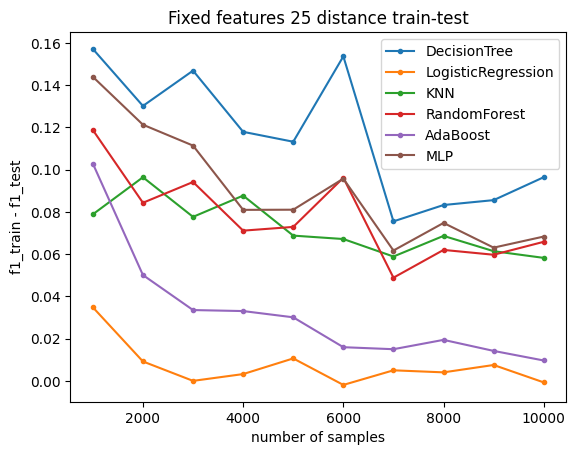

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.219929,0.448040,0.709496,0.628716,0.990223,1.310530,1.386818,1.584121,2.858103,2.302852
LogisticRegression,0.056481,0.069198,0.100793,0.088536,0.088367,0.101660,0.131570,0.120364,0.143044,0.159841
KNN,0.261359,1.004310,0.477058,0.632695,0.826665,1.033986,1.240644,1.411767,2.191331,1.919242
RandomForest,2.955203,6.579799,9.196214,11.805903,14.939470,19.117760,21.495585,25.560597,30.155423,32.919222
AdaBoost,1.736001,3.805850,4.061558,5.975776,7.511037,8.804152,10.026314,10.421830,12.554265,13.916834
MLP,7.574942,17.045403,27.230659,35.645602,42.457569,50.500021,61.276395,67.893722,80.509605,87.629274


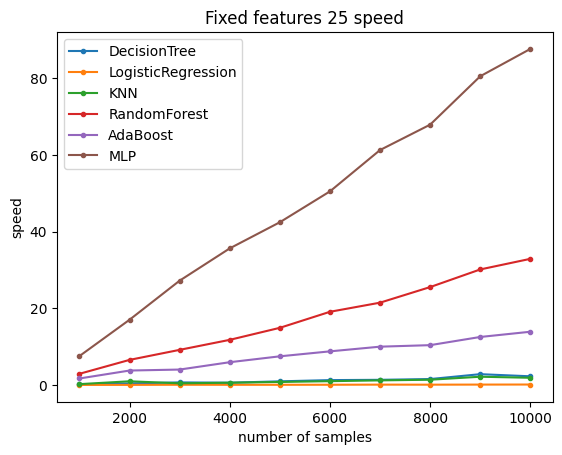

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.822514,0.877302,0.848208,0.887160,0.890174,0.851957,0.915777,0.911978,0.917220,0.901287
LogisticRegression,0.840464,0.908955,0.888534,0.892387,0.847438,0.835617,0.886773,0.853333,0.905318,0.890152
KNN,0.770033,0.806066,0.776049,0.788546,0.810356,0.796968,0.828392,0.812329,0.831427,0.848170
RandomForest,0.874844,0.916059,0.897727,0.925210,0.921342,0.898484,0.939996,0.931713,0.938955,0.926841
AdaBoost,0.847506,0.907726,0.851930,0.885198,0.840438,0.855200,0.908691,0.874741,0.902719,0.893782
MLP,0.853295,0.883754,0.875427,0.907080,0.914745,0.888069,0.929288,0.900354,0.921292,0.915165


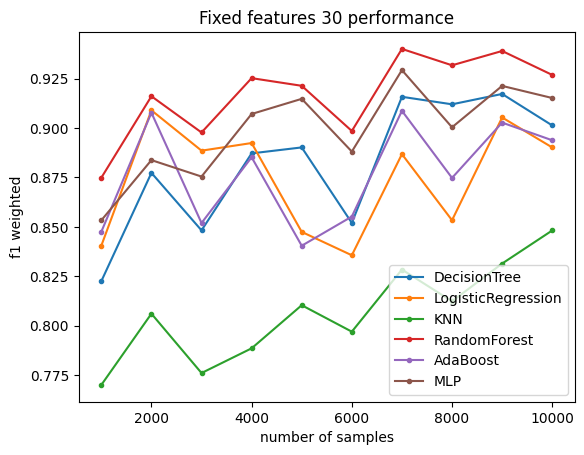

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.175297,0.119593,0.152813,0.115939,0.113076,0.154865,0.081970,0.086204,0.081027,0.096421
LogisticRegression,0.018254,0.009708,0.006013,0.008985,0.004543,0.006264,0.000027,-0.002153,0.000526,0.004232
KNN,0.105787,0.082557,0.087008,0.085474,0.086694,0.077181,0.060598,0.070441,0.069331,0.065517
RandomForest,0.127923,0.090019,0.104073,0.078131,0.078828,0.098608,0.054167,0.066619,0.060161,0.072662
AdaBoost,0.102896,0.043743,0.044739,0.037203,0.026702,0.020105,0.011570,0.011441,0.009032,0.012280
MLP,0.153101,0.118961,0.121293,0.095211,0.088389,0.114021,0.070280,0.098309,0.079761,0.085312


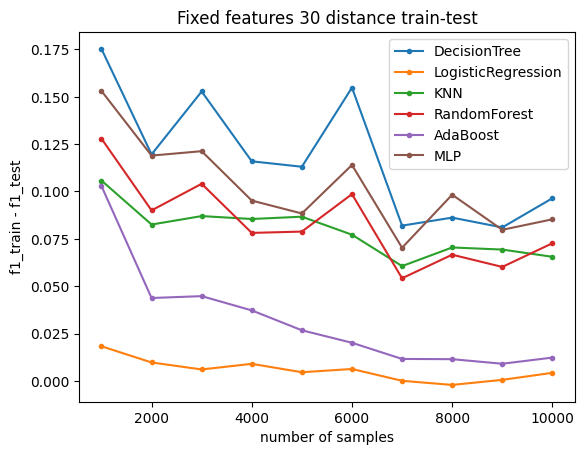

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.186342,0.381078,0.620496,0.772703,1.074138,1.904651,1.974378,2.012859,2.716477,3.265782
LogisticRegression,0.054447,0.078341,0.086555,0.098702,0.091364,0.102298,0.143056,0.130574,0.145995,0.169262
KNN,0.235494,0.303667,0.477934,1.485810,0.825445,1.015487,1.998002,1.657030,3.107131,2.201459
RandomForest,3.111085,7.155959,10.028737,13.150814,16.307197,20.841094,22.191942,27.791292,33.883134,38.404955
AdaBoost,2.127226,4.797492,5.175056,6.806031,8.460196,10.975455,12.758042,14.318027,16.228287,18.079579
MLP,11.545198,19.418531,34.354068,46.537080,59.330284,69.617869,79.153490,83.802331,94.292342,104.551392


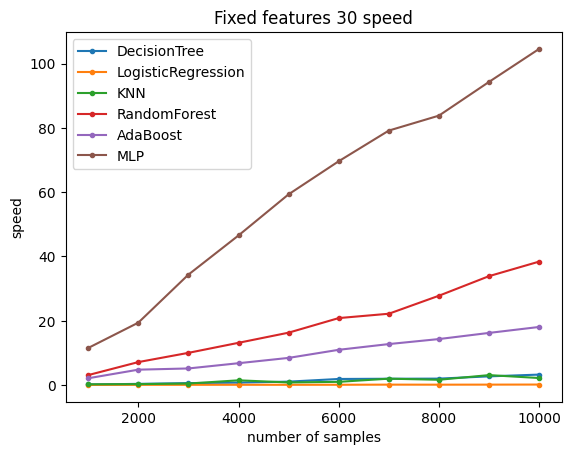

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.825406,0.872653,0.837488,0.883313,0.877242,0.839375,0.917427,0.915881,0.911804,0.896667
LogisticRegression,0.847903,0.886262,0.887288,0.894030,0.840601,0.837217,0.890711,0.859979,0.902865,0.891563
KNN,0.773147,0.796879,0.773105,0.762971,0.791225,0.794090,0.824413,0.798740,0.813372,0.827327
RandomForest,0.871019,0.908526,0.891205,0.910190,0.913253,0.897295,0.940351,0.925925,0.929822,0.923388
AdaBoost,0.844888,0.889159,0.849428,0.886133,0.836687,0.847422,0.906169,0.875920,0.901006,0.891486
MLP,0.843745,0.873728,0.875385,0.900401,0.898747,0.871535,0.918389,0.895925,0.903097,0.903912


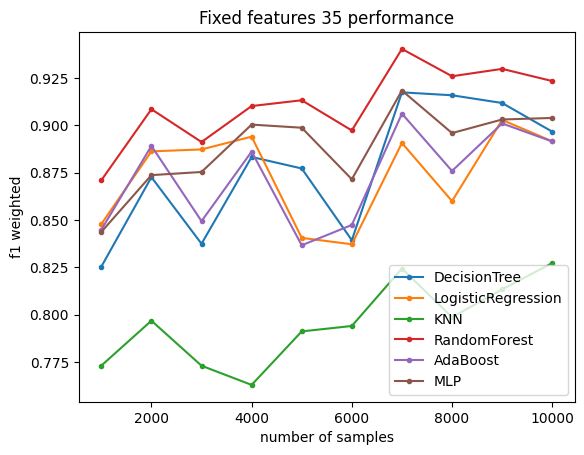

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.173304,0.121283,0.153636,0.120012,0.116340,0.160834,0.084643,0.088231,0.090562,0.102669
LogisticRegression,0.016195,0.012225,0.009707,0.001983,0.001374,0.008169,0.007835,0.002408,0.000978,0.005617
KNN,0.079678,0.085075,0.088613,0.097394,0.077884,0.083211,0.064373,0.077977,0.080724,0.077174
RandomForest,0.119285,0.097937,0.105887,0.082394,0.084505,0.102569,0.060846,0.078384,0.065722,0.077234
AdaBoost,0.088139,0.053819,0.043873,0.032936,0.027714,0.027010,0.019480,0.017093,0.010135,0.015048
MLP,0.139221,0.118945,0.124179,0.097710,0.096084,0.128727,0.084708,0.105473,0.095236,0.094549


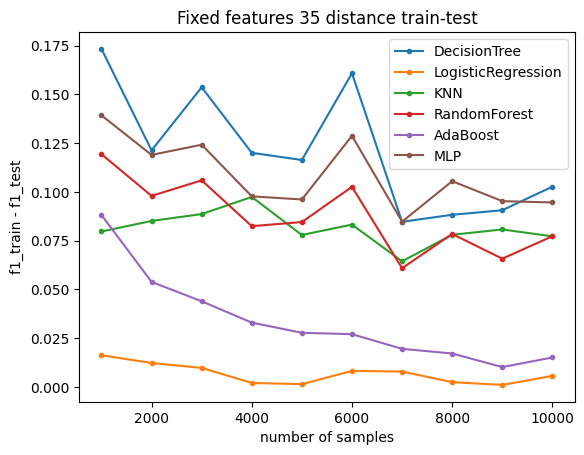

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.304223,0.686533,1.132591,1.040218,1.629791,2.310935,2.891731,2.361148,3.859856,4.244236
LogisticRegression,0.066693,0.089155,0.109168,0.108718,0.112312,0.123787,0.164785,0.187793,0.184134,0.206689
KNN,0.285436,0.339994,1.111520,0.723955,0.939135,1.151270,1.494195,1.811615,2.137364,3.712343
RandomForest,4.073074,6.354911,9.513348,14.195328,18.009217,23.120513,25.463369,29.877187,35.217405,40.347196
AdaBoost,2.360606,4.444005,6.791547,8.650751,10.668098,12.273456,14.646860,16.695033,19.640413,20.920562
MLP,10.274136,19.865298,31.727587,42.791297,53.435232,65.116125,85.179235,96.992266,104.542829,100.161415


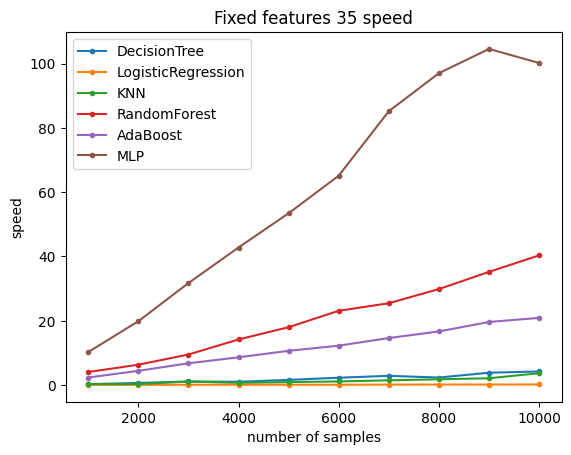

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.815375,0.874593,0.843188,0.879795,0.884086,0.834649,0.920652,0.909426,0.912493,0.899333
LogisticRegression,0.834467,0.886649,0.882739,0.890170,0.846299,0.842473,0.892315,0.852910,0.903978,0.892073
KNN,0.712873,0.772541,0.743549,0.758408,0.781317,0.769714,0.805030,0.790146,0.795839,0.822140
RandomForest,0.861004,0.909193,0.887743,0.914577,0.916666,0.900282,0.941842,0.923327,0.935064,0.926677
AdaBoost,0.835743,0.895387,0.840705,0.880698,0.839405,0.852467,0.910880,0.869944,0.899208,0.892826
MLP,0.815774,0.871877,0.867360,0.901963,0.902333,0.864730,0.924582,0.869032,0.893332,0.903368


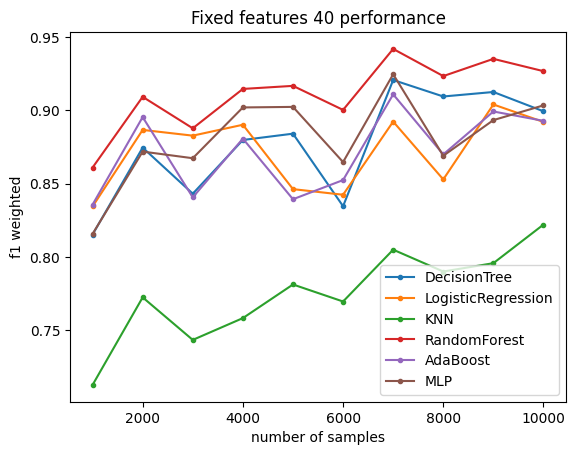

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.188372,0.121661,0.159311,0.119579,0.113417,0.161952,0.078989,0.087918,0.091435,0.097542
LogisticRegression,0.027015,0.017932,0.007853,0.008775,0.002283,0.002897,0.002173,0.003169,0.004068,0.001057
KNN,0.124287,0.092063,0.102756,0.103675,0.086409,0.099188,0.071712,0.084992,0.083663,0.073265
RandomForest,0.138562,0.091438,0.106393,0.080302,0.083832,0.099646,0.059828,0.076930,0.065114,0.075014
AdaBoost,0.124481,0.055178,0.049643,0.028614,0.023258,0.016725,0.018237,0.009568,0.009764,0.011335
MLP,0.171310,0.132891,0.133059,0.096351,0.098663,0.138329,0.074583,0.126433,0.104105,0.093497


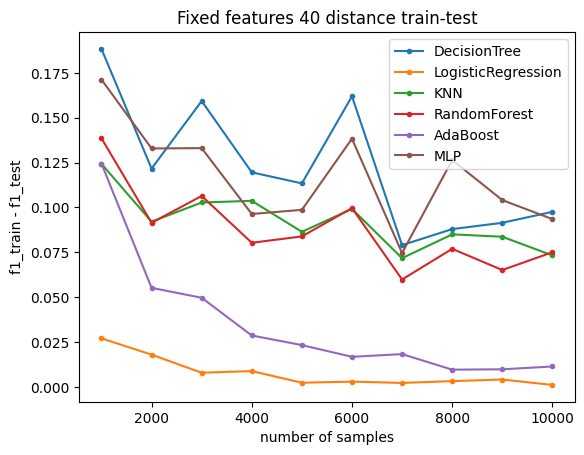

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.306198,0.591712,0.887363,1.119492,2.173137,2.747356,2.706724,3.822859,4.195997,5.117979
LogisticRegression,0.091997,0.089188,0.087967,0.108972,0.113766,0.125479,0.157638,0.153796,0.185110,0.196265
KNN,0.245003,0.331973,0.513954,1.522549,0.943595,1.189746,2.275802,1.722550,2.074167,2.468702
RandomForest,3.647614,7.508326,11.149235,15.669327,20.937376,26.393813,29.079315,35.172735,41.084960,45.853689
AdaBoost,2.501641,5.096899,7.599546,9.635055,11.787188,13.959314,15.505399,17.573056,20.520141,21.928252
MLP,8.541403,19.091541,31.007160,42.182683,50.688061,61.727689,69.048165,81.165151,94.973296,103.812022


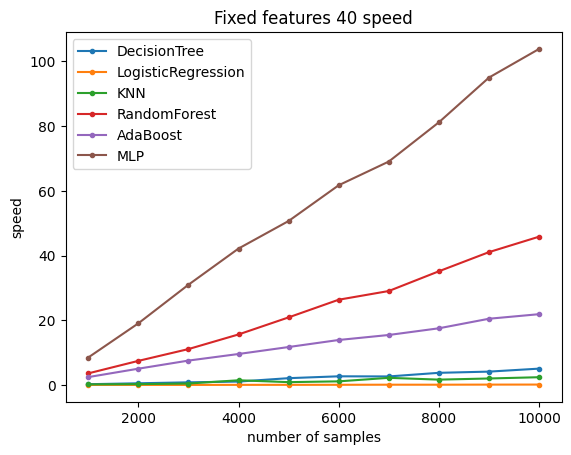

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.798667,0.884827,0.832800,0.876148,0.880913,0.848611,0.916892,0.908598,0.911897,0.900668
LogisticRegression,0.836259,0.892918,0.878484,0.894029,0.845406,0.837278,0.888970,0.851872,0.898983,0.890617
KNN,0.724706,0.771028,0.742672,0.741675,0.760015,0.758081,0.792107,0.775116,0.788767,0.815970
RandomForest,0.852688,0.915863,0.884336,0.916337,0.909157,0.898608,0.936359,0.919109,0.929091,0.920836
AdaBoost,0.833360,0.901692,0.844846,0.879349,0.832499,0.854141,0.907848,0.870780,0.895740,0.889369
MLP,0.822998,0.879386,0.859883,0.897909,0.888739,0.866040,0.919286,0.864325,0.888239,0.905207


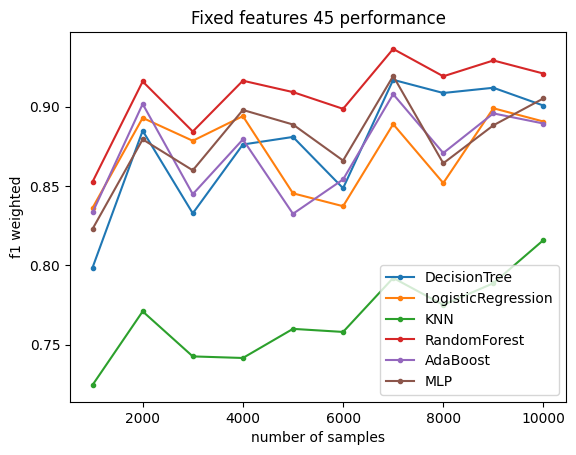

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.197925,0.118550,0.167905,0.117931,0.116005,0.159653,0.082143,0.090150,0.088424,0.100169
LogisticRegression,0.021672,0.013893,0.007894,0.005575,0.006053,0.011838,0.008028,0.005446,0.005997,0.003554
KNN,0.109196,0.102168,0.107889,0.108310,0.095290,0.099461,0.089633,0.093854,0.085191,0.080877
RandomForest,0.130552,0.087495,0.116298,0.085740,0.090766,0.106815,0.061503,0.080938,0.069164,0.077234
AdaBoost,0.113476,0.049722,0.053421,0.030272,0.029993,0.028094,0.017506,0.013152,0.010463,0.016355
MLP,0.163328,0.121894,0.133467,0.095733,0.109748,0.135699,0.082504,0.135870,0.106622,0.093255


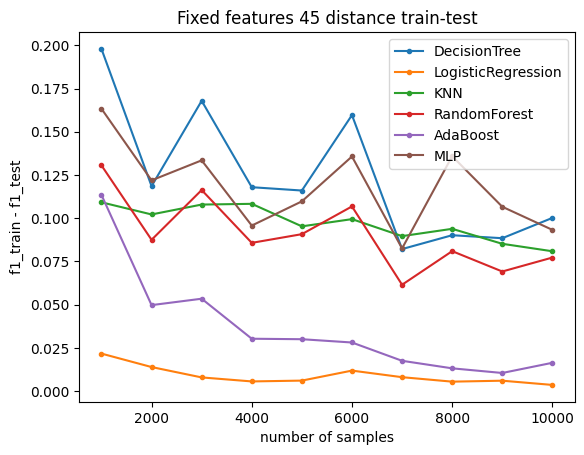

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.321164,0.638468,1.117018,1.411773,2.096598,3.365775,3.126976,4.264385,4.900709,5.345730
LogisticRegression,0.071653,0.124250,0.103851,0.119165,0.121704,0.171012,0.174015,0.187802,0.228188,0.517323
KNN,0.757272,0.614198,0.564747,0.725577,1.034186,2.579098,1.476229,3.205199,2.227784,2.421247
RandomForest,4.621020,8.412760,12.657749,16.565544,21.683194,27.488794,31.581461,37.681230,42.957453,49.672078
AdaBoost,3.247698,5.038748,8.347616,10.437474,12.974642,15.729079,18.452470,20.320793,22.886915,25.636724
MLP,12.044469,22.610592,32.511876,37.901483,52.223122,66.161710,67.159580,88.556885,99.205760,104.358890


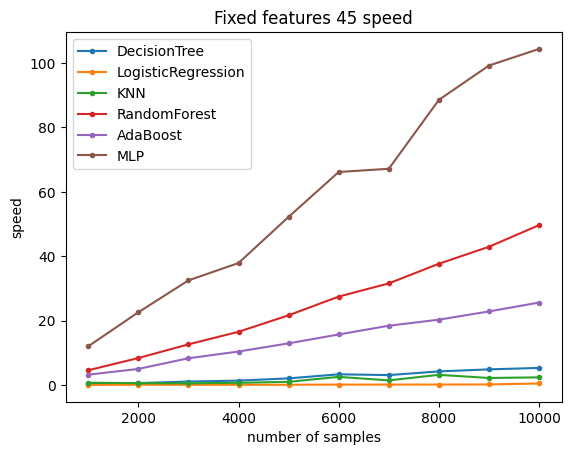

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.807165,0.870654,0.839883,0.877830,0.884079,0.837566,0.920000,0.912707,0.913284,0.898457
LogisticRegression,0.833580,0.892733,0.873994,0.891025,0.842913,0.836747,0.891476,0.847868,0.903003,0.891567
KNN,0.724923,0.736483,0.736250,0.718003,0.755804,0.743986,0.780520,0.770251,0.775895,0.800887
RandomForest,0.864309,0.908979,0.878152,0.910516,0.908828,0.894867,0.942079,0.916297,0.930972,0.923547
AdaBoost,0.842363,0.889803,0.835703,0.882400,0.838244,0.849288,0.917022,0.867240,0.897714,0.890030
MLP,0.819181,0.868970,0.855006,0.896057,0.892831,0.859850,0.919940,0.867710,0.890687,0.896080


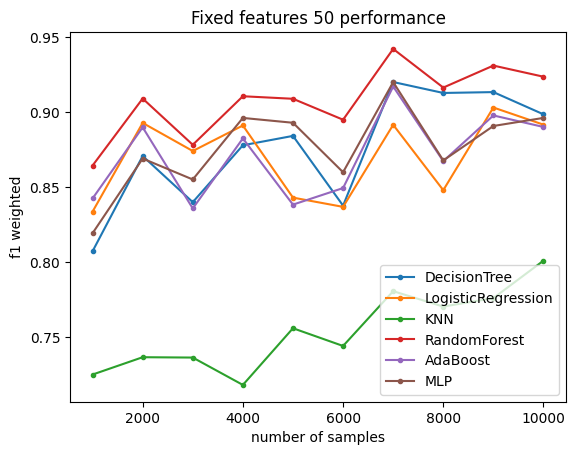

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.183068,0.125627,0.160152,0.125824,0.121506,0.166877,0.081012,0.086667,0.087132,0.103045
LogisticRegression,0.038833,0.018948,0.010294,0.016352,0.006542,0.006838,0.005019,0.004630,0.004748,0.001004
KNN,0.102718,0.118440,0.110022,0.111286,0.106048,0.108403,0.082773,0.090231,0.093261,0.086969
RandomForest,0.132724,0.091880,0.111010,0.090104,0.090749,0.103546,0.059947,0.082862,0.069386,0.077084
AdaBoost,0.128941,0.053705,0.055396,0.035100,0.026355,0.025730,0.015920,0.016973,0.012892,0.009351
MLP,0.184164,0.127271,0.135283,0.106040,0.106413,0.138328,0.081251,0.134942,0.110835,0.104337


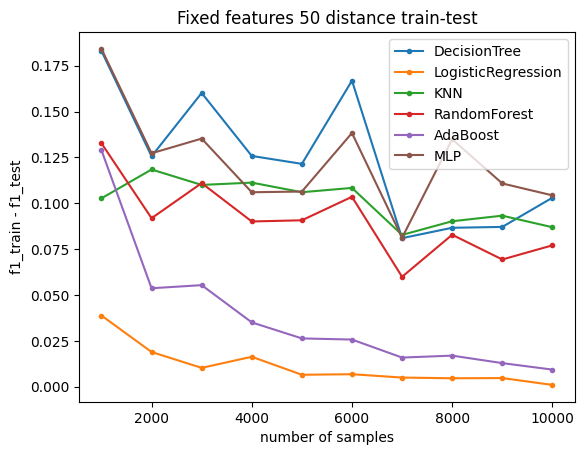

,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000
DecisionTree,0.462933,1.007072,1.577613,1.393383,2.187515,4.102466,3.382364,4.000794,5.063136,6.131892
LogisticRegression,0.071858,0.087821,0.102121,0.142094,0.121870,0.139988,0.168532,0.188133,0.334345,0.520243
KNN,0.641134,0.581515,0.527070,0.719474,0.956130,2.987584,1.441810,2.681417,2.062423,2.308339
RandomForest,5.051390,9.248192,13.755372,18.220958,24.917140,32.092369,35.898147,42.303047,50.520996,58.340815
AdaBoost,3.091041,5.796806,9.352322,11.473347,15.035014,17.738731,21.387680,23.924283,27.081825,29.963310
MLP,9.604304,22.129671,32.839048,38.335906,52.591900,70.490958,65.065994,91.304890,100.948568,108.829050


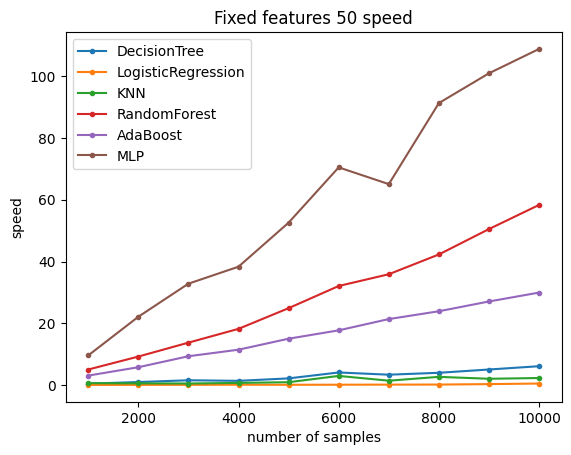

In [ ]:
for j in range(len(datasets_different_samples)):

    results_for_each_algorithm = []

    # For each algorithm, we compute the results on all the datasets
    for algorithm in CLASSIFICATION_ALGORITHMS:

        results_single_algorithm = []

        # Iteration over the different number of samples
        for i,dataset_i in enumerate(datasets_different_samples[j]):

            X = dataset_i[0]
            y = dataset_i[1]

            results_analysis = classification(X, y, algorithm, SEED)
            results_single_algorithm.append(results_analysis)

        results_for_each_algorithm.append(results_single_algorithm)

    # Generating the plots
    plot_type = ["performance","distance train-test","speed"]
    for plt_t in plot_type:
        plot(x_axis_values = range(min_num_of_samples, max_num_of_samples + 1, min_num_of_samples),
            x_label = "number of samples",
            results = results_for_each_algorithm,
            title = "Fixed features "+str((j+1)*min_num_of_features)+" "+plt_t,
            algorithms = CLASSIFICATION_ALGORITHMS,
            plot_type = plt_t)
